Connected to mcdet_lstm (Python 3.11.5)

In [ ]:
import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
available_sheets = [1, 2]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 20] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 20]

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)

In [ ]:
df_fault_times = df_fault_times.reset_index(drop=True)

In [ ]:
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

In [ ]:
j = 0

In [ ]:
fault_time = df_fault_times.iloc[j,1]

In [ ]:
fault_time

667.9244873384623

In [ ]:
df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 20]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_f_1,mdot_f_2,mdot_f_3,M_c_1,M_c_2,M_c_3,...,Te_f_1,Te_f_2,Te_f_3,P_1,P_2,P_3,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067231,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1297,648.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1298,649.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1299,649.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
1300,650.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426700,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4220.607611,4220.607611,4220.607611,327.7,327.7,327.7,167.212254,5858.892288,167.212254,...,1255.882281,1275.483964,1286.721627,1.408974e+07,6.151224e+07,1.355480e+07,983.042675,-4.113256,8.915679e+07,1164.656713
1997,998.5,4219.207404,4219.207404,4219.207404,327.7,327.7,327.7,167.156780,5856.948572,167.156780,...,1255.877625,1275.478025,1286.720849,1.408748e+07,6.150237e+07,1.355263e+07,983.042638,-3.662591,8.914248e+07,1164.680723
1998,999.0,4217.960754,4217.960754,4217.960754,327.7,327.7,327.7,167.107390,5855.218018,167.107390,...,1255.872733,1275.472066,1286.719978,1.408530e+07,6.149283e+07,1.355053e+07,983.042606,-4.153803,8.912866e+07,1164.703853
1999,999.5,4216.546728,4216.546728,4216.546728,327.7,327.7,327.7,167.051369,5853.255119,167.051369,...,1255.867883,1275.465927,1286.719160,1.408303e+07,6.148291e+07,1.354834e+07,983.042570,-2.988577,8.911428e+07,1164.728012


In [ ]:
df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 20]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_7,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1297,648.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1298,649.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1299,649.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1300,650.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,...,6.181804e+06,6.120605e+06,6.041921e+06,5.910781e+06,5.674728e+06,1.328960e+07,983.043245,-4.113256,8.742680e+07,1162.926850
1997,998.5,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,...,6.180807e+06,6.119618e+06,6.040947e+06,5.909828e+06,5.673814e+06,1.328746e+07,983.043210,-3.662591,8.741271e+07,1162.949626
1998,999.0,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,...,6.179776e+06,6.118598e+06,6.039939e+06,5.908842e+06,5.672867e+06,1.328524e+07,983.043174,-4.153803,8.739813e+07,1162.973117
1999,999.5,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,...,6.178782e+06,6.117613e+06,6.038968e+06,5.907891e+06,5.671954e+06,1.328311e+07,983.043141,-2.988577,8.738407e+07,1162.995670


In [ ]:
1162.926850 - 1164.656713

-1.729863000000023

In [ ]:
1142.695901 - 1143.884686



-1.1887850000000526

In [ ]:
range(len(df_list_rom))

range(0, 100)

In [ ]:
i = 0

In [ ]:
xl_rom = df_list_rom[i]
xl_hrm = df_list_hrm[i]

In [ ]:
xl_hrm['Tp'] - xl_rom['Tp']

1296   -1.188785
1297   -1.188785
1298   -1.188785
1299   -1.188785
1300   -1.188785
          ...   
1996   -1.729863
1997   -1.731097
1998   -1.730736
1999   -1.732343
2000   -1.729800
Name: Tp, Length: 705, dtype: float64

In [ ]:
xl_hrm

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_7,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1297,648.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1298,649.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1299,649.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1300,650.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,...,6.181804e+06,6.120605e+06,6.041921e+06,5.910781e+06,5.674728e+06,1.328960e+07,983.043245,-4.113256,8.742680e+07,1162.926850
1997,998.5,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,...,6.180807e+06,6.119618e+06,6.040947e+06,5.909828e+06,5.673814e+06,1.328746e+07,983.043210,-3.662591,8.741271e+07,1162.949626
1998,999.0,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,...,6.179776e+06,6.118598e+06,6.039939e+06,5.908842e+06,5.672867e+06,1.328524e+07,983.043174,-4.153803,8.739813e+07,1162.973117
1999,999.5,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,...,6.178782e+06,6.117613e+06,6.038968e+06,5.907891e+06,5.671954e+06,1.328311e+07,983.043141,-2.988577,8.738407e+07,1162.995670


In [ ]:
df_list_hrm[0]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_7,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1297,648.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1298,649.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1299,649.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695900
1300,650.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,7.055756e+06,6.985905e+06,6.896097e+06,6.746417e+06,6.476992e+06,1.516842e+07,983.070935,0.000000,9.978676e+07,1142.695901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,4221.936069,...,6.181804e+06,6.120605e+06,6.041921e+06,5.910781e+06,5.674728e+06,1.328960e+07,983.043245,-4.113256,8.742680e+07,1162.926850
1997,998.5,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,4220.534523,...,6.180807e+06,6.119618e+06,6.040947e+06,5.909828e+06,5.673814e+06,1.328746e+07,983.043210,-3.662591,8.741271e+07,1162.949626
1998,999.0,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,4219.286536,...,6.179776e+06,6.118598e+06,6.039939e+06,5.908842e+06,5.672867e+06,1.328524e+07,983.043174,-4.153803,8.739813e+07,1162.973117
1999,999.5,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,4217.871174,...,6.178782e+06,6.117613e+06,6.038968e+06,5.907891e+06,5.671954e+06,1.328311e+07,983.043141,-2.988577,8.738407e+07,1162.995670


In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

<ipython-input-22-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-22-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-22-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

In [ ]:
df_list_rom[0]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_f_1,mdot_f_2,mdot_f_3,M_c_1,M_c_2,M_c_3,...,Te_f_1,Te_f_2,Te_f_3,P_1,P_2,P_3,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067231,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1297,648.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1298,649.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1299,649.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
1300,650.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426700,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4220.607611,4220.607611,4220.607611,327.7,327.7,327.7,167.212254,5858.892288,167.212254,...,1255.882281,1275.483964,1286.721627,1.408974e+07,6.151224e+07,1.355480e+07,983.042675,-4.113256,8.915679e+07,1164.656713
1997,998.5,4219.207404,4219.207404,4219.207404,327.7,327.7,327.7,167.156780,5856.948572,167.156780,...,1255.877625,1275.478025,1286.720849,1.408748e+07,6.150237e+07,1.355263e+07,983.042638,-3.662591,8.914248e+07,1164.680723
1998,999.0,4217.960754,4217.960754,4217.960754,327.7,327.7,327.7,167.107390,5855.218018,167.107390,...,1255.872733,1275.472066,1286.719978,1.408530e+07,6.149283e+07,1.355053e+07,983.042606,-4.153803,8.912866e+07,1164.703853
1999,999.5,4216.546728,4216.546728,4216.546728,327.7,327.7,327.7,167.051369,5853.255119,167.051369,...,1255.867883,1275.465927,1286.719160,1.408303e+07,6.148291e+07,1.354834e+07,983.042570,-2.988577,8.911428e+07,1164.728012


In [ ]:
xl_hrm[0]

KeyError: 0

In [ ]:
xl_hrm

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp,delta_Tp
1068,534.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695793,-1.188788
1069,534.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695794,-1.188788
1070,535.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695795,-1.188788
1071,535.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695796,-1.188788
1072,536.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978668e+07,1142.695797,-1.188788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,...,3.484118e+06,3.439328e+06,3.364677e+06,3.230306e+06,7.565028e+06,982.922662,-10.306180,4.976720e+07,1222.240897,-3.545573
1997,998.5,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,...,3.478837e+06,3.434114e+06,3.359577e+06,3.225409e+06,7.553560e+06,982.922340,-11.653505,4.969175e+07,1222.353857,-3.546629
1998,999.0,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,...,3.473596e+06,3.428941e+06,3.354516e+06,3.220550e+06,7.542181e+06,982.922030,-10.335906,4.961689e+07,1222.465465,-3.554453
1999,999.5,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,...,3.468170e+06,3.423585e+06,3.349276e+06,3.215519e+06,7.530400e+06,982.921675,-11.867585,4.953939e+07,1222.583043,-3.554199


In [ ]:
df_list_hrm[-1]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp,delta_Tp
1068,534.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695793,-1.188788
1069,534.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695794,-1.188788
1070,535.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695795,-1.188788
1071,535.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978667e+07,1142.695796,-1.188788
1072,536.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985899e+06,6.896091e+06,6.746411e+06,6.476987e+06,1.516841e+07,983.070935,0.000000,9.978668e+07,1142.695797,-1.188788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,1677.936370,...,3.484118e+06,3.439328e+06,3.364677e+06,3.230306e+06,7.565028e+06,982.922662,-10.306180,4.976720e+07,1222.240897,-3.545573
1997,998.5,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,1674.424654,...,3.478837e+06,3.434114e+06,3.359577e+06,3.225409e+06,7.553560e+06,982.922340,-11.653505,4.969175e+07,1222.353857,-3.546629
1998,999.0,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,1670.453852,...,3.473596e+06,3.428941e+06,3.354516e+06,3.220550e+06,7.542181e+06,982.922030,-10.335906,4.961689e+07,1222.465465,-3.554453
1999,999.5,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,1666.932006,...,3.468170e+06,3.423585e+06,3.349276e+06,3.215519e+06,7.530400e+06,982.921675,-11.867585,4.953939e+07,1222.583043,-3.554199


In [ ]:
n_trials = 100

In [ ]:
df_list_rom[0].max(axis=1)

1296    1.013469e+08
1297    1.013469e+08
1298    1.013469e+08
1299    1.013469e+08
1300    1.013469e+08
            ...     
1996    8.915679e+07
1997    8.914248e+07
1998    8.912866e+07
1999    8.911428e+07
2000    8.910165e+07
Length: 705, dtype: float64

In [ ]:
df_list_rom[0].max(axis=0)

t[s]           1.000000e+03
mdot_c_1       5.550500e+03
mdot_c_2       5.550500e+03
mdot_c_3       5.550500e+03
mdot_f_1       3.277000e+02
mdot_f_2       3.277000e+02
mdot_f_3       3.277000e+02
M_c_1          2.199000e+02
M_c_2          7.705000e+03
M_c_3          2.199000e+02
tf_1           1.271689e+03
tf_2           1.270747e+03
tf_3           1.284275e+03
tc_1           9.977962e+02
tc_2           1.062104e+03
tc_3           1.121865e+03
tw_1           1.071347e+03
tw_2           1.113618e+03
tw_3           1.164749e+03
Te_c_1         1.012550e+03
Te_c_2         1.111658e+03
Te_c_3         1.132072e+03
Te_f_1         1.260427e+03
Te_f_2         1.281067e+03
Te_f_3         1.287491e+03
P_1            1.601619e+07
P_2            6.992262e+07
P_3            1.540811e+07
Tin_c          9.830706e+02
mdot_c_leak    0.000000e+00
P_tot          1.013469e+08
Tp             1.164749e+03
dtype: float64

In [ ]:
pd.concat([df_list_rom[i].max() for i in range(2)], axis=1)

,0,1
t[s],1.000000e+03,1.000000e+03
mdot_c_1,5.550500e+03,5.550500e+03
mdot_c_2,5.550500e+03,5.550500e+03
mdot_c_3,5.550500e+03,5.550500e+03
mdot_f_1,3.277000e+02,3.277000e+02
mdot_f_2,3.277000e+02,3.277000e+02
mdot_f_3,3.277000e+02,3.277000e+02
M_c_1,2.199000e+02,2.199000e+02
M_c_2,7.705000e+03,7.705000e+03
M_c_3,2.199000e+02,2.199000e+02


In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
max_rom

t[s]           1.000000e+03
mdot_c_1       5.550500e+03
mdot_c_2       5.550500e+03
mdot_c_3       5.550500e+03
mdot_f_1       3.277000e+02
mdot_f_2       3.277000e+02
mdot_f_3       3.277000e+02
M_c_1          2.199000e+02
M_c_2          7.705000e+03
M_c_3          2.199000e+02
tf_1           1.271689e+03
tf_2           1.270747e+03
tf_3           1.284275e+03
tc_1           1.010017e+03
tc_2           1.108091e+03
tc_3           1.189623e+03
tw_1           1.122001e+03
tw_2           1.169212e+03
tw_3           1.226260e+03
Te_c_1         1.037114e+03
Te_c_2         1.179068e+03
Te_c_3         1.200177e+03
Te_f_1         1.260427e+03
Te_f_2         1.281067e+03
Te_f_3         1.287496e+03
P_1            1.601620e+07
P_2            6.992264e+07
P_3            1.540811e+07
Tin_c          9.830706e+02
mdot_c_leak    0.000000e+00
P_tot          1.013469e+08
Tp             1.226260e+03
dtype: float64

In [ ]:
i

99

In [ ]:
i = 0

In [ ]:
df_list_rom_norm[i]['t[s]']

NameError: name 'df_list_rom_norm' is not defined

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

In [ ]:
df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
df_list_rom[0]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_f_1,mdot_f_2,mdot_f_3,M_c_1,M_c_2,M_c_3,...,Te_f_1,Te_f_2,Te_f_3,P_1,P_2,P_3,Tin_c,mdot_c_leak,P_tot,Tp
1296,648.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067231,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1297,648.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483283,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1298,649.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067232,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884685
1299,649.5,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426699,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
1300,650.0,5550.500000,5550.500000,5550.500000,327.7,327.7,327.7,219.900000,7705.000000,219.900000,...,1260.426700,1281.067233,1287.483284,1.601619e+07,6.992262e+07,1.540811e+07,983.070580,0.000000,1.013469e+08,1143.884686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,4220.607611,4220.607611,4220.607611,327.7,327.7,327.7,167.212254,5858.892288,167.212254,...,1255.882281,1275.483964,1286.721627,1.408974e+07,6.151224e+07,1.355480e+07,983.042675,-4.113256,8.915679e+07,1164.656713
1997,998.5,4219.207404,4219.207404,4219.207404,327.7,327.7,327.7,167.156780,5856.948572,167.156780,...,1255.877625,1275.478025,1286.720849,1.408748e+07,6.150237e+07,1.355263e+07,983.042638,-3.662591,8.914248e+07,1164.680723
1998,999.0,4217.960754,4217.960754,4217.960754,327.7,327.7,327.7,167.107390,5855.218018,167.107390,...,1255.872733,1275.472066,1286.719978,1.408530e+07,6.149283e+07,1.355053e+07,983.042606,-4.153803,8.912866e+07,1164.703853
1999,999.5,4216.546728,4216.546728,4216.546728,327.7,327.7,327.7,167.051369,5853.255119,167.051369,...,1255.867883,1275.465927,1286.719160,1.408303e+07,6.148291e+07,1.354834e+07,983.042570,-2.988577,8.911428e+07,1164.728012


In [ ]:
df_list_rom_norm[0]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_f_1,mdot_f_2,mdot_f_3,M_c_1,M_c_2,M_c_3,...,Te_f_1,Te_f_2,Te_f_3,P_1,P_2,P_3,Tin_c,mdot_c_leak,P_tot,Tp
1296,0.305720,1.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,...,0.999998,0.999996,0.996004,0.999999,0.999999,0.999999,0.999938,1.000000,0.999999,0.000002
1297,0.306706,1.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,...,0.999998,0.999996,0.996005,0.999999,0.999999,0.999999,0.999938,1.000000,0.999999,0.000002
1298,0.307692,1.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,...,0.999998,0.999996,0.996005,0.999999,0.999999,0.999999,0.999938,1.000000,0.999999,0.000002
1299,0.308679,1.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,...,0.999998,0.999996,0.996005,0.999999,0.999999,0.999999,0.999938,1.000000,0.999999,0.000002
1300,0.309665,1.000000,1.000000,1.000000,NaN,NaN,NaN,1.000000,1.000000,1.000000,...,0.999998,0.999996,0.996005,0.999999,0.999999,0.999999,0.999938,1.000000,0.999999,0.000002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,0.996055,0.658233,0.658233,0.658233,NaN,NaN,NaN,0.658233,0.658233,0.658233,...,0.654663,0.698497,0.751916,0.757794,0.757794,0.757794,0.815025,0.811286,0.757794,0.252164
1997,0.997041,0.657873,0.657873,0.657873,NaN,NaN,NaN,0.657873,0.657873,0.657873,...,0.654309,0.698177,0.751667,0.757510,0.757510,0.757510,0.814786,0.831962,0.757510,0.252456
1998,0.998028,0.657553,0.657553,0.657553,NaN,NaN,NaN,0.657553,0.657553,0.657553,...,0.653937,0.697855,0.751387,0.757235,0.757235,0.757235,0.814569,0.809425,0.757235,0.252737
1999,0.999014,0.657189,0.657189,0.657189,NaN,NaN,NaN,0.657189,0.657189,0.657189,...,0.653569,0.697523,0.751125,0.756949,0.756949,0.756949,0.814330,0.862885,0.756949,0.253030


In [ ]:
df_list_rom[0].columns

Index(['t[s]', 'mdot_c_1', 'mdot_c_2', 'mdot_c_3', 'mdot_f_1', 'mdot_f_2',
       'mdot_f_3', 'M_c_1', 'M_c_2', 'M_c_3', 'tf_1', 'tf_2', 'tf_3', 'tc_1',
       'tc_2', 'tc_3', 'tw_1', 'tw_2', 'tw_3', 'Te_c_1', 'Te_c_2', 'Te_c_3',
       'Te_f_1', 'Te_f_2', 'Te_f_3', 'P_1', 'P_2', 'P_3', 'Tin_c',
       'mdot_c_leak', 'P_tot', 'Tp'],
      dtype='object')

In [ ]:
max_rom['t[s]']

1000.0

In [ ]:
max_rom['Tp']

1226.2602275294164

In [ ]:
max_hrm['delta_Tp']

-1.1887843368212998

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

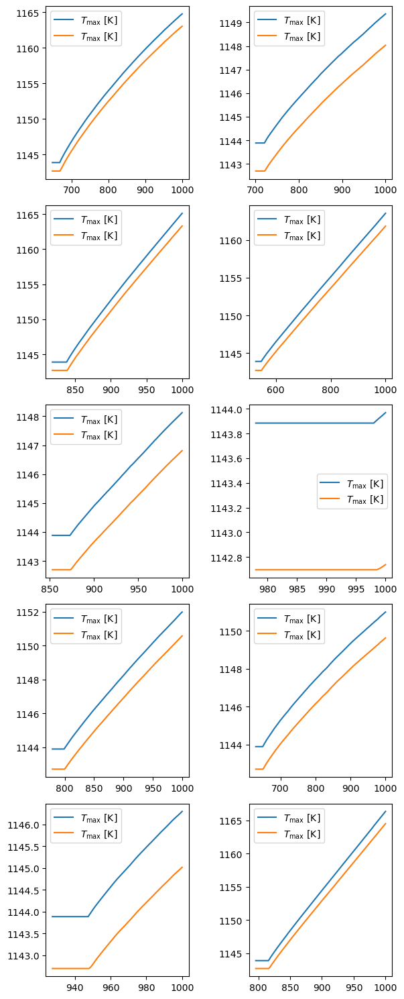

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[id_list]
        xl_rom = df_list_rom[id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
i = 0

In [ ]:
df_list_hrm[i]['t[s]'].values



array([ 648. ,  648.5,  649. ,  649.5,  650. ,  650.5,  651. ,  651.5,
        652. ,  652.5,  653. ,  653.5,  654. ,  654.5,  655. ,  655.5,
        656. ,  656.5,  657. ,  657.5,  658. ,  658.5,  659. ,  659.5,
        660. ,  660.5,  661. ,  661.5,  662. ,  662.5,  663. ,  663.5,
        664. ,  664.5,  665. ,  665.5,  666. ,  666.5,  667. ,  667.5,
        668. ,  668.5,  669. ,  669.5,  670. ,  670.5,  671. ,  671.5,
        672. ,  672.5,  673. ,  673.5,  674. ,  674.5,  675. ,  675.5,
        676. ,  676.5,  677. ,  677.5,  678. ,  678.5,  679. ,  679.5,
        680. ,  680.5,  681. ,  681.5,  682. ,  682.5,  683. ,  683.5,
        684. ,  684.5,  685. ,  685.5,  686. ,  686.5,  687. ,  687.5,
        688. ,  688.5,  689. ,  689.5,  690. ,  690.5,  691. ,  691.5,
        692. ,  692.5,  693. ,  693.5,  694. ,  694.5,  695. ,  695.5,
        696. ,  696.5,  697. ,  697.5,  698. ,  698.5,  699. ,  699.5,
        700. ,  700.5,  701. ,  701.5,  702. ,  702.5,  703. ,  703.5,
      

In [ ]:
df_fault_times.iloc[0,:]

Simulation          0.000000
Fault time [s]    667.924487
Name: 0, dtype: float64

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.7):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
dataset

[array([[0.00000000e+00, 6.48000000e+02, 1.00000000e+00, ...,
         9.95169297e-01, 9.99937306e-01, 9.99999662e-01],
        [0.00000000e+00, 6.48500000e+02, 1.00000000e+00, ...,
         9.95169457e-01, 9.99937305e-01, 9.99999664e-01],
        [0.00000000e+00, 6.49000000e+02, 1.00000000e+00, ...,
         9.95169616e-01, 9.99937305e-01, 9.99999666e-01],
        ...,
        [0.00000000e+00, 9.99000000e+02, 8.09425283e-01, ...,
         7.45153299e-01, 8.14347264e-01, 7.71785621e-01],
        [0.00000000e+00, 9.99500000e+02, 8.62885365e-01, ...,
         7.44874433e-01, 8.14131446e-01, 7.71109001e-01],
        [0.00000000e+00, 1.00000000e+03, 8.30011822e-01, ...,
         7.44613545e-01, 8.13885979e-01, 7.72179652e-01]]),
 array([[1.00000000e+00, 8.18000000e+02, 1.00000000e+00, ...,
         9.95191705e-01, 9.99937268e-01, 9.99999964e-01],
        [1.00000000e+00, 8.18500000e+02, 1.00000000e+00, ...,
         9.95191723e-01, 9.99937268e-01, 9.99999964e-01],
        [1.00000000e+00, 

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.7):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.7):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(200, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.0)),
        #Dropout(0.1),
        keras.layers.LSTM(100, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(50, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
#train, test = split_dataset(dataset, n_input, n_out)
train, test = select_random_dataset(dataset, n_input, n_out, total_samples=50000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.0)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


852/875 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0863
Epoch 1: val_loss improved from inf to 0.00222, saving model to weights-improvement-01-0.00.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0846 - val_loss: 0.0022
Epoch 2/50
868/875 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0028
Epoch 2: val_loss improved from 0.00222 to 0.00165, saving model to weights-improvement-02-0.00.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0028 - val_loss: 0.0017
Epoch 3/50
861/875 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0024
Epoch 3: val_loss improved from 0.00165 to 0.00153, saving model to weights-improvement-03-0.00.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 4/50
855/875 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0022
Epoch 4: val_loss improved from 0.00153 to 0.00142, saving model to weights-improvement-04-0.00.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0022 - val_loss: 0.0014
Epoch 5/50
865/875 ━━━━━━━━━━━━━━━━━━━━

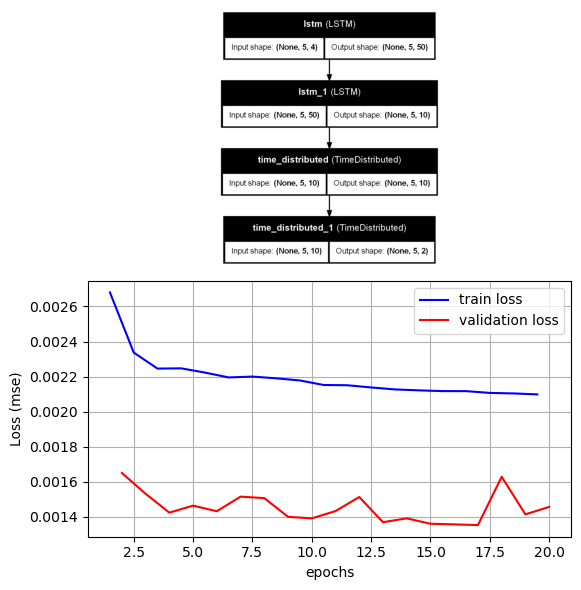

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 21)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:20], backup.history['loss'][1:20], label='train loss', color='b')
ax2.plot(epochs[1:20], backup.history['val_loss'][1:20], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (20,) and (19,)

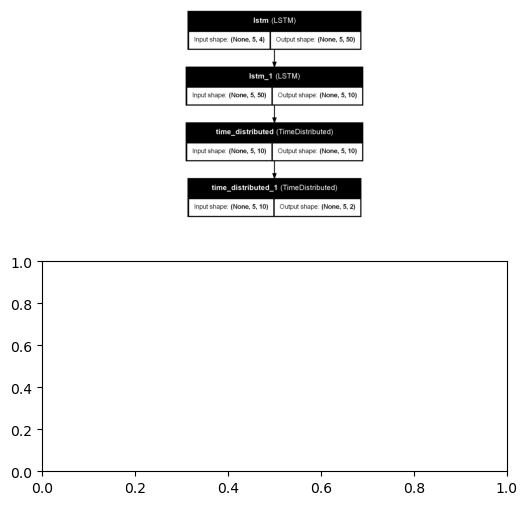

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 21)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:20], backup.history['loss'][1:20], label='train loss', color='b')
ax2.plot(epochs[:20], backup.history['val_loss'][1:20], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

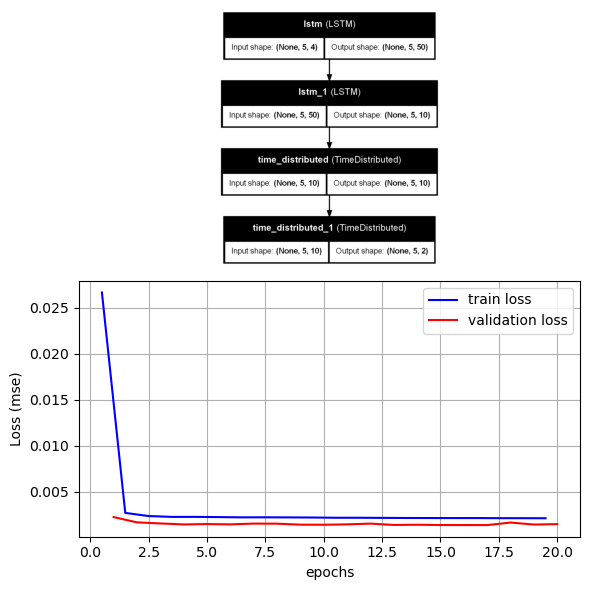

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 21)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:20], backup.history['loss'][:20], label='train loss', color='b')
ax2.plot(epochs[:20], backup.history['val_loss'][:20], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

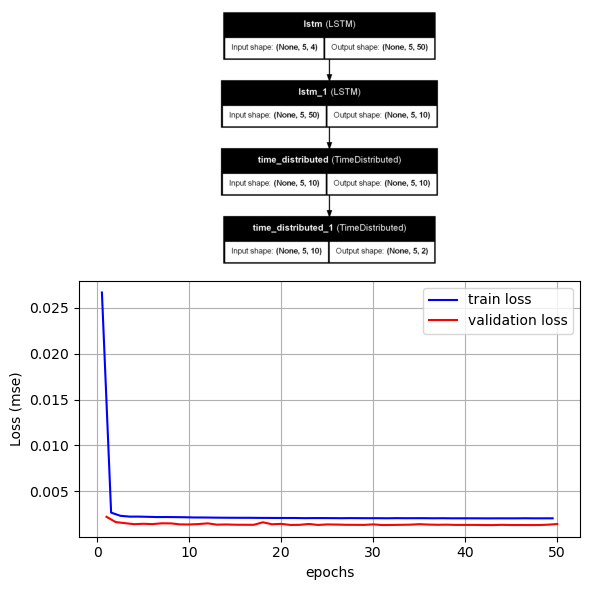

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:50], backup.history['loss'][:50], label='train loss', color='b')
ax2.plot(epochs[:50], backup.history['val_loss'][:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
867/875 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3727
Epoch 1: val_loss improved from inf to 0.03756, saving model to weights-improvement-01-0.04.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.3706 - val_loss: 0.0376
Epoch 2/50
873/875 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0342
Epoch 2: val_loss improved from 0.03756 to 0.02577, saving model to weights-improvement-02-0.03.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0342 - val_loss: 0.0258
Epoch 3/50
870/875 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0255
Epoch 3: val_loss improved from 0.02577 to 0.02191, saving model to weights-improvement-03-0.02.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0255 - val_loss: 0.0219
Epoch 4/50
868/875 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0220
Epoch 4: val_loss improved from 0.02191 to 0.01986, saving model to weights-improvement-04-0.02.keras
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0220 - val_loss: 0.0199
Epoch 5/50
868/875 ━━━━━━━━━

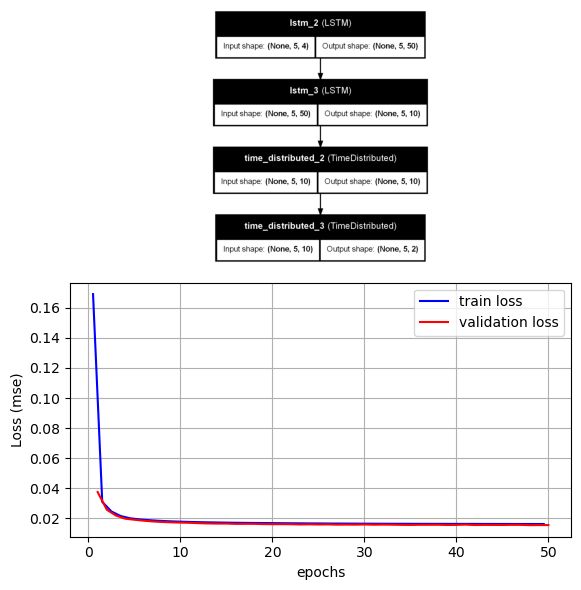

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:50], backup.history['loss'][:50], label='train loss', color='b')
ax2.plot(epochs[:50], backup.history['val_loss'][:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

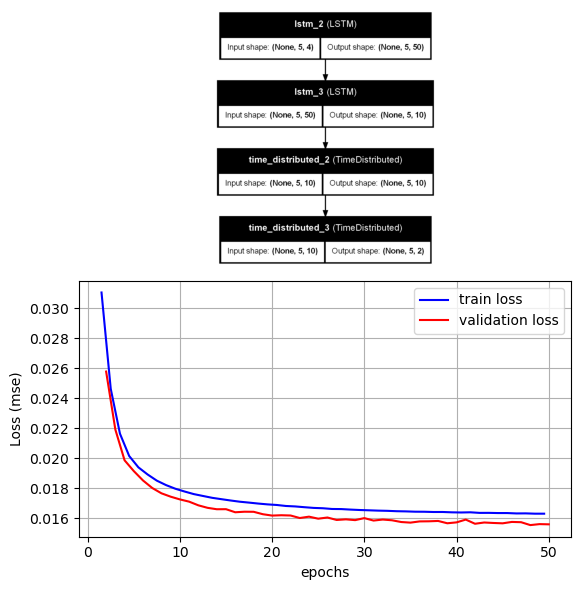

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=50000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
883/898 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6795
Epoch 1: val_loss improved from inf to 0.42908, saving model to weights-improvement-01-0.43.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.6766 - val_loss: 0.4291
Epoch 2/50
893/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4287
Epoch 2: val_loss improved from 0.42908 to 0.42535, saving model to weights-improvement-02-0.43.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.4287 - val_loss: 0.4254
Epoch 3/50
885/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4263
Epoch 3: val_loss improved from 0.42535 to 0.42439, saving model to weights-improvement-03-0.42.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.4263 - val_loss: 0.4244
Epoch 4/50
892/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4247
Epoch 4: val_loss improved from 0.42439 to 0.42404, saving model to weights-improvement-04-0.42.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.4247 - val_loss: 0.4240
Epoch 5/50
887/898 ━━━━━━━━━

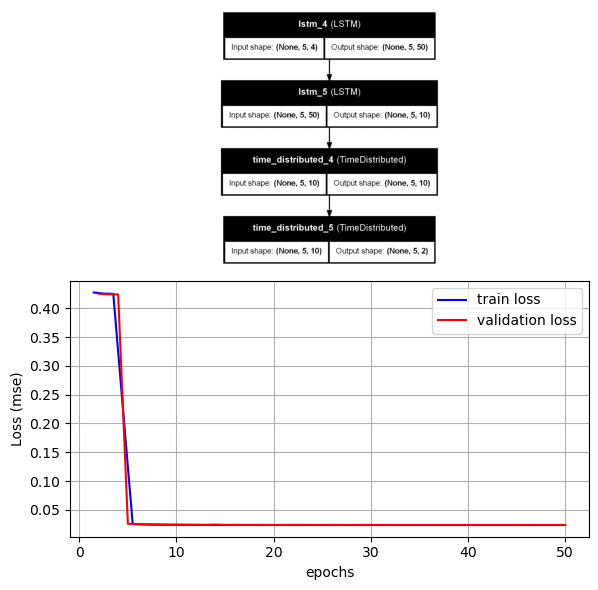

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

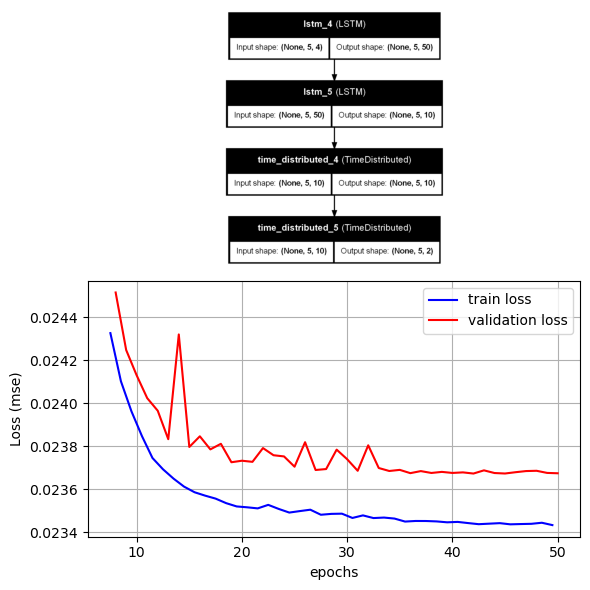

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[7:50], backup.history['loss'][7:50], label='train loss', color='b')
ax2.plot(epochs[7:50], backup.history['val_loss'][7:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475]]], dtype=float32)

In [ ]:
to_test[1][0]

array([[0.6799235 , 0.9054684 ],
       [0.72666419, 0.90494588],
       [0.66726049, 0.90558348],
       [0.73428018, 0.90432391],
       [0.66433153, 0.90526636]])

In [ ]:
to_test[2][0]

IndexError: tuple index out of range

In [ ]:
to_test[0][1]

array([[0.87005057, 0.00508516, 0.99356504, 0.99599565],
       [0.8602115 , 0.00525391, 0.99346684, 0.99586317],
       [0.86050067, 0.00541558, 0.99334109, 0.9957506 ],
       [0.85744928, 0.00557702, 0.99321763, 0.99563253],
       [0.87051185, 0.00573722, 0.99309151, 0.99551404]])

In [ ]:
forecast(model,to_test[0][1], 4)

array([[[0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475]]], dtype=float32)

In [ ]:
forecast(model,to_test[0][2], 4)

array([[[0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475],
        [0.7034878 , 0.89259475]]], dtype=float32)

In [ ]:
to_test[1][2]

array([[0.56857769, 0.91466702],
       [0.60033525, 0.91337135],
       [0.60430935, 0.9133573 ],
       [0.57193498, 0.9130926 ],
       [0.60286074, 0.91199949]])

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=50000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3580
Epoch 1: val_loss improved from inf to 0.02390, saving model to weights-improvement-01-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3568 - val_loss: 0.0239
Epoch 2/50
893/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0203
Epoch 2: val_loss improved from 0.02390 to 0.01600, saving model to weights-improvement-02-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0202 - val_loss: 0.0160
Epoch 3/50
895/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0155
Epoch 3: val_loss improved from 0.01600 to 0.01445, saving model to weights-improvement-03-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0155 - val_loss: 0.0145
Epoch 4/50
894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0139
Epoch 4: val_loss improved from 0.01445 to 0.01328, saving model to weights-improvement-04-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0139 - val_loss: 0.0133
Epoch 5/50
885/898 ━━━━━━━━━━━━━━━━━━━━

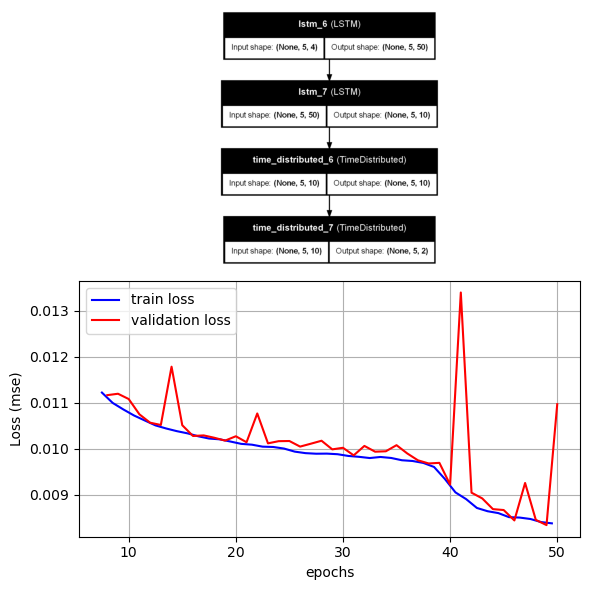

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[7:50], backup.history['loss'][7:50], label='train loss', color='b')
ax2.plot(epochs[7:50], backup.history['val_loss'][7:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (44,) and (43,)

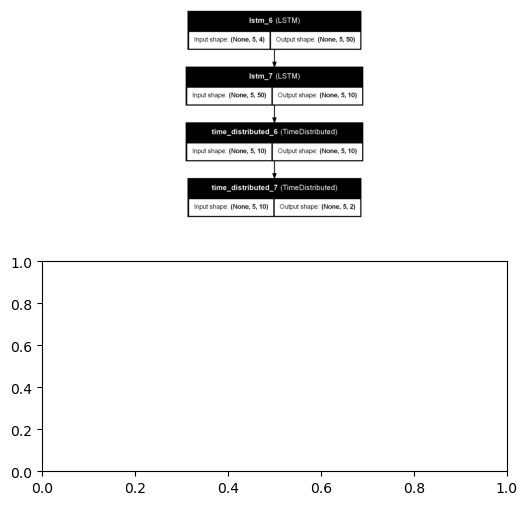

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[6:50], backup.history['loss'][7:50], label='train loss', color='b')
ax2.plot(epochs[6:50], backup.history['val_loss'][7:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

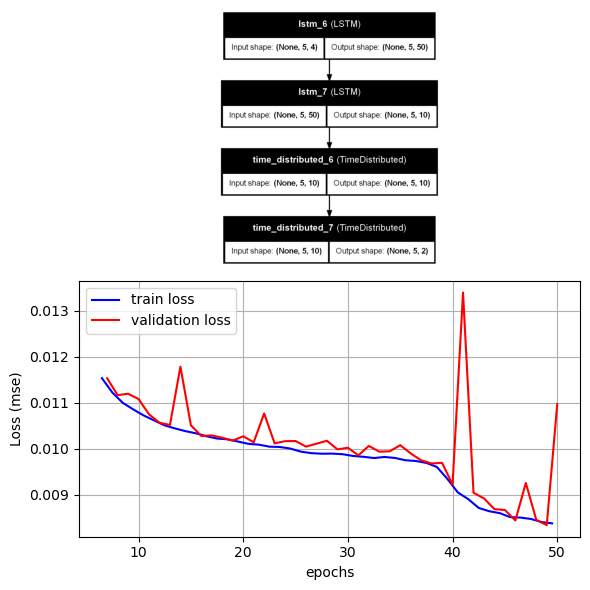

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[6:50], backup.history['loss'][6:50], label='train loss', color='b')
ax2.plot(epochs[6:50], backup.history['val_loss'][6:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (44,) and (45,)

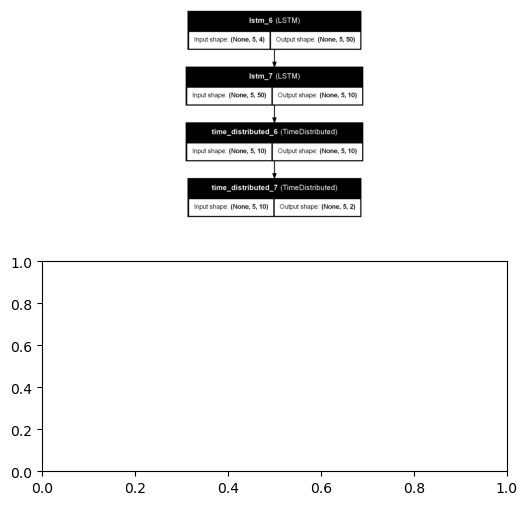

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[6:50], backup.history['loss'][5:50], label='train loss', color='b')
ax2.plot(epochs[6:50], backup.history['val_loss'][5:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

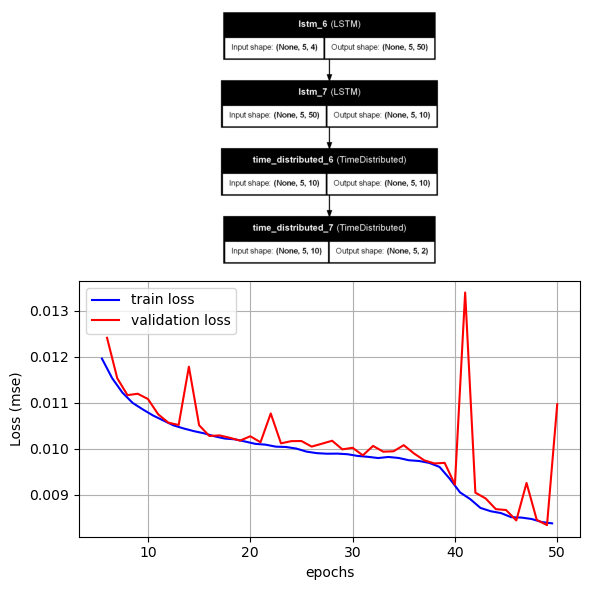

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[5:50], backup.history['loss'][5:50], label='train loss', color='b')
ax2.plot(epochs[5:50], backup.history['val_loss'][5:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.66732824, 0.89254177],
        [0.30950046, 0.80821216],
        [0.25793296, 0.9116563 ],
        [0.20937501, 0.8931094 ],
        [0.21258153, 0.9204731 ]]], dtype=float32)

In [ ]:
to_test[0][0]

array([[0.20266497, 0.00496015, 0.99925872, 0.99547492],
       [0.31194835, 0.00582681, 0.99925236, 0.99484404],
       [0.2761339 , 0.00670797, 0.99917928, 0.99416188],
       [0.28180128, 0.00755155, 0.99891754, 0.99356458],
       [0.34332699, 0.00838996, 0.998609  , 0.99294716]])

In [ ]:
forecast(model,to_test[0][0], 4)

array([[[0.66732824, 0.89254177],
        [0.30950046, 0.80821216],
        [0.25793296, 0.9116563 ],
        [0.20937501, 0.8931094 ],
        [0.21258153, 0.9204731 ]]], dtype=float32)

In [ ]:
to_test[1][0]

array([[0.35303688, 0.93152049],
       [0.35358705, 0.93176823],
       [0.34109938, 0.93171283],
       [0.27802353, 0.93117896],
       [0.31739307, 0.92923335]])

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


879/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3093
Epoch 1: val_loss improved from inf to 0.01865, saving model to weights-improvement-01-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.3050 - val_loss: 0.0186
Epoch 2/50
884/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0163
Epoch 2: val_loss improved from 0.01865 to 0.01364, saving model to weights-improvement-02-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0163 - val_loss: 0.0136
Epoch 3/50
887/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0133
Epoch 3: val_loss improved from 0.01364 to 0.01237, saving model to weights-improvement-03-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0133 - val_loss: 0.0124
Epoch 4/50
890/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0117
Epoch 4: val_loss improved from 0.01237 to 0.01091, saving model to weights-improvement-04-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0117 - val_loss: 0.0109
Epoch 5/50
896/898 ━━━━━━━━━━━━━━━━━━━━

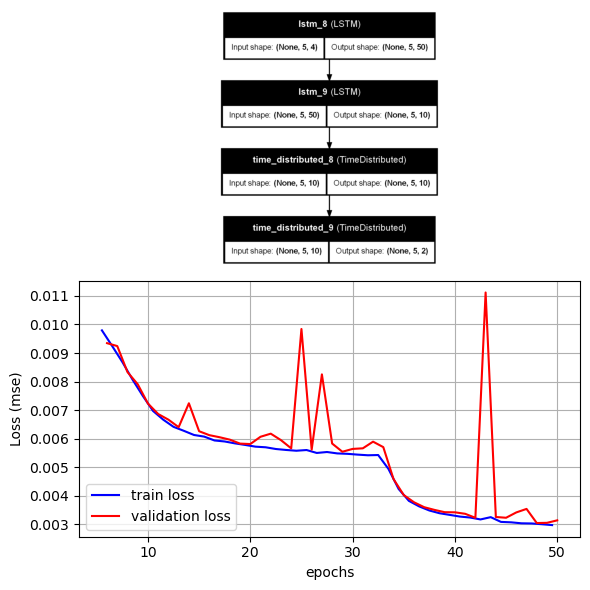

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[5:50], backup.history['loss'][5:50], label='train loss', color='b')
ax2.plot(epochs[5:50], backup.history['val_loss'][5:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (48,) and (45,)

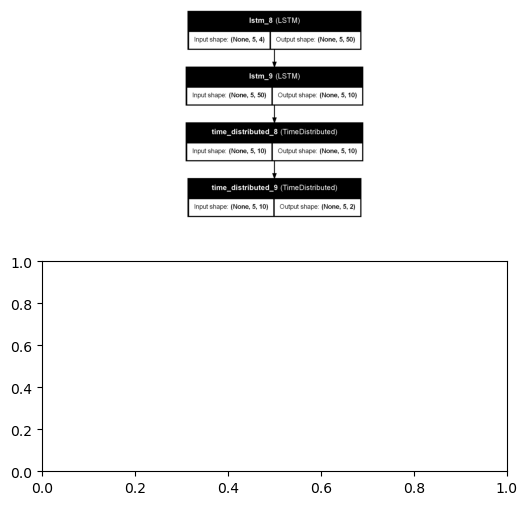

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[2:50], backup.history['loss'][5:50], label='train loss', color='b')
ax2.plot(epochs[2:50], backup.history['val_loss'][5:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

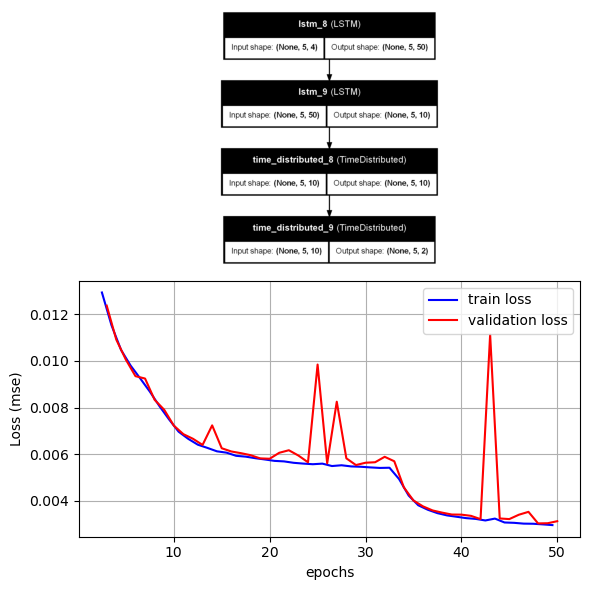

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[2:50], backup.history['loss'][2:50], label='train loss', color='b')
ax2.plot(epochs[2:50], backup.history['val_loss'][2:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

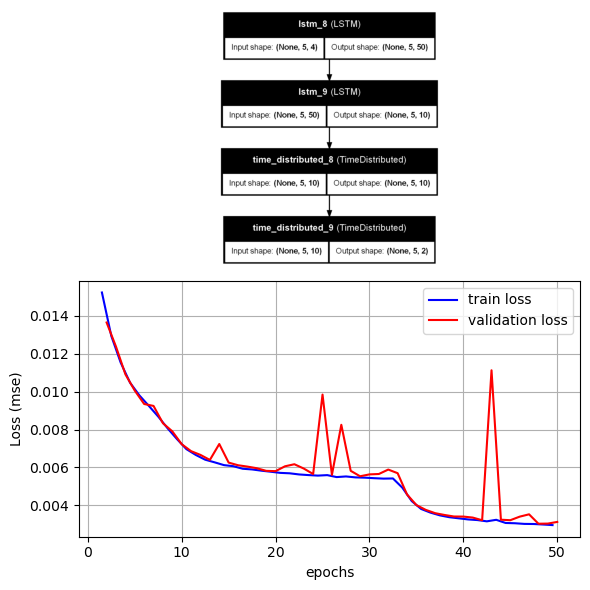

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.27543598, 0.8911545 ],
        [0.28388438, 0.92033947],
        [0.31944776, 0.9229579 ],
        [0.30777854, 0.9239155 ],
        [0.33518326, 0.905134  ]]], dtype=float32)

In [ ]:
len(train)

35883

In [ ]:
len(test)

15439

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
#train, test = split_dataset(dataset, n_input, n_out)
train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
686/700 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5493
Epoch 1: val_loss improved from inf to 0.27691, saving model to weights-improvement-01-0.28.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5456 - val_loss: 0.2769
Epoch 2/50
699/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2751
Epoch 2: val_loss improved from 0.27691 to 0.27437, saving model to weights-improvement-02-0.27.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.2751 - val_loss: 0.2744
Epoch 3/50
688/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2748
Epoch 3: val_loss improved from 0.27437 to 0.27339, saving model to weights-improvement-03-0.27.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2748 - val_loss: 0.2734
Epoch 4/50
689/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2730
Epoch 4: val_loss improved from 0.27339 to 0.27282, saving model to weights-improvement-04-0.27.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2730 - val_loss: 0.2728
Epoch 5/50
691/700 ━━━━━━━━━

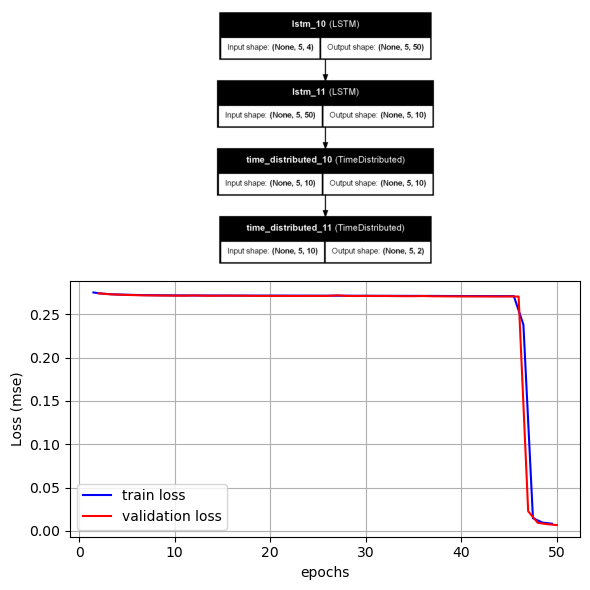

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
683/700 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6738
Epoch 1: val_loss improved from inf to 0.39264, saving model to weights-improvement-01-0.39.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.6696 - val_loss: 0.3926
Epoch 2/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4058
Epoch 2: val_loss improved from 0.39264 to 0.39113, saving model to weights-improvement-02-0.39.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4058 - val_loss: 0.3911
Epoch 3/50
694/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4054
Epoch 3: val_loss did not improve from 0.39113
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4054 - val_loss: 0.3911
Epoch 4/50
698/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4057
Epoch 4: val_loss improved from 0.39113 to 0.39112, saving model to weights-improvement-04-0.39.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4057 - val_loss: 0.3911
Epoch 5/50
689/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4072
Epoch 5: val_los

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.005))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
683/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2926
Epoch 1: val_loss improved from inf to 0.03115, saving model to weights-improvement-01-0.03.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.2886 - val_loss: 0.0312
Epoch 2/50
688/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0273
Epoch 2: val_loss improved from 0.03115 to 0.01958, saving model to weights-improvement-02-0.02.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0272 - val_loss: 0.0196
Epoch 3/50
690/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0196
Epoch 3: val_loss improved from 0.01958 to 0.01697, saving model to weights-improvement-03-0.02.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0196 - val_loss: 0.0170
Epoch 4/50
683/700 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0174
Epoch 4: val_loss improved from 0.01697 to 0.01558, saving model to weights-improvement-04-0.02.keras
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0173 - val_loss: 0.0156
Epoch 5/50
681/700 ━━━━━━━━━

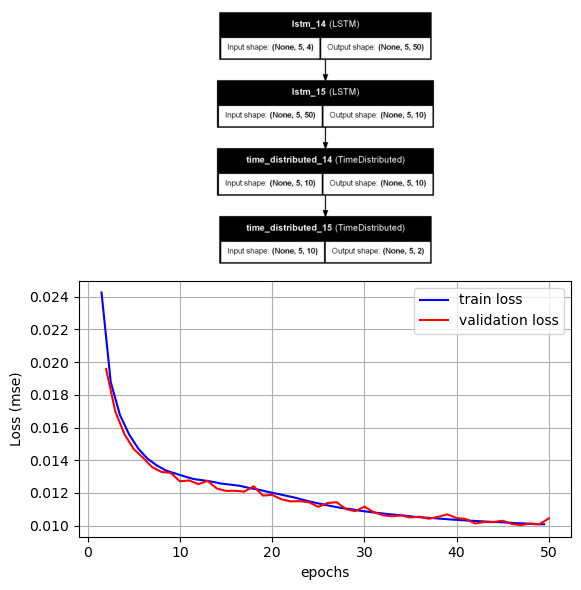

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
883/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2558
Epoch 1: val_loss improved from inf to 0.02486, saving model to weights-improvement-01-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.2532 - val_loss: 0.0249
Epoch 2/50
894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0216
Epoch 2: val_loss improved from 0.02486 to 0.01642, saving model to weights-improvement-02-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0216 - val_loss: 0.0164
Epoch 3/50
894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0159
Epoch 3: val_loss improved from 0.01642 to 0.01373, saving model to weights-improvement-03-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0159 - val_loss: 0.0137
Epoch 4/50
898/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0137
Epoch 4: val_loss improved from 0.01373 to 0.01225, saving model to weights-improvement-04-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0137 - val_loss: 0.0122
Epoch 5/50
898/898 ━━━━━━━━━

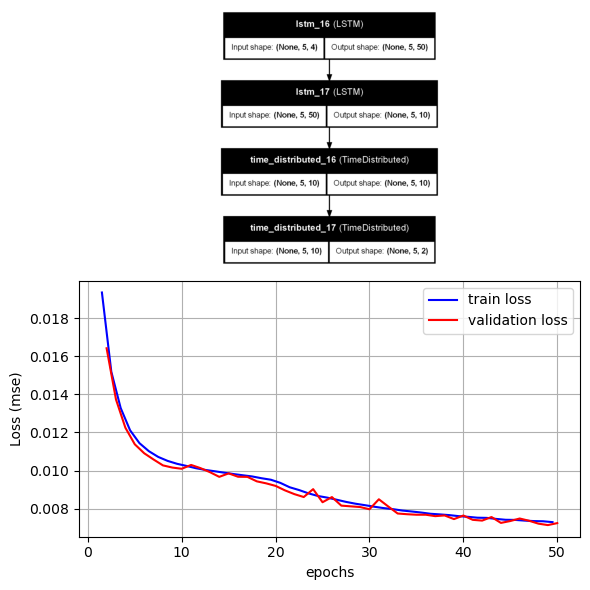

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

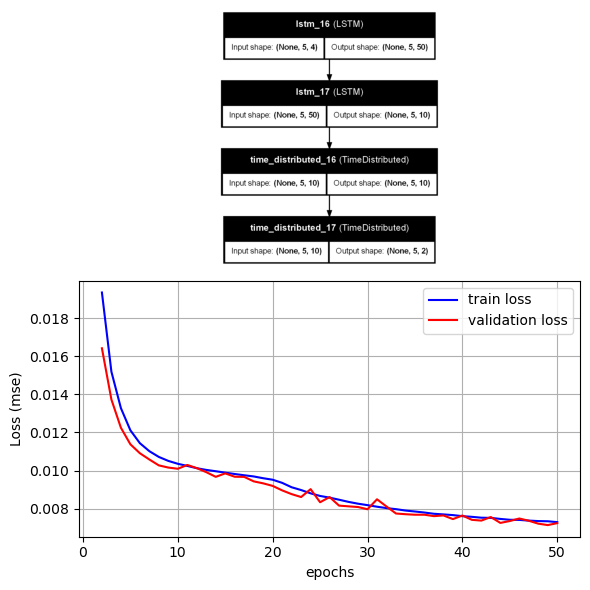

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

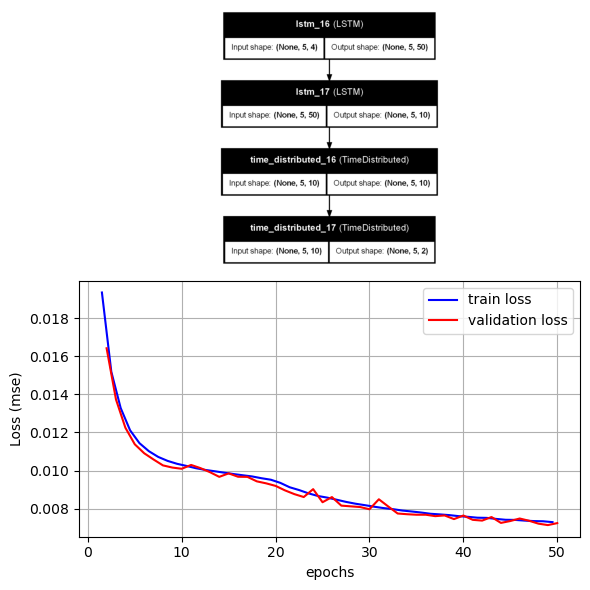

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.9378656 , 0.96762645],
        [0.9422499 , 0.96989655],
        [0.52478564, 0.8381927 ],
        [0.43217337, 0.80920184],
        [0.4647938 , 0.81941307]]], dtype=float32)

In [ ]:
to_test[1][0]

array([[0.3450245 , 0.95042553],
       [0.38238196, 0.94574118],
       [0.40375094, 0.94453195],
       [0.39637098, 0.94480238],
       [0.41686267, 0.9451384 ]])

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
897/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2898
Epoch 1: val_loss improved from inf to 0.01675, saving model to weights-improvement-01-0.02.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 0.2895 - val_loss: 0.0167
Epoch 2/50
892/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0230
Epoch 2: val_loss improved from 0.01675 to 0.01286, saving model to weights-improvement-02-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0230 - val_loss: 0.0129
Epoch 3/50
894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0169
Epoch 3: val_loss improved from 0.01286 to 0.01127, saving model to weights-improvement-03-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0169 - val_loss: 0.0113
Epoch 4/50
886/898 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0138
Epoch 4: val_loss improved from 0.01127 to 0.01007, saving model to weights-improvement-04-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0138 - val_loss: 0.0101
Epoch 5/50
898/898 ━━━━━━━━━

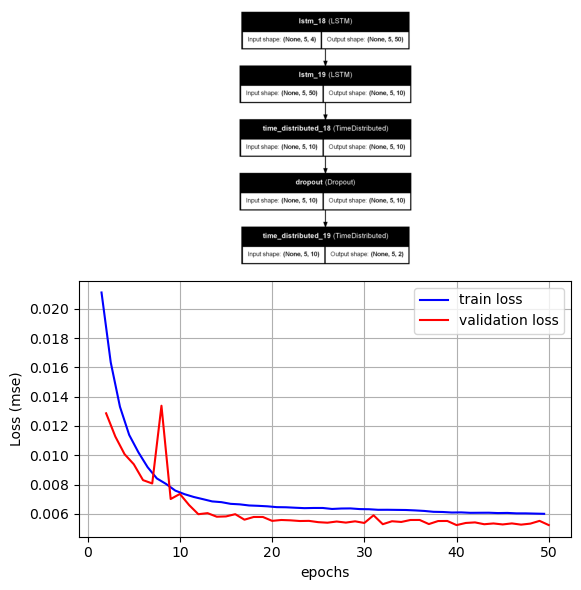

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 5
n_out = 5
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
882/898 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2833
Epoch 1: val_loss improved from inf to 0.01484, saving model to weights-improvement-01-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 0.2799 - val_loss: 0.0148
Epoch 2/50
897/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0134
Epoch 2: val_loss improved from 0.01484 to 0.01139, saving model to weights-improvement-02-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0134 - val_loss: 0.0114
Epoch 3/50
894/898 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0105
Epoch 3: val_loss improved from 0.01139 to 0.00971, saving model to weights-improvement-03-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0105 - val_loss: 0.0097
Epoch 4/50
898/898 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0093
Epoch 4: val_loss improved from 0.00971 to 0.00960, saving model to weights-improvement-04-0.01.keras
898/898 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0093 - val_loss: 0.0096
Epoch 5/50
894/898 ━━━━━━━━━

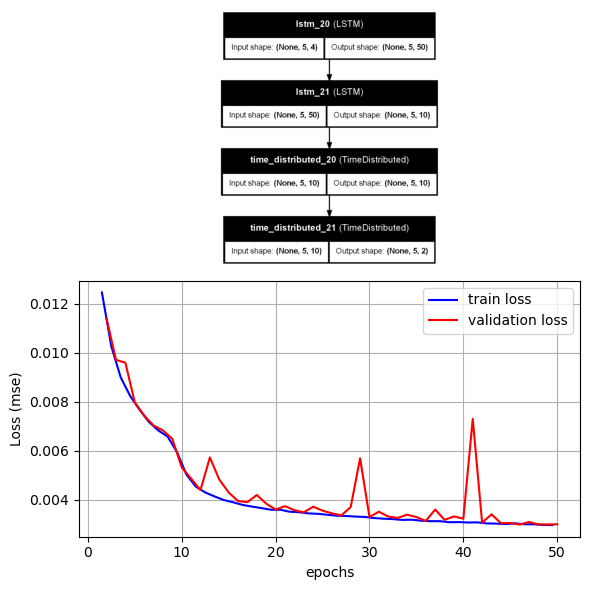

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

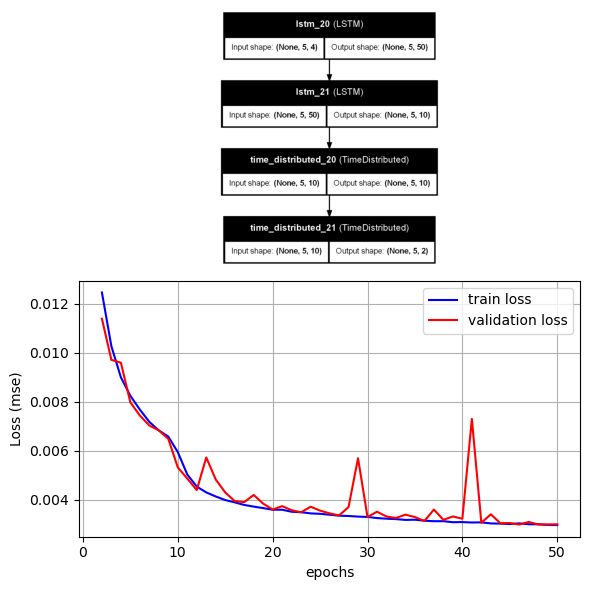

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

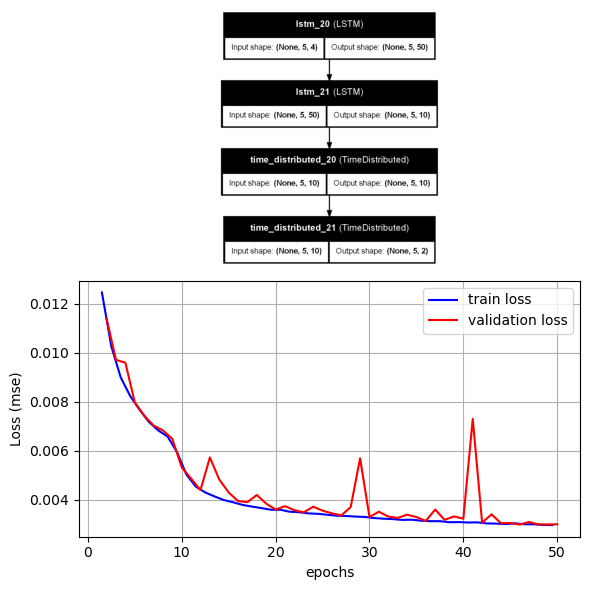

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch-0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-57-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-57-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
841/845 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2570
Epoch 1: val_loss improved from inf to 0.01537, saving model to weights-improvement-01-0.02.keras
845/845 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - loss: 0.2560 - val_loss: 0.0154
Epoch 2/50
839/845 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0144
Epoch 2: val_loss improved from 0.01537 to 0.01161, saving model to weights-improvement-02-0.01.keras
845/845 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - loss: 0.0144 - val_loss: 0.0116
Epoch 3/50
845/845 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0118
Epoch 3: val_loss improved from 0.01161 to 0.01046, saving model to weights-improvement-03-0.01.keras
845/845 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - loss: 0.0118 - val_loss: 0.0105
Epoch 4/50
844/845 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0111
Epoch 4: val_loss improved from 0.01046 to 0.00981, saving model to weights-improvement-04-0.01.keras
845/845 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0111 - val_loss: 0.0098
Epoch 5/50
844/845 ━

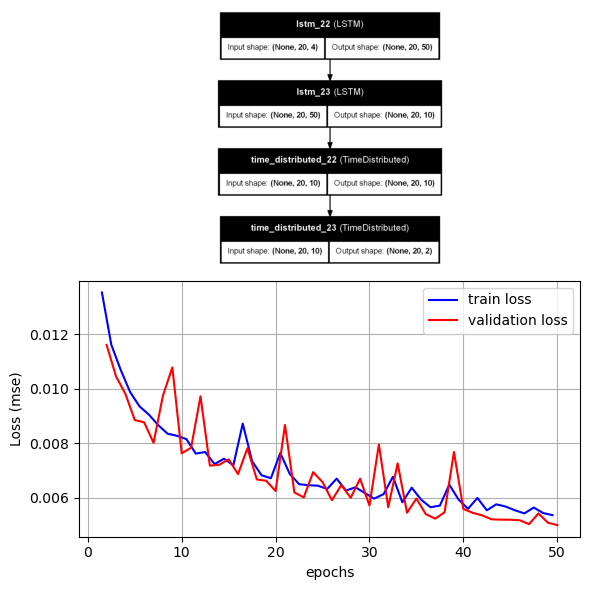

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch-0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

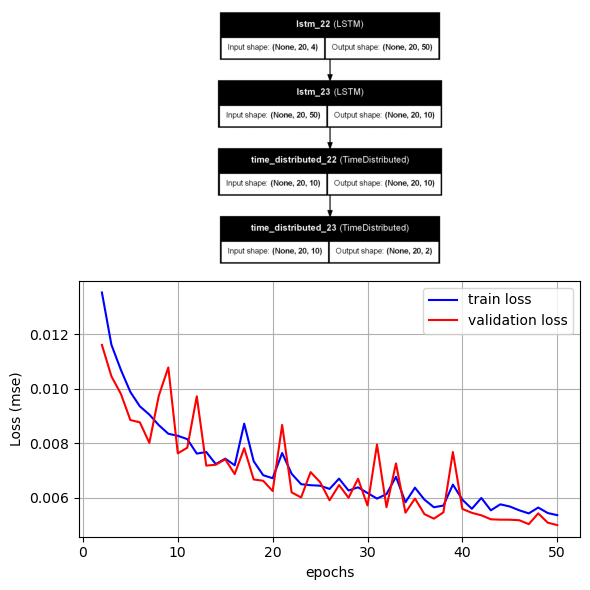

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

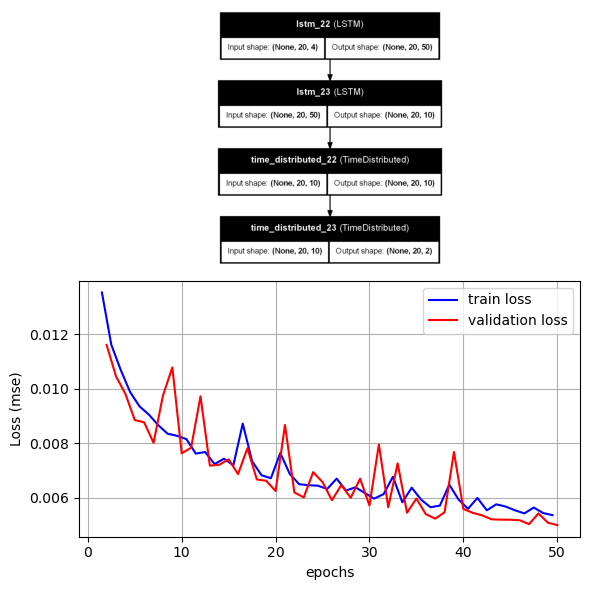

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.2, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-136-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-136-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(train)

41024

In [ ]:
len(test)

7298

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-136-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-136-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-136-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1151/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2335
Epoch 1: val_loss improved from inf to 0.01211, saving model to weights-improvement-01-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 14s 9ms/step - loss: 0.2330 - val_loss: 0.0121
Epoch 2/50
1151/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0112
Epoch 2: val_loss improved from 0.01211 to 0.00983, saving model to weights-improvement-02-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0112 - val_loss: 0.0098
Epoch 3/50
1149/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0096
Epoch 3: val_loss improved from 0.00983 to 0.00935, saving model to weights-improvement-03-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0096 - val_loss: 0.0093
Epoch 4/50
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0088
Epoch 4: val_loss improved from 0.00935 to 0.00816, saving model to weights-improvement-04-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - loss: 0.0088 - val_loss: 0.0082
Epoch 5/50
1146/115

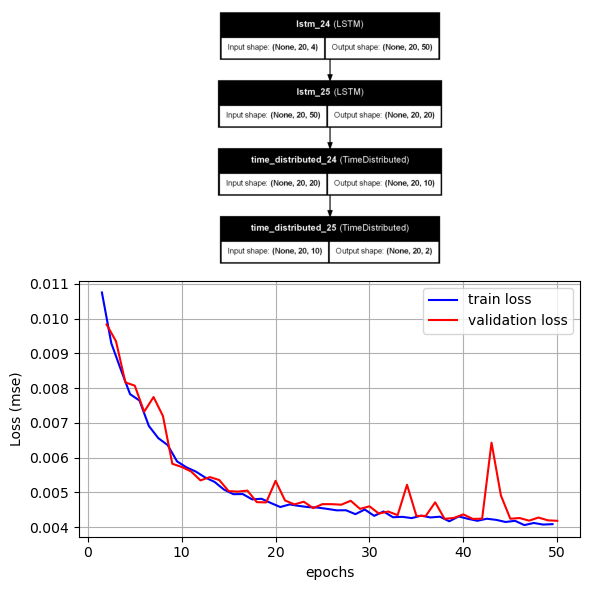

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.41193098, 0.7315718 ],
        [0.33720887, 0.88792634],
        [0.35165247, 0.9032331 ],
        [0.37104264, 0.9215187 ],
        [0.41175506, 0.9230125 ],
        [0.40286386, 0.9251454 ],
        [0.40056488, 0.9250496 ],
        [0.4073601 , 0.92494655],
        [0.4206714 , 0.9256235 ],
        [0.42047605, 0.9281465 ],
        [0.41732752, 0.9283638 ],
        [0.4224979 , 0.9282662 ],
        [0.43490657, 0.92759776],
        [0.4409839 , 0.92780703],
        [0.44036913, 0.92783797],
        [0.43979743, 0.9270717 ],
        [0.43503985, 0.9259573 ],
        [0.43587586, 0.9252091 ],
        [0.43774116, 0.9241211 ],
        [0.4456289 , 0.9234718 ]]], dtype=float32)

In [ ]:
to_test[1][0]

array([[0.49088281, 0.93886707],
       [0.39947767, 0.93981418],
       [0.47363298, 0.93815281],
       [0.44337685, 0.93889978],
       [0.4483505 , 0.93811847],
       [0.45367692, 0.93764819],
       [0.47300614, 0.93724011],
       [0.4413782 , 0.93719873],
       [0.43057125, 0.93623762],
       [0.51320629, 0.93534896],
       [0.46358914, 0.9364368 ],
       [0.44048166, 0.93553688],
       [0.46305567, 0.93454767],
       [0.48229819, 0.93429217],
       [0.48298901, 0.93422593],
       [0.43810716, 0.93395735],
       [0.5061688 , 0.93264736],
       [0.41054906, 0.93331543],
       [0.45124771, 0.93113394],
       [0.45285461, 0.93085959]])

In [ ]:
test[0]

array([[8.80000000e+01, 6.22500000e+02, 2.58045525e-01, 1.67097177e-06,
        9.95159642e-01, 9.99937322e-01, 9.99999531e-01],
       [8.80000000e+01, 6.23000000e+02, 3.47685603e-01, 1.75754892e-06,
        9.95159863e-01, 9.99983751e-01, 9.68869743e-01],
       [8.80000000e+01, 6.23500000e+02, 3.55491661e-01, 3.15346675e-04,
        9.95898252e-01, 9.99421080e-01, 9.56380991e-01],
       [8.80000000e+01, 6.24000000e+02, 3.79300237e-01, 7.84985289e-04,
        9.96648749e-01, 9.98851335e-01, 9.48128110e-01],
       [8.80000000e+01, 6.24500000e+02, 4.24066784e-01, 1.37764733e-03,
        9.97305146e-01, 9.98290635e-01, 9.44027806e-01],
       [8.80000000e+01, 6.25000000e+02, 3.19571249e-01, 2.04485149e-03,
        9.97825281e-01, 9.97752821e-01, 9.43287954e-01],
       [8.80000000e+01, 6.25500000e+02, 3.87743078e-01, 2.73486551e-03,
        9.98162070e-01, 9.97264847e-01, 9.41156970e-01],
       [8.80000000e+01, 6.26000000e+02, 4.02710976e-01, 3.47184026e-03,
        9.98455827e-01, 9

In [ ]:
len(test)

7298

In [ ]:
test.shape

(7298, 20, 7)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 100, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-136-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-136-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-136-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/100


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1153/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.2205
Epoch 1: val_loss improved from inf to 0.01359, saving model to weights-improvement-01-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 22s 15ms/step - loss: 0.2203 - val_loss: 0.0136
Epoch 2/100
1153/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0129
Epoch 2: val_loss improved from 0.01359 to 0.00900, saving model to weights-improvement-02-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 13s 11ms/step - loss: 0.0129 - val_loss: 0.0090
Epoch 3/100
1151/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0087
Epoch 3: val_loss improved from 0.00900 to 0.00761, saving model to weights-improvement-03-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 31s 19ms/step - loss: 0.0087 - val_loss: 0.0076
Epoch 4/100
1152/1154 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0075
Epoch 4: val_loss improved from 0.00761 to 0.00753, saving model to weights-improvement-04-0.01.keras
1154/1154 ━━━━━━━━━━━━━━━━━━━━ 41s 19ms/step - loss: 0.0075 - val_loss: 0.0075
Epoch 5/

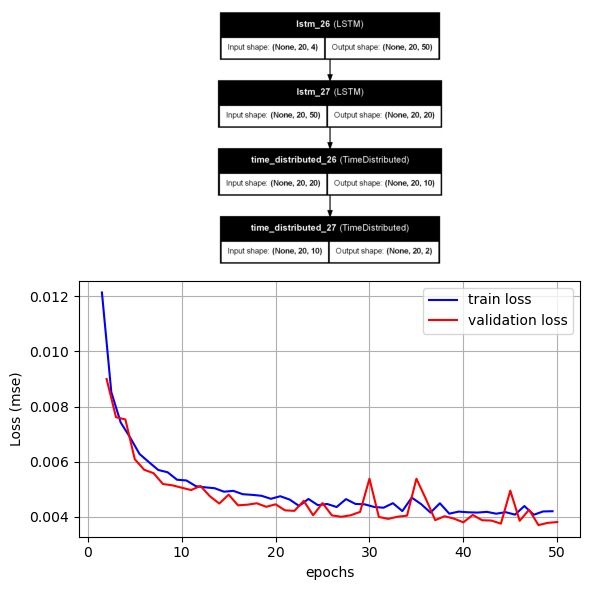

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

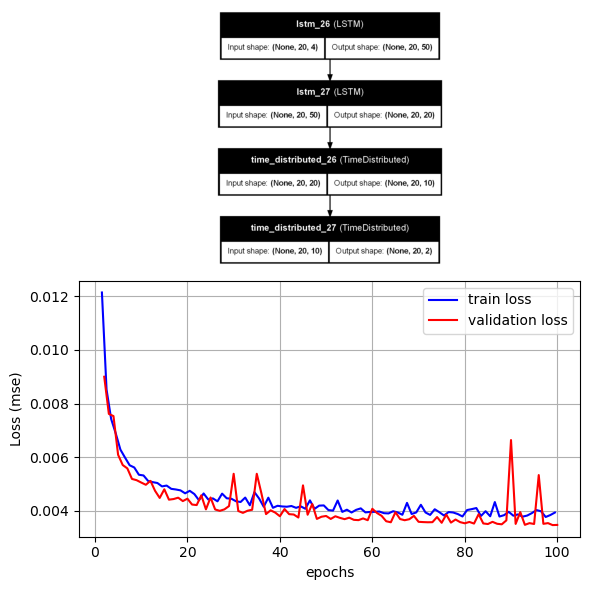

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 101)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:100], backup.history['loss'][1:100], label='train loss', color='b')
ax2.plot(epochs[1:100], backup.history['val_loss'][1:100], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

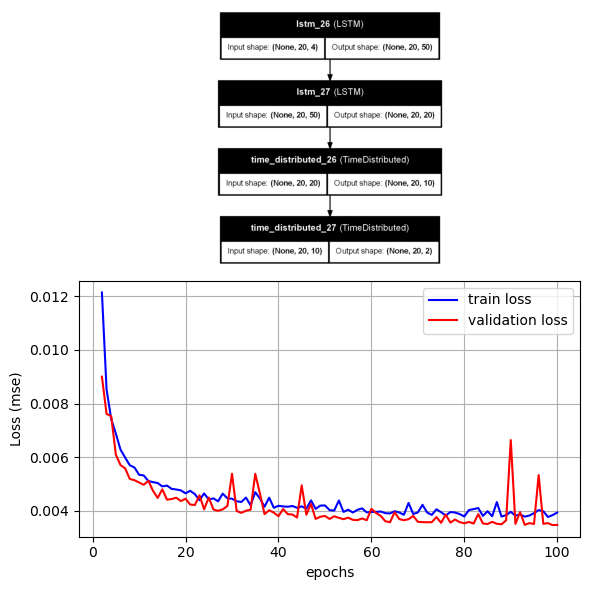

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 101)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:100], backup.history['loss'][1:100], label='train loss', color='b')
ax2.plot(epochs[1:100], backup.history['val_loss'][1:100], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 20] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 20]

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 20] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 20]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

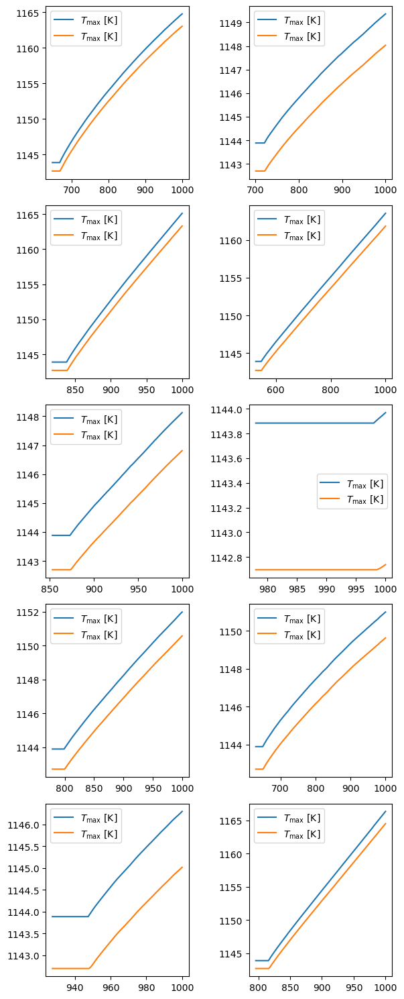

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[id_list]
        xl_rom = df_list_rom[id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 100, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(train)

86486

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/100


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2433/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4763
Epoch 1: val_loss improved from inf to 0.37982, saving model to weights-improvement-01-0.38.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 28s 10ms/step - loss: 0.4763 - val_loss: 0.3798
Epoch 2/100
2429/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3824
Epoch 2: val_loss improved from 0.37982 to 0.37885, saving model to weights-improvement-02-0.38.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - loss: 0.3824 - val_loss: 0.3788
Epoch 3/100
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3814
Epoch 3: val_loss improved from 0.37885 to 0.37763, saving model to weights-improvement-03-0.38.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - loss: 0.3814 - val_loss: 0.3776
Epoch 4/100
2430/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3810
Epoch 4: val_loss improved from 0.37763 to 0.37740, saving model to weights-improvement-04-0.38.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - loss: 0.3810 - val_loss: 0.3774
Epoch 5/10

KeyboardInterrupt: 

In [ ]:
len(df_list_rom)

200

IndexError: index 190 is out of bounds for axis 0 with size 5

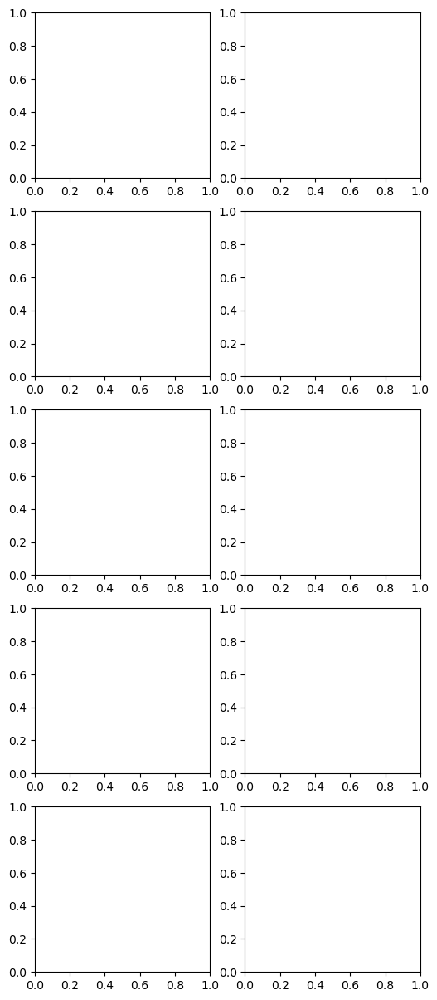

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(190,195):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[id_list]
        xl_rom = df_list_rom[id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

IndexError: index 190 is out of bounds for axis 0 with size 5

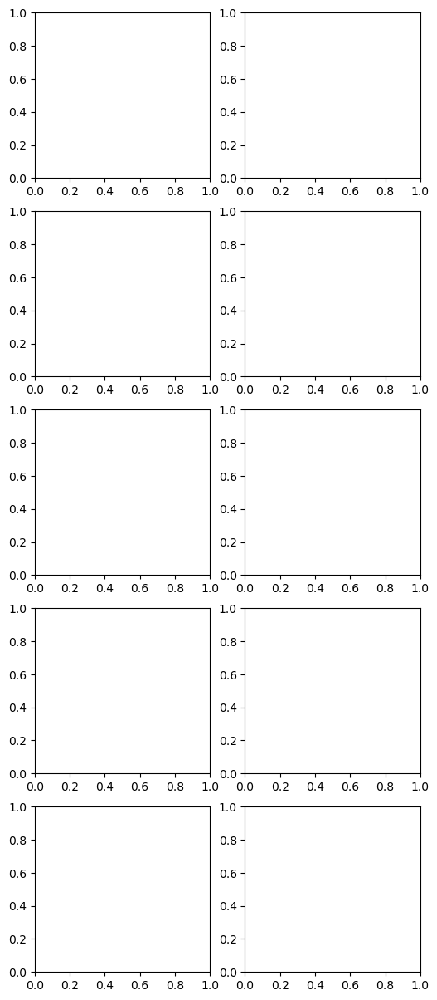

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(190,196):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[id_list]
        xl_rom = df_list_rom[id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
df_list_hrm[200]

IndexError: list index out of range

In [ ]:
len(df_list_hrm)

200

In [ ]:
df_list_hrm[199]

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp,delta_Tp
1778,889.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985907e+06,6.896099e+06,6.746418e+06,6.476994e+06,1.516842e+07,983.070935,0.000000,9.978679e+07,1142.695931,-1.188784
1779,889.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985907e+06,6.896099e+06,6.746418e+06,6.476994e+06,1.516842e+07,983.070935,0.000000,9.978679e+07,1142.695931,-1.188784
1780,890.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985907e+06,6.896099e+06,6.746418e+06,6.476994e+06,1.516842e+07,983.070935,0.000000,9.978679e+07,1142.695931,-1.188784
1781,890.5,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985907e+06,6.896099e+06,6.746418e+06,6.476994e+06,1.516842e+07,983.070935,0.000000,9.978679e+07,1142.695931,-1.188784
1782,891.0,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,5550.500000,...,6.985907e+06,6.896099e+06,6.746418e+06,6.476994e+06,1.516842e+07,983.070935,0.000000,9.978679e+07,1142.695931,-1.188784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,998.0,5003.605185,5003.605185,5003.605185,5003.605185,5003.605185,5003.605185,5003.605185,5003.605185,5003.605185,...,6.660669e+06,6.575042e+06,6.432331e+06,6.175450e+06,1.446224e+07,983.060936,-8.384133,9.514109e+07,1150.368590,-1.444566
1997,998.5,5000.748385,5000.748385,5000.748385,5000.748385,5000.748385,5000.748385,5000.748385,5000.748385,5000.748385,...,6.658973e+06,6.573368e+06,6.430693e+06,6.173877e+06,1.445856e+07,983.060884,-8.756844,9.511687e+07,1150.408182,-1.447124
1998,999.0,4997.764588,4997.764588,4997.764588,4997.764588,4997.764588,4997.764588,4997.764588,4997.764588,4997.764588,...,6.657225e+06,6.571642e+06,6.429004e+06,6.172256e+06,1.445476e+07,983.060828,-8.128751,9.509189e+07,1150.449337,-1.449712
1999,999.5,4994.994806,4994.994806,4994.994806,4994.994806,4994.994806,4994.994806,4994.994806,4994.994806,4994.994806,...,6.655407e+06,6.569848e+06,6.427249e+06,6.170571e+06,1.445081e+07,983.060769,-8.090460,9.506593e+07,1150.491999,-1.450009


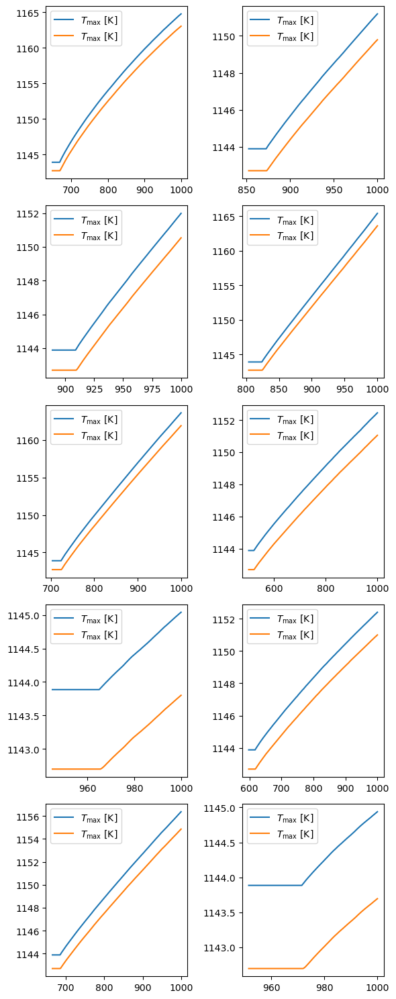

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 100, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/100


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4863/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0795
Epoch 1: val_loss improved from inf to 0.00708, saving model to weights-improvement-01-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0795 - val_loss: 0.0071
Epoch 2/100
4863/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0072
Epoch 2: val_loss improved from 0.00708 to 0.00559, saving model to weights-improvement-02-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 44s 9ms/step - loss: 0.0072 - val_loss: 0.0056
Epoch 3/100
4860/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0056
Epoch 3: val_loss improved from 0.00559 to 0.00482, saving model to weights-improvement-03-0.00.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 40s 8ms/step - loss: 0.0056 - val_loss: 0.0048
Epoch 4/100
4863/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0051
Epoch 4: val_loss improved from 0.00482 to 0.00430, saving model to weights-improvement-04-0.00.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - loss: 0.0051 - val_loss: 0.0043
Epoch 5/100
4859

KeyboardInterrupt: 

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 20
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
3888/3892 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1420
Epoch 1: val_loss improved from inf to 0.01327, saving model to weights-improvement-01-0.01.keras
3892/3892 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - loss: 0.1419 - val_loss: 0.0133
Epoch 2/50
3891/3892 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0121
Epoch 2: val_loss improved from 0.01327 to 0.01179, saving model to weights-improvement-02-0.01.keras
3892/3892 ━━━━━━━━━━━━━━━━━━━━ 36s 9ms/step - loss: 0.0121 - val_loss: 0.0118
Epoch 3/50
3889/3892 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0102
Epoch 3: val_loss improved from 0.01179 to 0.01026, saving model to weights-improvement-03-0.01.keras
3892/3892 ━━━━━━━━━━━━━━━━━━━━ 37s 10ms/step - loss: 0.0102 - val_loss: 0.0103
Epoch 4/50
3892/3892 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0091
Epoch 4: val_loss improved from 0.01026 to 0.00935, saving model to weights-improvement-04-0.01.keras
3892/3892 ━━━━━━━━━━━━━━━━━━━━ 38s 10ms/step - loss: 0.0091 - val_loss: 0.0094
Epoch 

ValueError: x and y must have same first dimension, but have shapes (99,) and (49,)

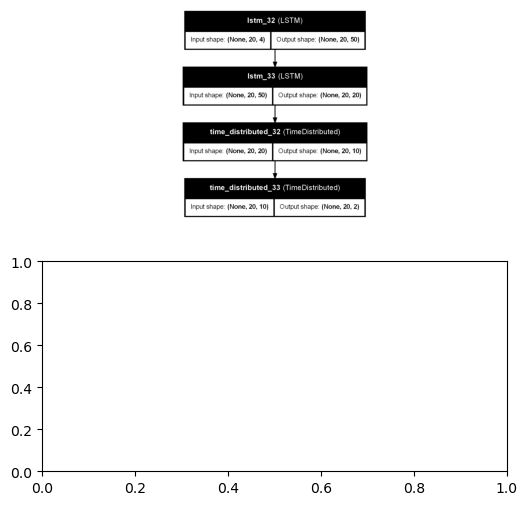

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 101)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:100], backup.history['loss'][1:100], label='train loss', color='b')
ax2.plot(epochs[1:100], backup.history['val_loss'][1:100], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

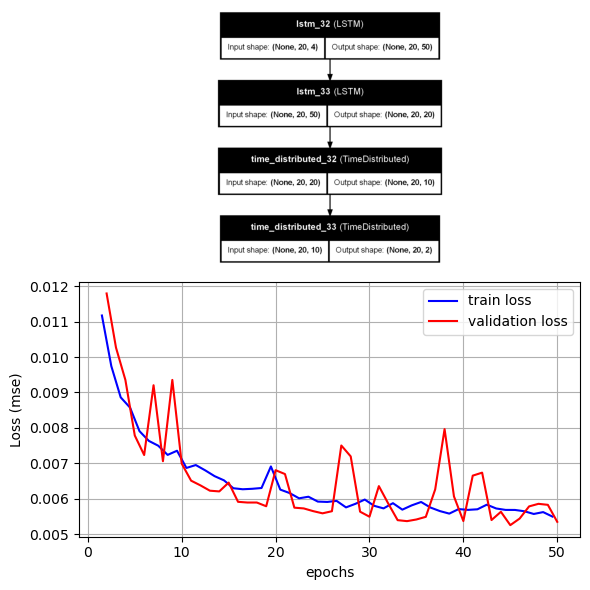

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

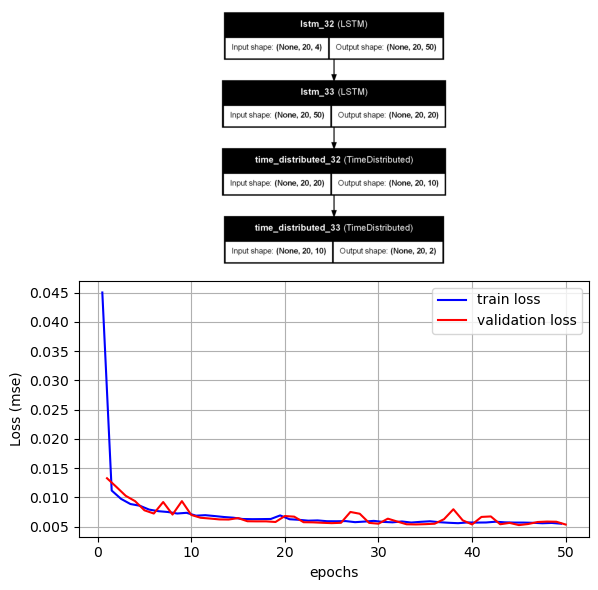

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:50], backup.history['loss'][:50], label='train loss', color='b')
ax2.plot(epochs[:50], backup.history['val_loss'][:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

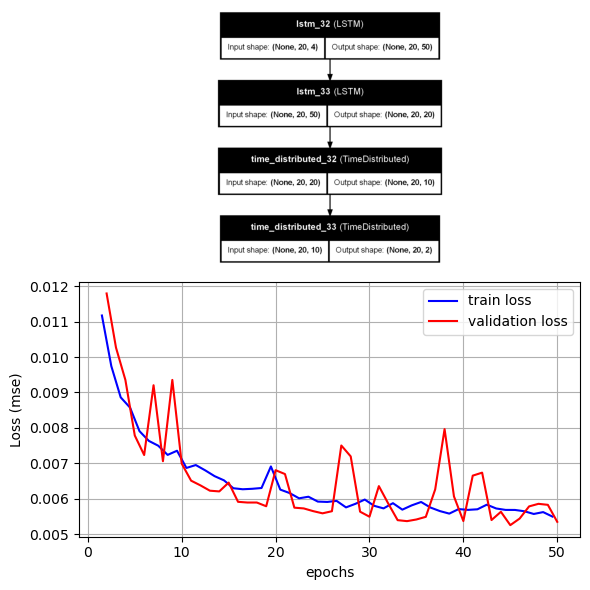

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.005))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
2429/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1040
Epoch 1: val_loss improved from inf to 0.00928, saving model to weights-improvement-01-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 29s 10ms/step - loss: 0.1039 - val_loss: 0.0093
Epoch 2/50
2428/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0092
Epoch 2: val_loss improved from 0.00928 to 0.00794, saving model to weights-improvement-02-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - loss: 0.0092 - val_loss: 0.0079
Epoch 3/50
2431/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0080
Epoch 3: val_loss improved from 0.00794 to 0.00714, saving model to weights-improvement-03-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - loss: 0.0080 - val_loss: 0.0071
Epoch 4/50
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0076
Epoch 4: val_loss improved from 0.00714 to 0.00684, saving model to weights-improvement-04-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - loss: 0.0076 - val_loss: 0.0068
Epo

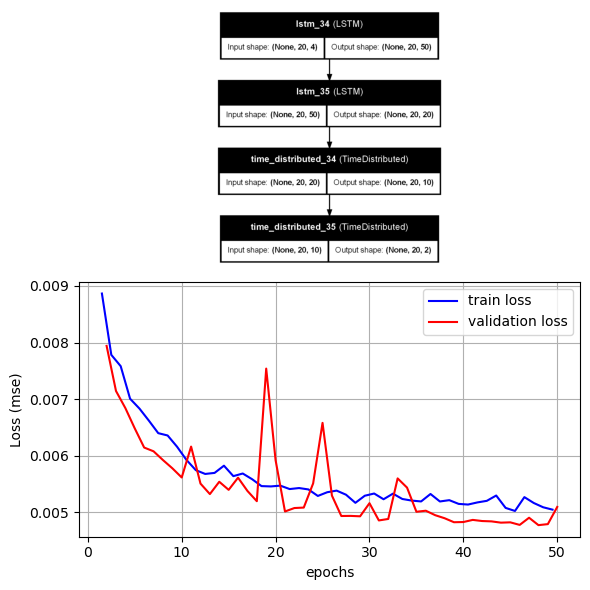

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.005)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.005))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0767
Epoch 1: val_loss improved from inf to 0.00814, saving model to weights-improvement-01-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 51s 9ms/step - loss: 0.0767 - val_loss: 0.0081
Epoch 2/50
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0084
Epoch 2: val_loss improved from 0.00814 to 0.00772, saving model to weights-improvement-02-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 37s 8ms/step - loss: 0.0084 - val_loss: 0.0077
Epoch 3/50
4862/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0074
Epoch 3: val_loss improved from 0.00772 to 0.00639, saving model to weights-improvement-03-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 48s 10ms/step - loss: 0.0074 - val_loss: 0.0064
Epoch 4/50
4864/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068
Epoch 4: val_loss did not improve from 0.00639
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 47s 10ms/step - loss: 0.0068 - val_loss: 0.0066
Epoch 5/50
4863/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss:

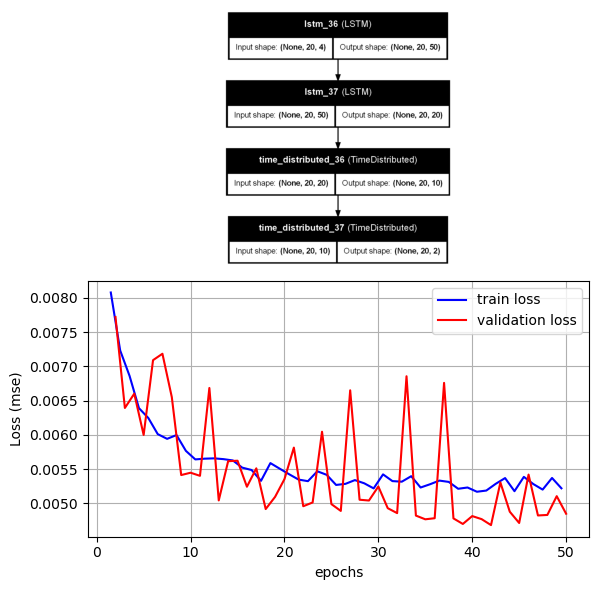

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
2429/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1208
Epoch 1: val_loss improved from inf to 0.01141, saving model to weights-improvement-01-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 32s 12ms/step - loss: 0.1206 - val_loss: 0.0114
Epoch 2/50
2431/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0091
Epoch 2: val_loss improved from 0.01141 to 0.00715, saving model to weights-improvement-02-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 25s 10ms/step - loss: 0.0091 - val_loss: 0.0071
Epoch 3/50
2429/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0078
Epoch 3: val_loss improved from 0.00715 to 0.00643, saving model to weights-improvement-03-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - loss: 0.0078 - val_loss: 0.0064
Epoch 4/50
2432/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0073
Epoch 4: val_loss did not improve from 0.00643
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - loss: 0.0073 - val_loss: 0.0086
Epoch 5/50
2431/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step 

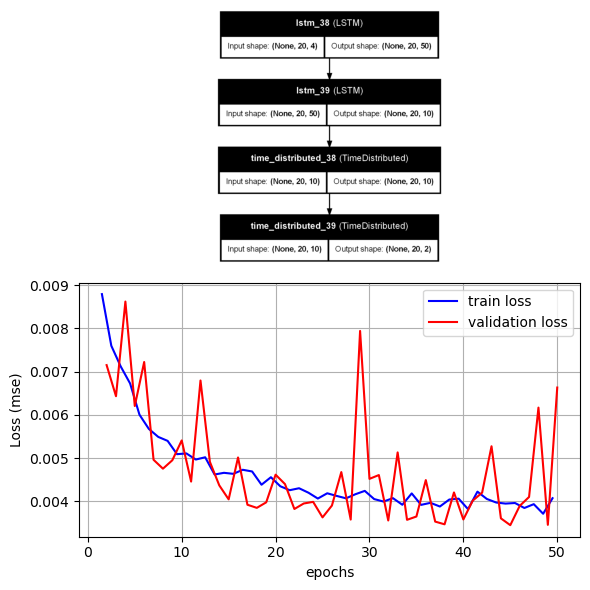

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.02)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.02)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 20
n_out = 20
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
2428/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3118
Epoch 1: val_loss improved from inf to 0.01202, saving model to weights-improvement-01-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 29s 10ms/step - loss: 0.3112 - val_loss: 0.0120
Epoch 2/50
2431/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0110
Epoch 2: val_loss improved from 0.01202 to 0.00879, saving model to weights-improvement-02-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 27s 11ms/step - loss: 0.0110 - val_loss: 0.0088
Epoch 3/50
2426/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0095
Epoch 3: val_loss improved from 0.00879 to 0.00821, saving model to weights-improvement-03-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - loss: 0.0095 - val_loss: 0.0082
Epoch 4/50
2427/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0085
Epoch 4: val_loss improved from 0.00821 to 0.00763, saving model to weights-improvement-04-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - loss: 0.0085 - val_loss: 0.0076


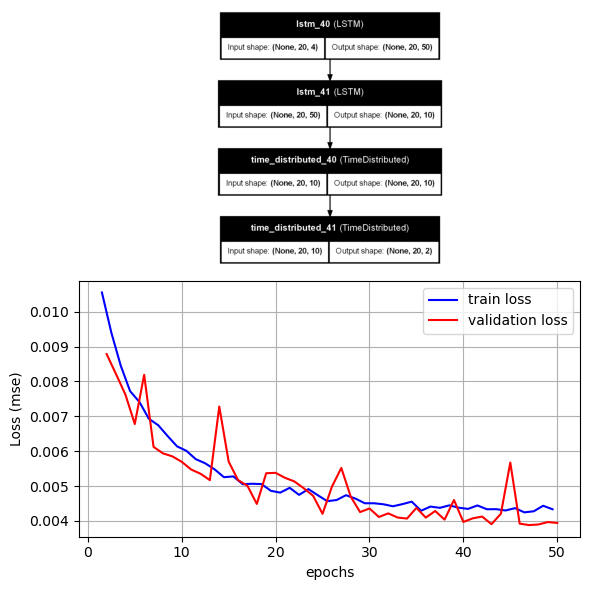

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

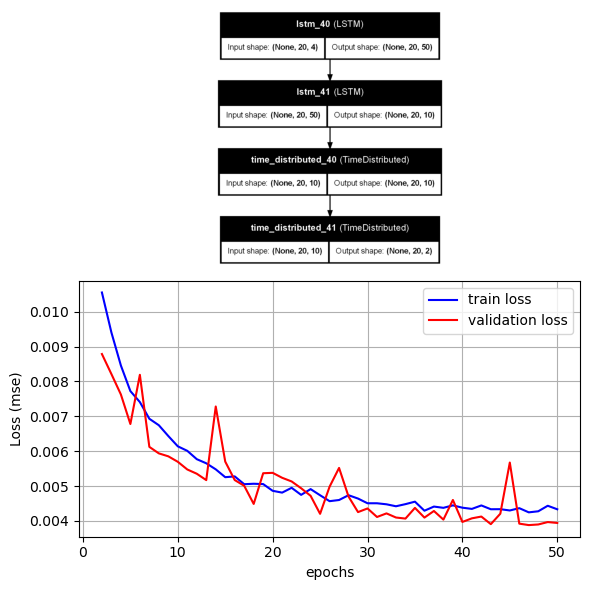

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

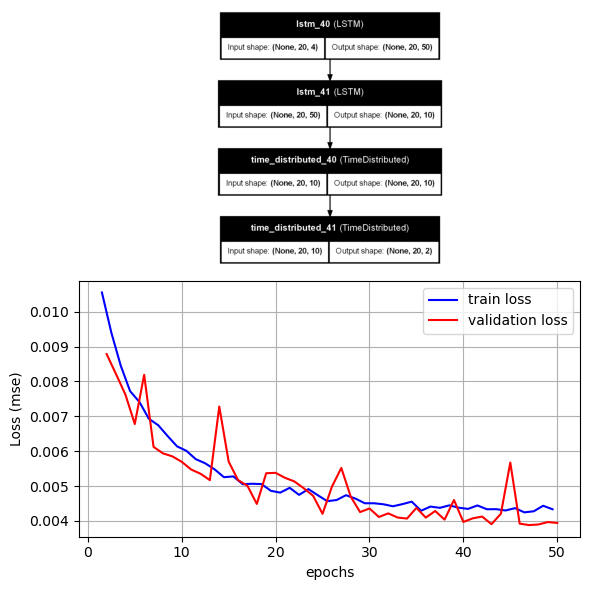

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch -0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
2430/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1272
Epoch 1: val_loss improved from inf to 0.01086, saving model to weights-improvement-01-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 32s 12ms/step - loss: 0.1271 - val_loss: 0.0109
Epoch 2/50
2430/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0105
Epoch 2: val_loss improved from 0.01086 to 0.00818, saving model to weights-improvement-02-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 29s 12ms/step - loss: 0.0104 - val_loss: 0.0082
Epoch 3/50
2432/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0087
Epoch 3: val_loss improved from 0.00818 to 0.00806, saving model to weights-improvement-03-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - loss: 0.0087 - val_loss: 0.0081
Epoch 4/50
2431/2433 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0078
Epoch 4: val_loss improved from 0.00806 to 0.00659, saving model to weights-improvement-04-0.01.keras
2433/2433 ━━━━━━━━━━━━━━━━━━━━ 27s 11ms/step - loss: 0.0078 - val_loss: 0.0066


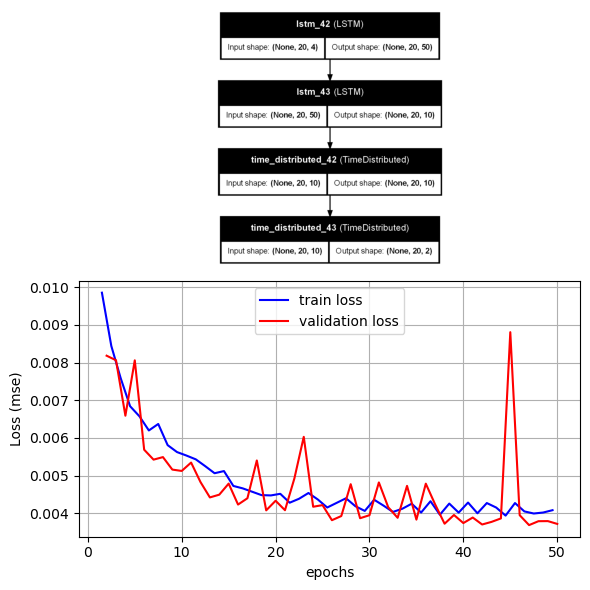

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

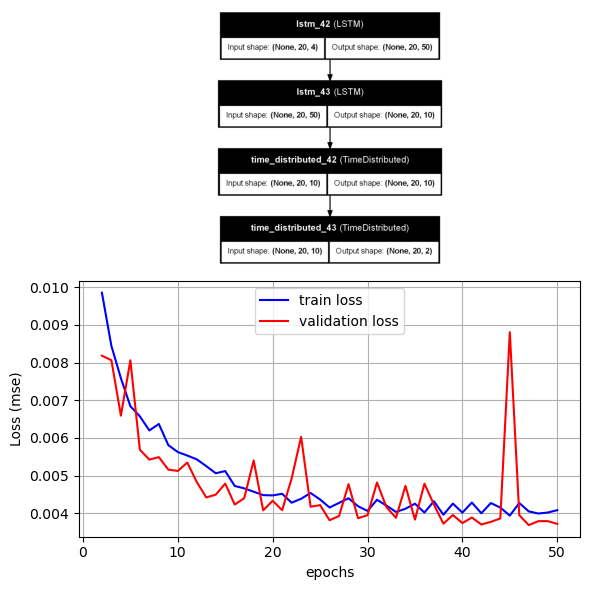

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

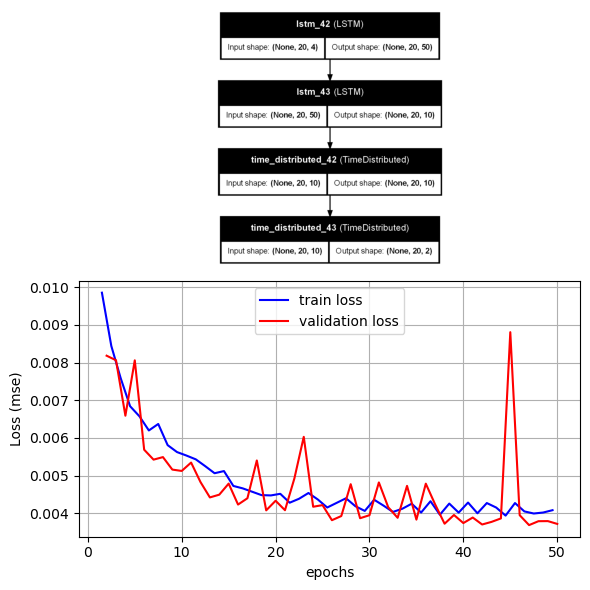

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
4862/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0760
Epoch 1: val_loss improved from inf to 0.01002, saving model to weights-improvement-01-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 53s 10ms/step - loss: 0.0759 - val_loss: 0.0100
Epoch 2/50
4862/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0084
Epoch 2: val_loss improved from 0.01002 to 0.00656, saving model to weights-improvement-02-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 47s 10ms/step - loss: 0.0084 - val_loss: 0.0066
Epoch 3/50
4860/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0070
Epoch 3: val_loss did not improve from 0.00656
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 43s 9ms/step - loss: 0.0070 - val_loss: 0.0080
Epoch 4/50
4862/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0063
Epoch 4: val_loss improved from 0.00656 to 0.00521, saving model to weights-improvement-04-0.01.keras
4865/4865 ━━━━━━━━━━━━━━━━━━━━ 43s 9ms/step - loss: 0.0063 - val_loss: 0.0052
Epoch 5/50
4861/4865 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss:

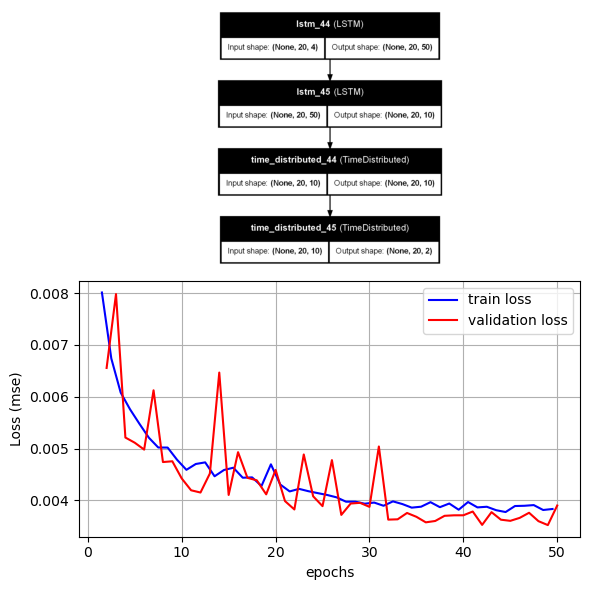

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 15
n_out = 15
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
4955/4962 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0829
Epoch 1: val_loss improved from inf to 0.01129, saving model to weights-improvement-01-0.01.keras
4962/4962 ━━━━━━━━━━━━━━━━━━━━ 33s 6ms/step - loss: 0.0828 - val_loss: 0.0113
Epoch 2/50
4961/4962 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0085
Epoch 2: val_loss improved from 0.01129 to 0.00605, saving model to weights-improvement-02-0.01.keras
4962/4962 ━━━━━━━━━━━━━━━━━━━━ 28s 6ms/step - loss: 0.0085 - val_loss: 0.0060
Epoch 3/50
4957/4962 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0059
Epoch 3: val_loss improved from 0.00605 to 0.00549, saving model to weights-improvement-03-0.01.keras
4962/4962 ━━━━━━━━━━━━━━━━━━━━ 31s 6ms/step - loss: 0.0059 - val_loss: 0.0055
Epoch 4/50
4955/4962 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0052
Epoch 4: val_loss improved from 0.00549 to 0.00540, saving model to weights-improvement-04-0.01.keras
4962/4962 ━━━━━━━━━━━━━━━━━━━━ 31s 6ms/step - loss: 0.0052 - val_loss: 0.0054
Epoch 5/

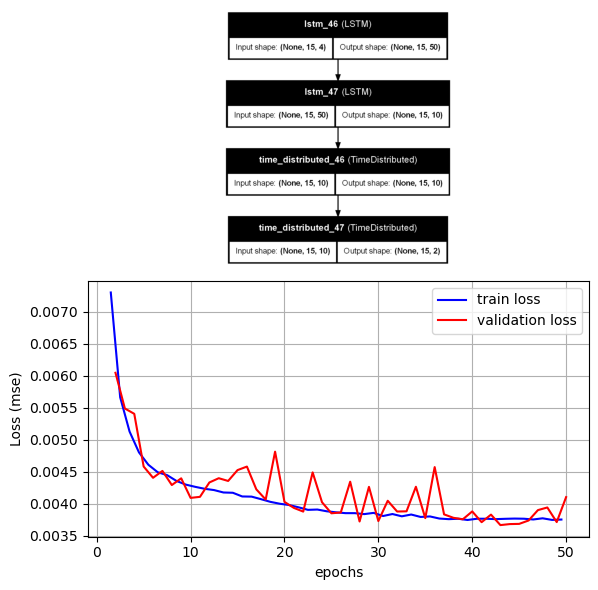

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.86580443, 0.9619162 ],
        [0.850761  , 1.0027483 ],
        [0.8144594 , 1.0092417 ],
        [0.80318284, 0.97659934],
        [0.7827776 , 0.9983012 ],
        [0.76844287, 0.98940426],
        [0.76962924, 0.9968464 ],
        [0.76658773, 0.98765266],
        [0.77173567, 0.9928617 ],
        [0.765113  , 0.9930824 ],
        [0.7598306 , 0.9963695 ],
        [0.7531953 , 0.99347514],
        [0.7501859 , 0.99475974],
        [0.7445068 , 0.99249965],
        [0.7418677 , 0.9917105 ]]], dtype=float32)

In [ ]:
to_test[1][0]

array([[1.        , 0.99999942],
       [1.        , 0.99999943],
       [1.        , 0.99999943],
       [1.        , 0.99999943],
       [1.        , 0.99999944],
       [1.        , 0.99999944],
       [1.        , 0.99999944],
       [1.        , 0.99999945],
       [1.        , 0.99999945],
       [1.        , 0.99999945],
       [1.        , 0.99999946],
       [1.        , 0.99999946],
       [1.        , 0.99999946],
       [1.        , 0.99999947],
       [1.        , 0.99999947]])

In [ ]:
to_test[1][1]

array([[0.8391549 , 0.98635291],
       [0.85103268, 0.98596923],
       [0.84318665, 0.98603243],
       [0.84612554, 0.98581835],
       [0.86966748, 0.98574418],
       [0.86339562, 0.98615505],
       [0.83708873, 0.98615289],
       [0.85574109, 0.98558014],
       [0.85049587, 0.98566391],
       [0.84235898, 0.98544462],
       [0.85231498, 0.98510512],
       [0.86617549, 0.98509902],
       [0.88847831, 0.98531727],
       [0.84628124, 0.98586726],
       [0.85003134, 0.98519471]])

In [ ]:
forecast(model,to_test[0][1], 4)

array([[[0.86580145, 0.9619192 ],
        [0.8447733 , 0.9957764 ],
        [0.82624483, 0.98782265],
        [0.8488477 , 0.98131263],
        [0.86636573, 0.9953784 ],
        [0.8661876 , 0.9835678 ],
        [0.8740185 , 0.981008  ],
        [0.8741471 , 0.9769842 ],
        [0.8719795 , 0.9816101 ],
        [0.87162805, 0.97868866],
        [0.8717019 , 0.9780876 ],
        [0.86877596, 0.9818325 ],
        [0.8691967 , 0.9804465 ],
        [0.86948884, 0.9810246 ],
        [0.8704362 , 0.97920376]]], dtype=float32)

In [ ]:
15*0.5

7.5

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 30
n_out = 30
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-170-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-170-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
4672/4675 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1270
Epoch 1: val_loss improved from inf to 0.02444, saving model to weights-improvement-01-0.02.keras
4675/4675 ━━━━━━━━━━━━━━━━━━━━ 46s 9ms/step - loss: 0.1269 - val_loss: 0.0244
Epoch 2/50
4670/4675 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0173
Epoch 2: val_loss improved from 0.02444 to 0.01035, saving model to weights-improvement-02-0.01.keras
4675/4675 ━━━━━━━━━━━━━━━━━━━━ 40s 9ms/step - loss: 0.0173 - val_loss: 0.0104
Epoch 3/50
4671/4675 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0090
Epoch 3: val_loss improved from 0.01035 to 0.00556, saving model to weights-improvement-03-0.01.keras
4675/4675 ━━━━━━━━━━━━━━━━━━━━ 40s 9ms/step - loss: 0.0090 - val_loss: 0.0056
Epoch 4/50
4675/4675 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0064
Epoch 4: val_loss improved from 0.00556 to 0.00528, saving model to weights-improvement-04-0.01.keras
4675/4675 ━━━━━━━━━━━━━━━━━━━━ 40s 9ms/step - loss: 0.0064 - val_loss: 0.0053
Epoch 5/

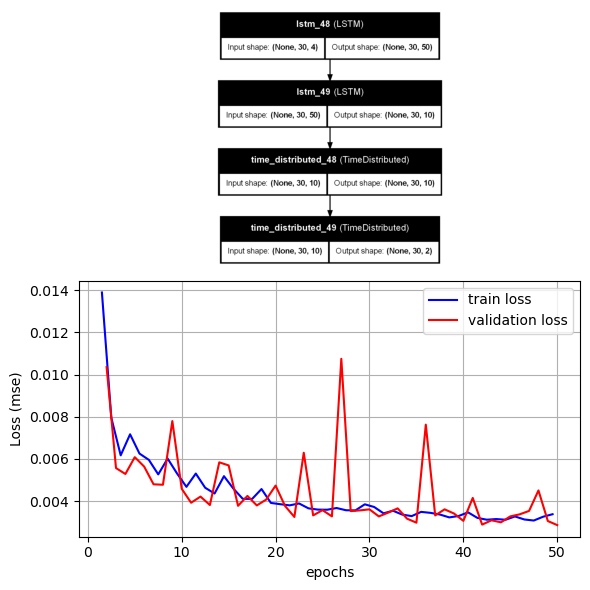

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

Connected to mcdet_lstm (Python 3.11.5)

In [ ]:
import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
# fault_time = 500

In [ ]:
available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 20] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 20]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

<ipython-input-5-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-5-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-5-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 30
n_out = 30
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=40000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-14-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-14-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(train)

83112

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 5] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 5]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

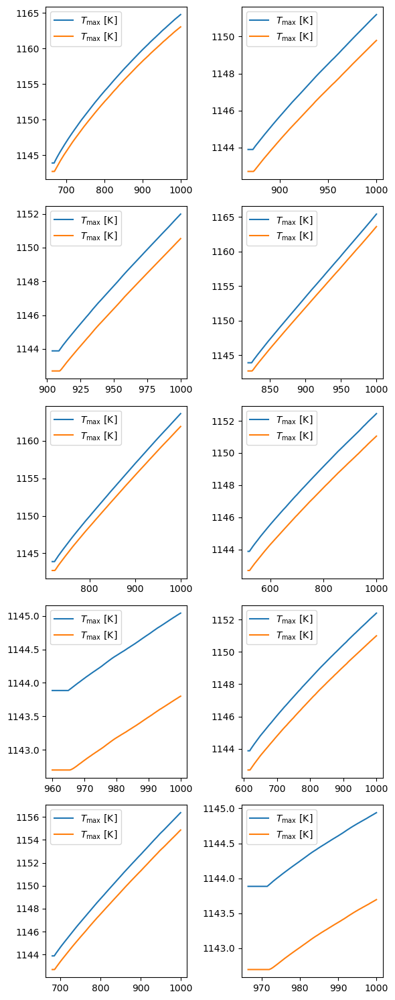

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(10, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 30
n_out = 30
#train, test = split_dataset(dataset, n_input, n_out)
train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-30-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-30-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


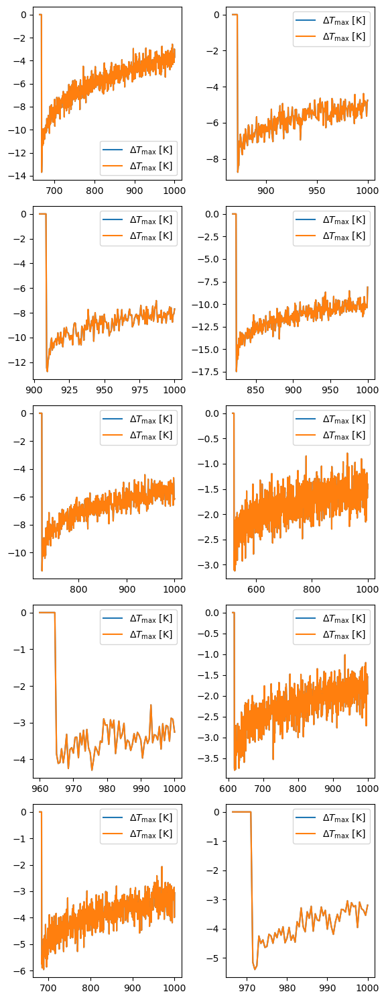

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

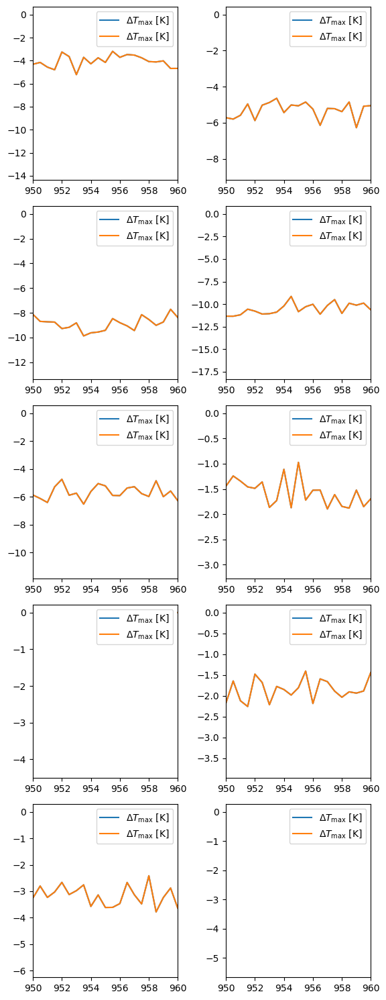

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([950, 960])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

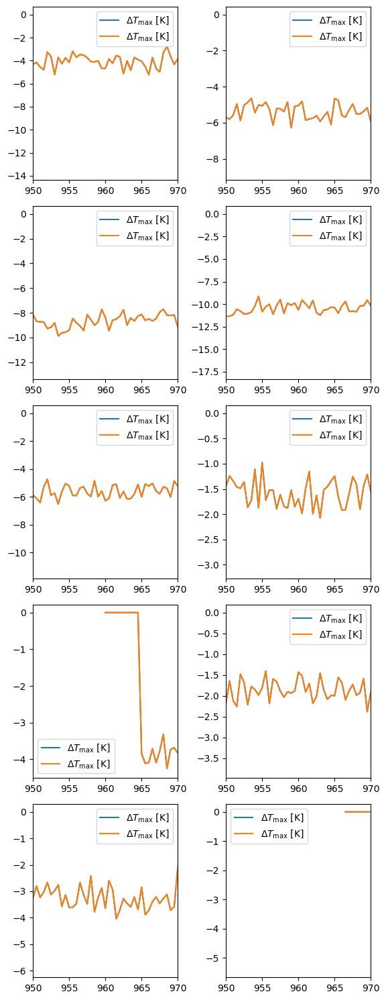

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([950, 970])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

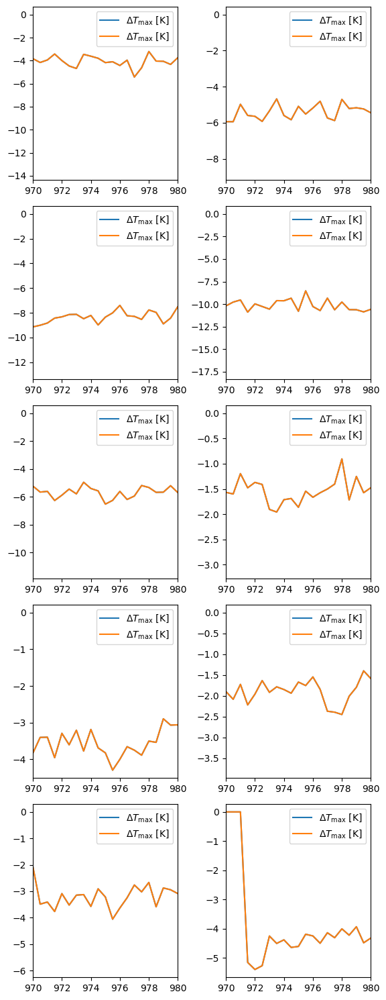

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([970, 980])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

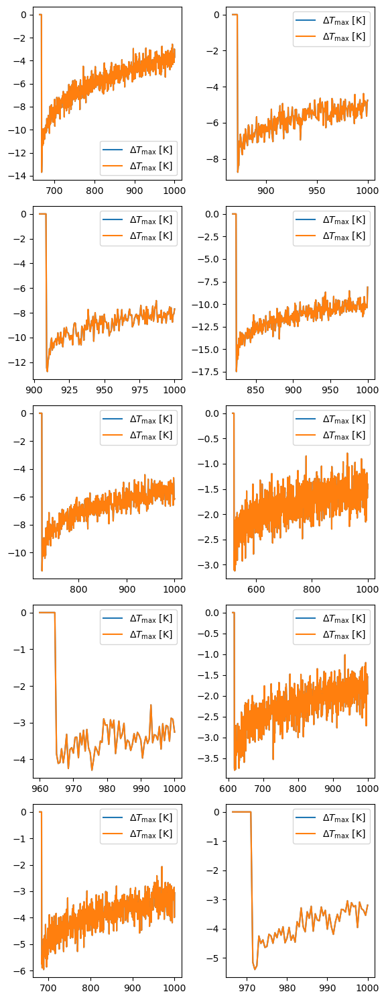

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        #axs[i, j].set_xlim([970, 980])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

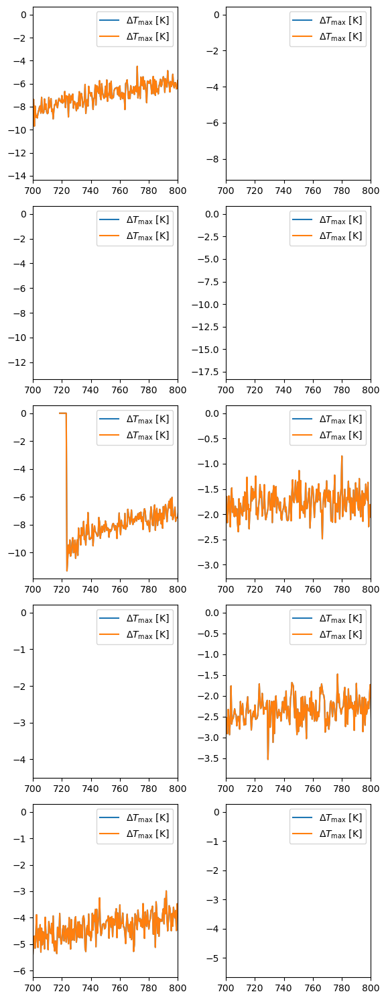

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([700,800])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

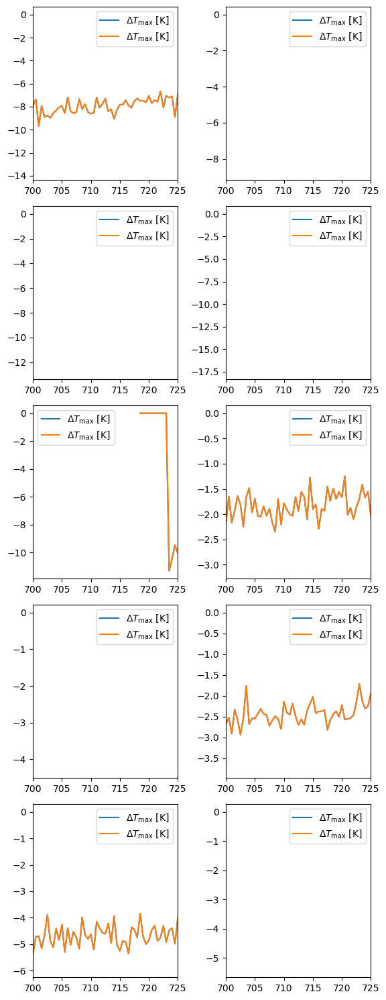

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_rom['t[s]'], xl_rom['Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([700,725])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

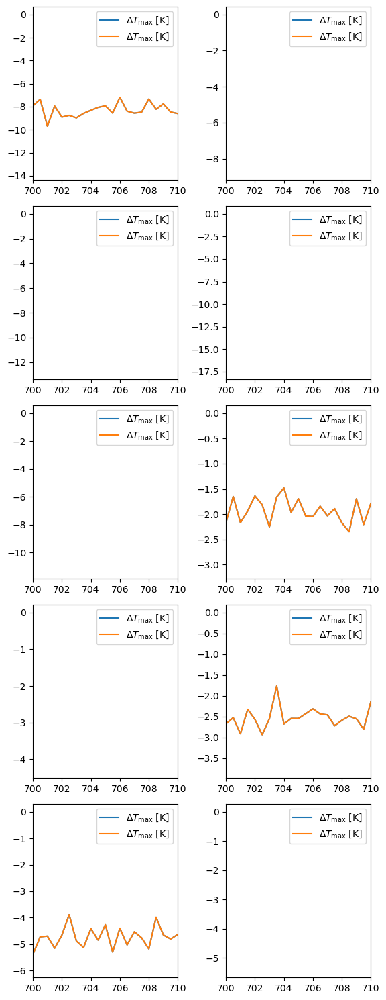

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([700,710])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

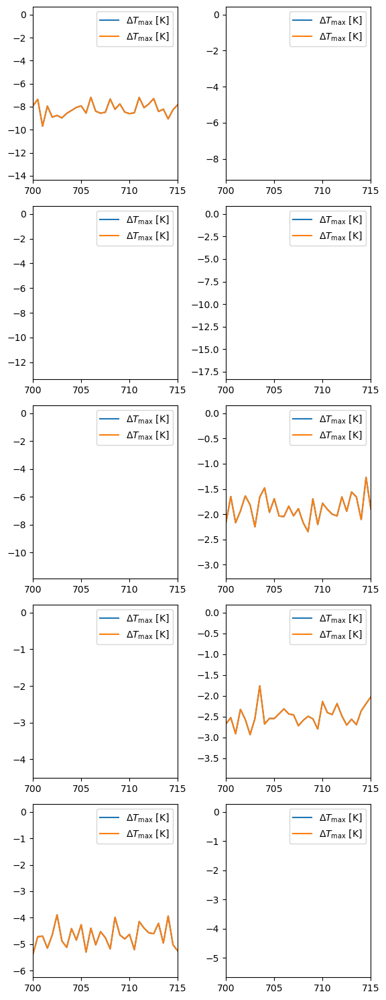

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([700,715])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

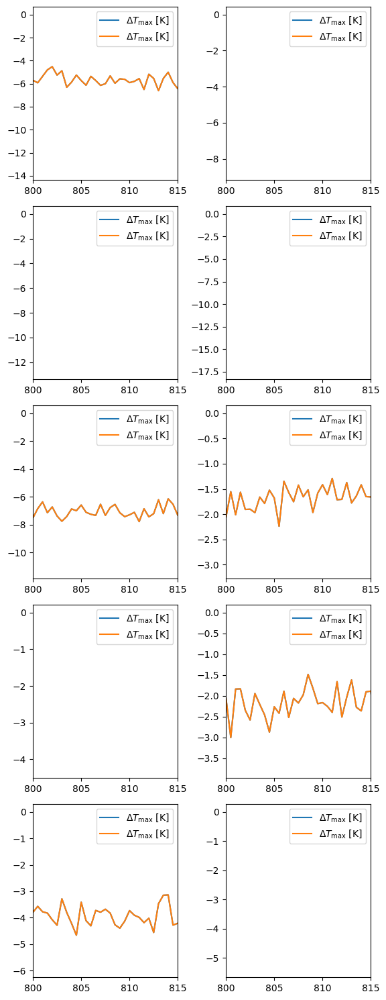

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([800,815])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

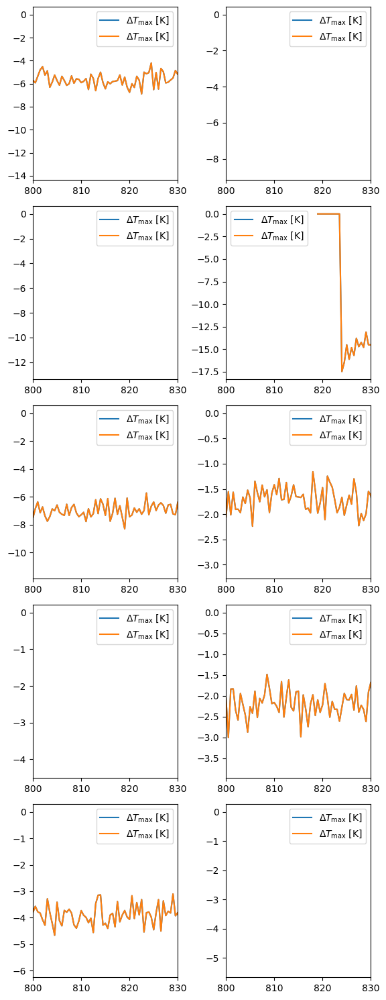

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([800,830])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

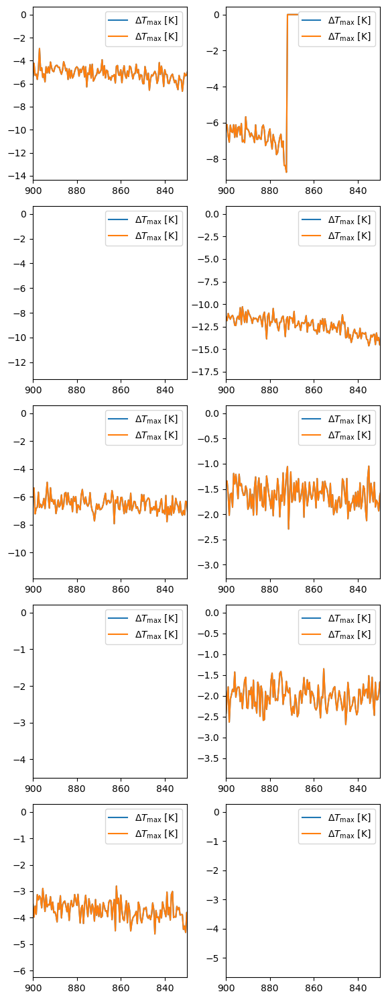

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([900,830])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

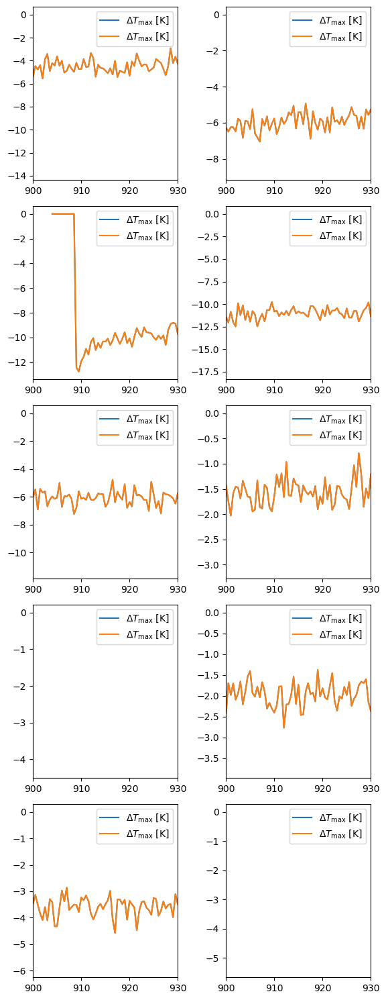

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i,j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i,j].legend()
        axs[i, j].set_xlim([900,930])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 80
n_out = 80
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-30-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-30-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(train)

62832

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-30-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1767/1768 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3912
Epoch 1: val_loss improved from inf to 0.26096, saving model to weights-improvement-01-0.26.keras
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 74s 38ms/step - loss: 0.3911 - val_loss: 0.2610
Epoch 2/50
1767/1768 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.2596
Epoch 2: val_loss improved from 0.26096 to 0.26001, saving model to weights-improvement-02-0.26.keras
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 68s 38ms/step - loss: 0.2596 - val_loss: 0.2600
Epoch 3/50
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2588
Epoch 3: val_loss improved from 0.26001 to 0.25988, saving model to weights-improvement-03-0.26.keras
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 63s 35ms/step - loss: 0.2588 - val_loss: 0.2599
Epoch 4/50
1767/1768 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2587
Epoch 4: val_loss improved from 0.25988 to 0.25980, saving model to weights-improvement-04-0.26.keras
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 61s 34ms/step - loss: 0.2587 - val_loss: 0.2598
Epoch 5/50


KeyboardInterrupt: 

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-30-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0976
Epoch 1: val_loss improved from inf to 0.00264, saving model to weights-improvement-01-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 115s 31ms/step - loss: 0.0976 - val_loss: 0.0026
Epoch 2/50
3534/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0024
Epoch 2: val_loss improved from 0.00264 to 0.00212, saving model to weights-improvement-02-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 113s 32ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 3/50
3534/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0019
Epoch 3: val_loss improved from 0.00212 to 0.00178, saving model to weights-improvement-03-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 108s 31ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4/50
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0016
Epoch 4: val_loss improved from 0.00178 to 0.00134, saving model to weights-improvement-04-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 114s 32ms/step - loss: 0.0016 - val_loss: 0.0

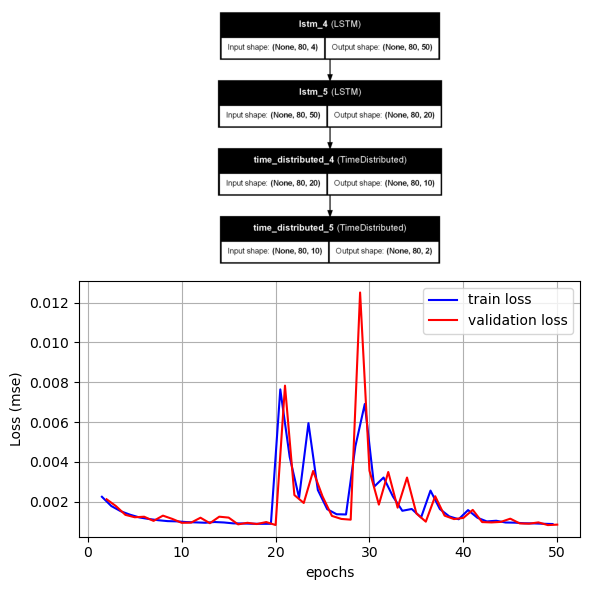

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:50], backup.history['loss'][1:50], label='train loss', color='b')
ax2.plot(epochs[1:50], backup.history['val_loss'][1:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

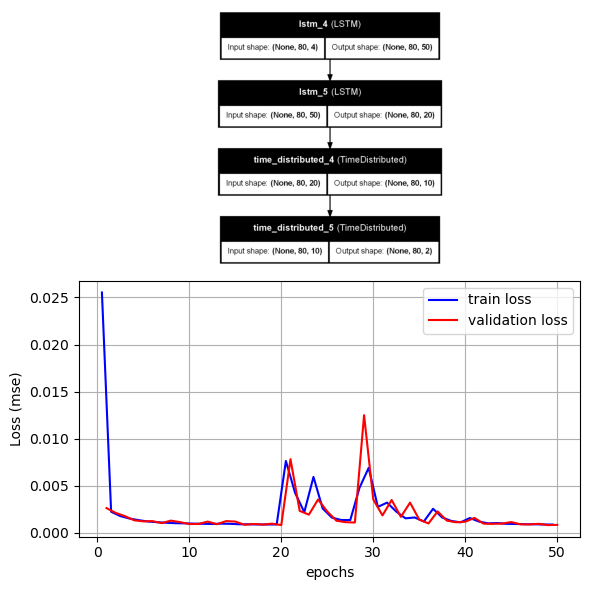

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:50], backup.history['loss'][:50], label='train loss', color='b')

ax2.plot(epochs[:50], backup.history['val_loss'][:50], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

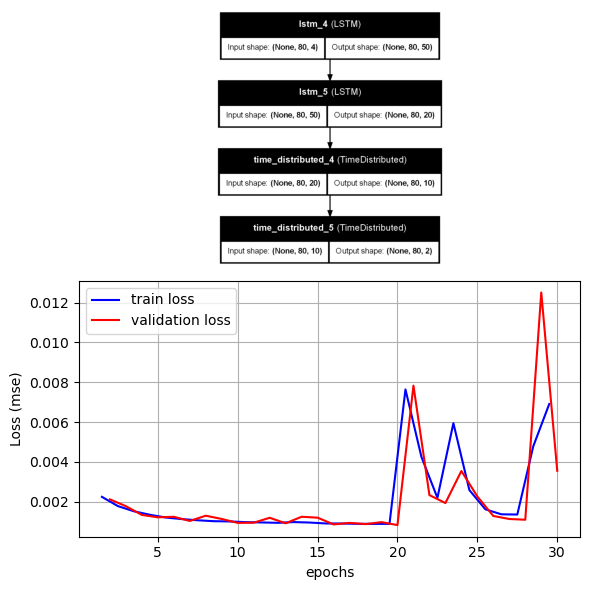

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[1:30], backup.history['val_loss'][1:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

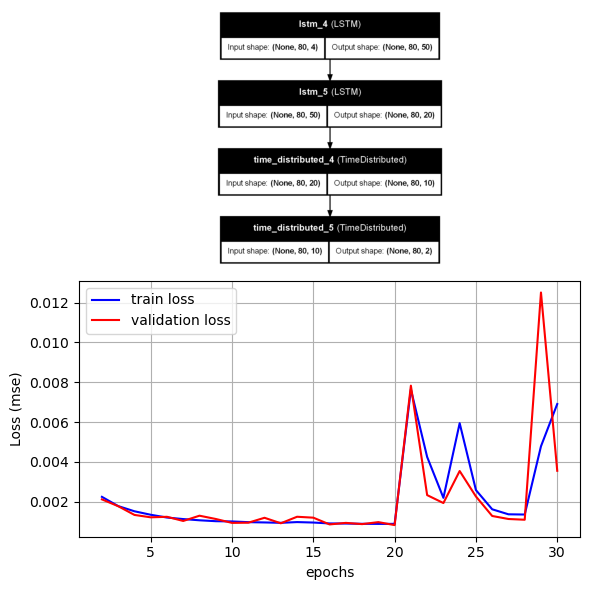

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[1:30], backup.history['val_loss'][1:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

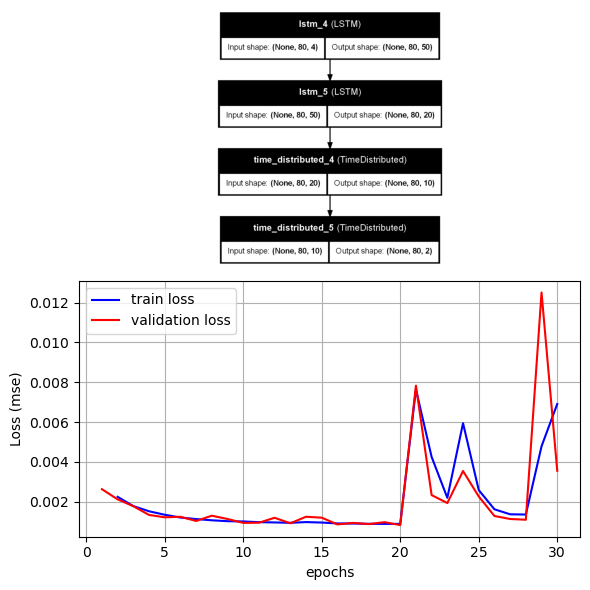

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[:30], backup.history['val_loss'][:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

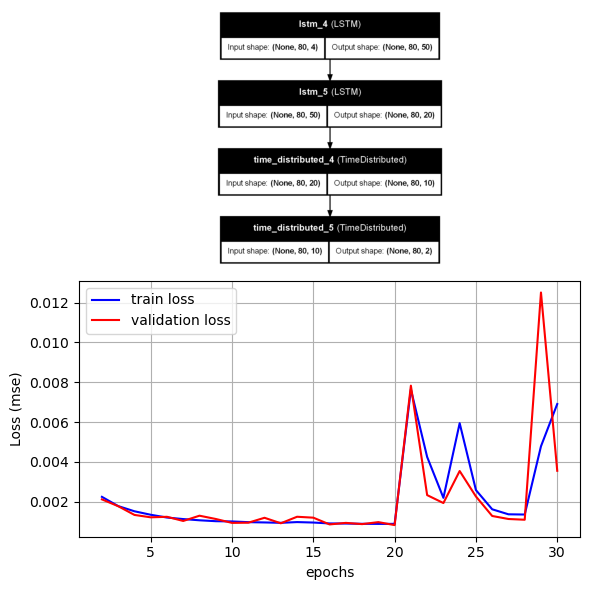

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[1:30], backup.history['val_loss'][1:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

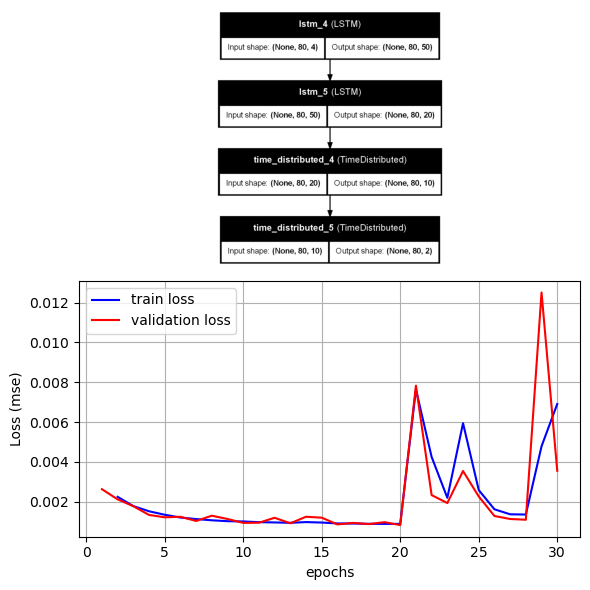

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[:30], backup.history['val_loss'][:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

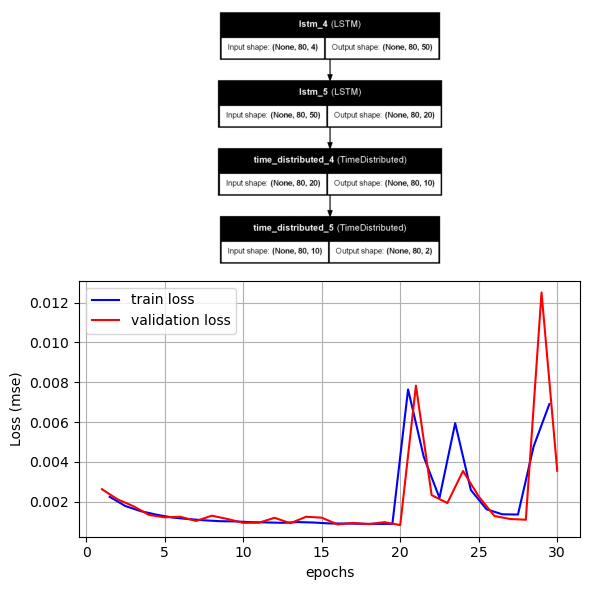

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:30], backup.history['loss'][1:30], label='train loss', color='b')

ax2.plot(epochs[:30], backup.history['val_loss'][:30], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

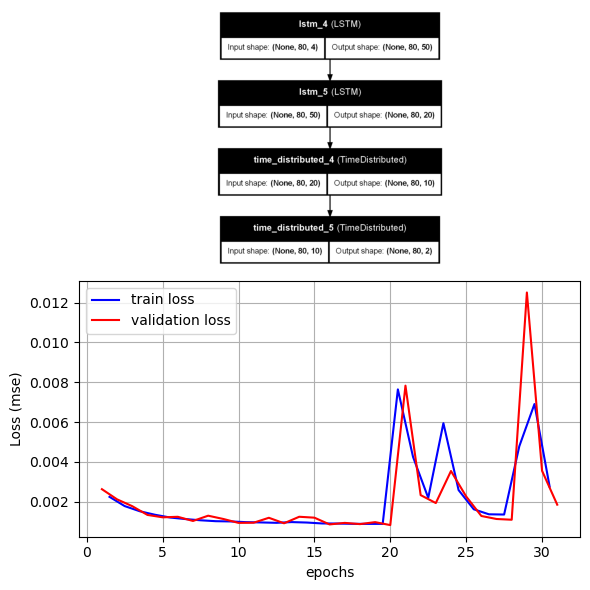

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:31], backup.history['loss'][1:31], label='train loss', color='b')

ax2.plot(epochs[:31], backup.history['val_loss'][:31], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

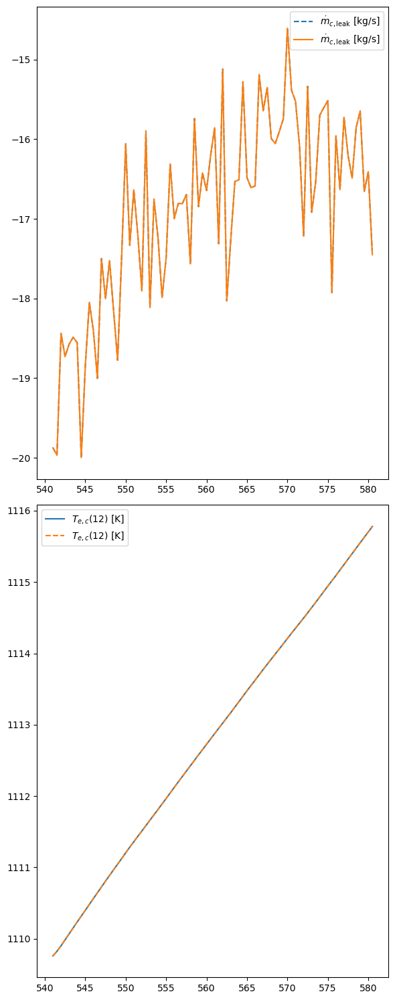

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

#%
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

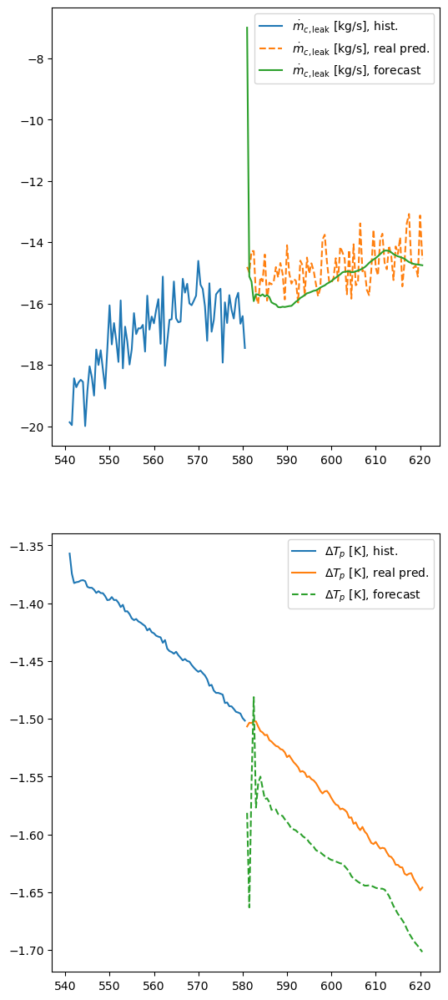

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='--', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-30-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/30
3534/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0965
Epoch 1: val_loss improved from inf to 0.00240, saving model to weights-improvement-01-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 138s 37ms/step - loss: 0.0964 - val_loss: 0.0024
Epoch 2/30
3534/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0022
Epoch 2: val_loss did not improve from 0.00240
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 131s 37ms/step - loss: 0.0022 - val_loss: 0.0027
Epoch 3/30
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0016
Epoch 3: val_loss improved from 0.00240 to 0.00153, saving model to weights-improvement-03-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 123s 35ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 4/30
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0014
Epoch 4: val_loss improved from 0.00153 to 0.00125, saving model to weights-improvement-04-0.00.keras
3535/3535 ━━━━━━━━━━━━━━━━━━━━ 117s 33ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 5/30
3534/3535 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/s

ValueError: x and y must have same first dimension, but have shapes (30,) and (29,)

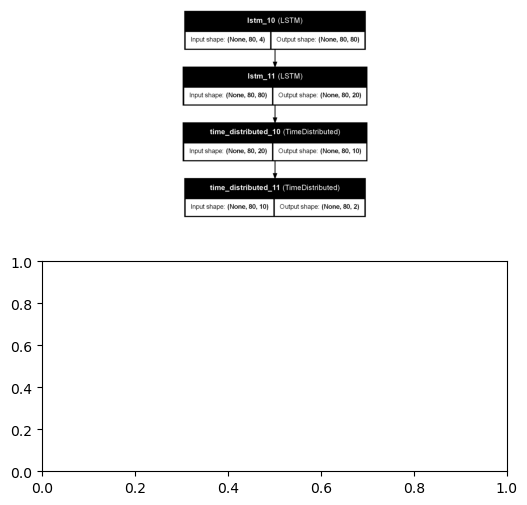

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:31], backup.history['loss'][1:31], label='train loss', color='b')

ax2.plot(epochs[:31], backup.history['val_loss'][:31], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

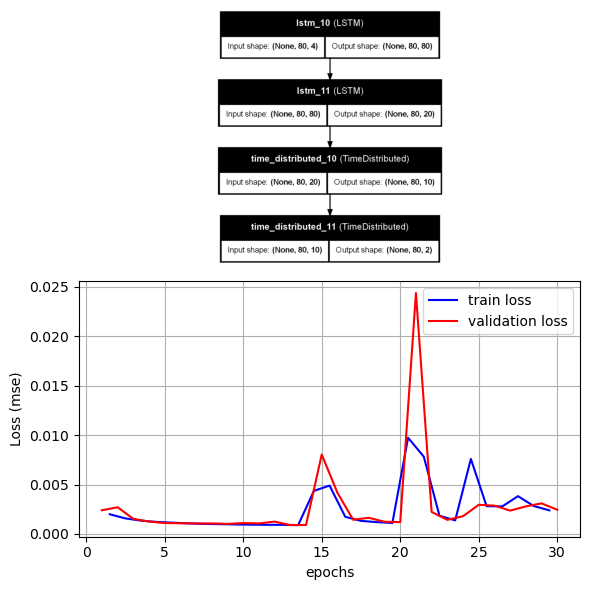

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 31)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:31], backup.history['loss'][1:31], label='train loss', color='b')

ax2.plot(epochs[:31], backup.history['val_loss'][:31], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

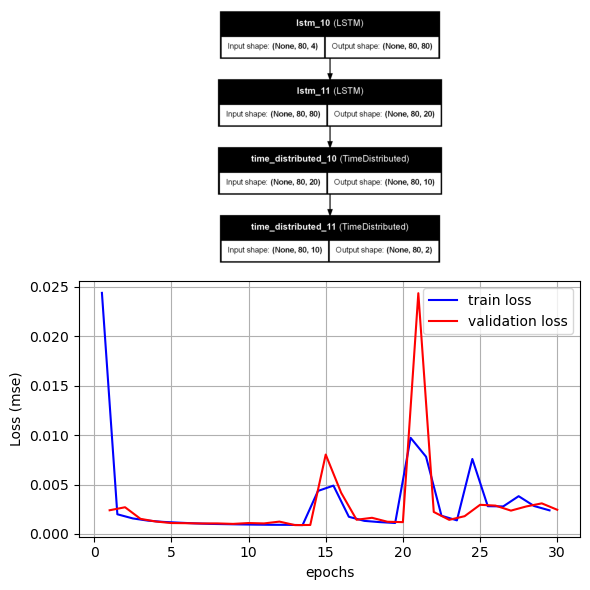

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 31)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[:31], backup.history['loss'][:31], label='train loss', color='b')

ax2.plot(epochs[:31], backup.history['val_loss'][:31], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
best_model = keras.saving.load_model('weights-improvement-13-0.0.keras')

ValueError: File not found: filepath=weights-improvement-13-0.0.keras. Please ensure the file is an accessible `.keras` zip file.

In [ ]:
best_model = keras.saving.load_model('weights-improvement-13-0.00.keras')

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.47574708, 0.6869142 ],
        [0.2913765 , 0.72818404],
        [0.31206453, 0.82599336],
        [0.34495977, 0.8835005 ],
        [0.38060692, 0.88300157],
        [0.37489888, 0.8783491 ],
        [0.36800358, 0.8768226 ],
        [0.37300274, 0.8736373 ],
        [0.37842023, 0.8678169 ],
        [0.37827972, 0.8656599 ],
        [0.3733062 , 0.8626811 ],
        [0.3679085 , 0.8578652 ],
        [0.36656803, 0.8547231 ],
        [0.36601985, 0.85157704],
        [0.3667095 , 0.8509487 ],
        [0.3661416 , 0.849162  ],
        [0.3678602 , 0.84947014],
        [0.36656135, 0.848009  ],
        [0.36871147, 0.8489137 ],
        [0.36731702, 0.8476149 ],
        [0.3694829 , 0.8486383 ],
        [0.3681734 , 0.8474612 ],
        [0.37040237, 0.8485365 ],
        [0.3691551 , 0.84741247],
        [0.371322  , 0.8484669 ],
        [0.37018877, 0.8474002 ],
        [0.37223607, 0.8484251 ],
        [0.3713124 , 0.84744406],
        [0.37314215, 0.8483772 ],
        [0.372

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

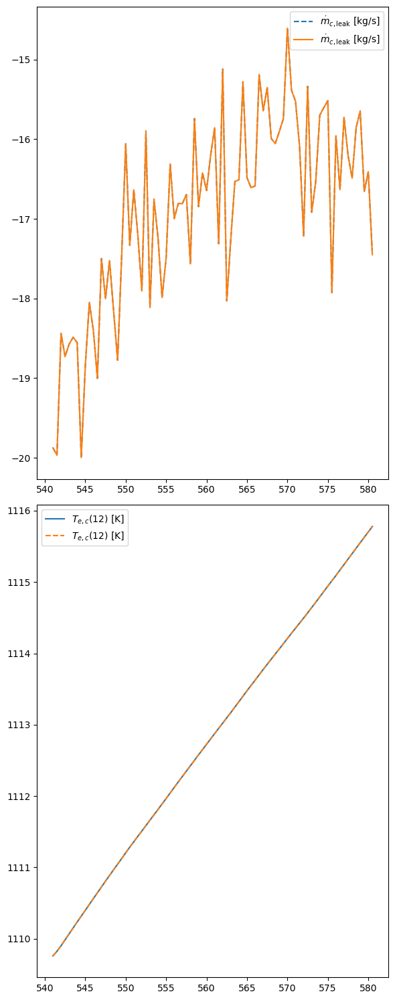

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

#%
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(model, to_test[0][0], 4)
real_test = to_test[1][0]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

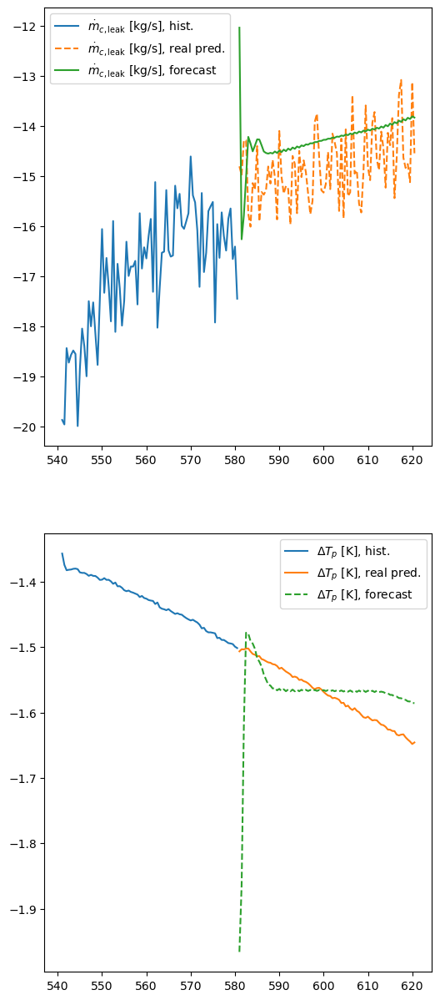

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='--', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

Connected to mcdet_lstm (Python 3.11.5)

In [ ]:
import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
# fault_time = 500

In [ ]:
# fault_time = 500

In [ ]:
available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time - 5] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time - 5]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

<ipython-input-6-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-6-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-6-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

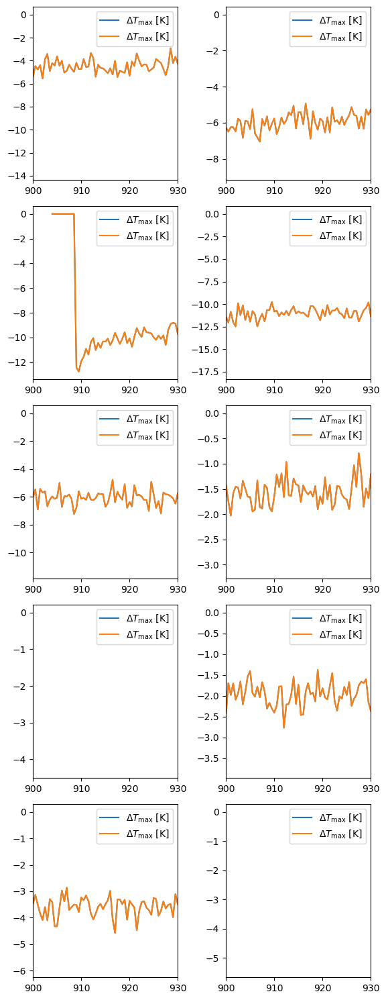

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i, j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i, j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i, j].legend()
        axs[i, j].set_xlim([900,930])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 30, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(100, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-15-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-15-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(train)

71819

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(100, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-15-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-15-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-15-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
4038/4040 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0942
Epoch 1: val_loss improved from inf to 0.00272, saving model to weights-improvement-01-0.00.keras
4040/4040 ━━━━━━━━━━━━━━━━━━━━ 90s 21ms/step - loss: 0.0942 - val_loss: 0.0027
Epoch 2/50
4040/4040 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0026
Epoch 2: val_loss improved from 0.00272 to 0.00199, saving model to weights-improvement-02-0.00.keras
4040/4040 ━━━━━━━━━━━━━━━━━━━━ 79s 20ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 3/50
4039/4040 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0020
Epoch 3: val_loss improved from 0.00199 to 0.00168, saving model to weights-improvement-03-0.00.keras
4040/4040 ━━━━━━━━━━━━━━━━━━━━ 84s 21ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 4/50
4039/4040 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0017
Epoch 4: val_loss improved from 0.00168 to 0.00154, saving model to weights-improvement-04-0.00.keras
4040/4040 ━━━━━━━━━━━━━━━━━━━━ 73s 18ms/step - loss: 0.0017 - val_loss: 0.0015


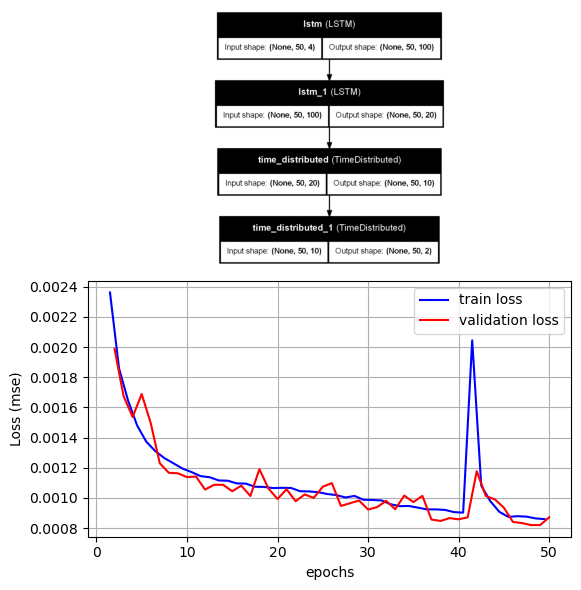

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:51], backup.history['loss'][1:51], label='train loss', color='b')

ax2.plot(epochs[1:51], backup.history['val_loss'][1:51], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

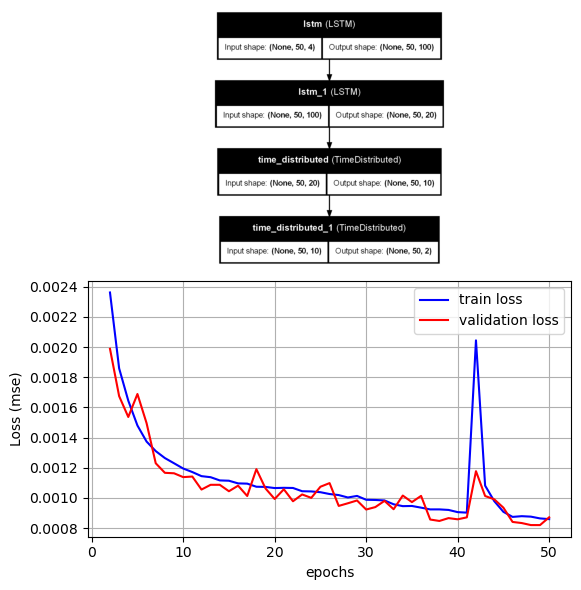

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch for epoch in epochs]

ax2.plot(shifted_epochs[1:51], backup.history['loss'][1:51], label='train loss', color='b')

ax2.plot(epochs[1:51], backup.history['val_loss'][1:51], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

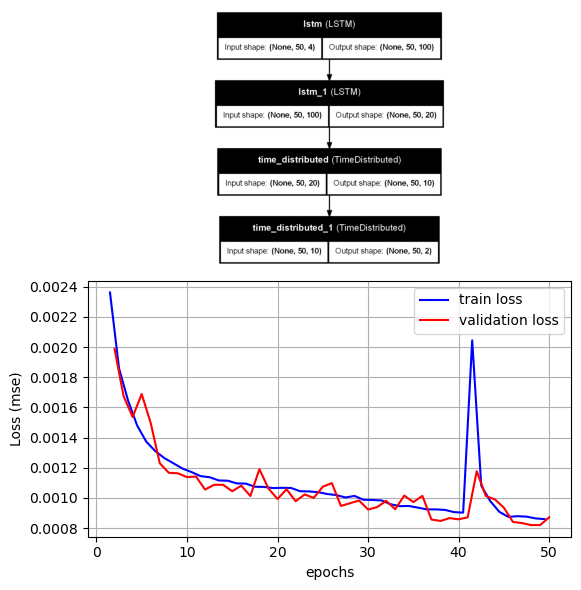

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:51], backup.history['loss'][1:51], label='train loss', color='b')

ax2.plot(epochs[1:51], backup.history['val_loss'][1:51], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.5257646 , 0.7606422 ],
        [0.30146274, 0.8789296 ],
        [0.32914424, 0.8994312 ],
        [0.34321913, 0.90257186],
        [0.34782818, 0.8964292 ],
        [0.3429558 , 0.8926031 ],
        [0.3367176 , 0.89158523],
        [0.34368104, 0.8986322 ],
        [0.34636468, 0.8987967 ],
        [0.33877   , 0.89313436],
        [0.36586216, 0.9096023 ],
        [0.35368156, 0.8957865 ],
        [0.3525555 , 0.8947777 ],
        [0.35387987, 0.894774  ],
        [0.34942335, 0.8913625 ],
        [0.35802028, 0.89697766],
        [0.3370706 , 0.88246393],
        [0.34375715, 0.8902134 ],
        [0.35031992, 0.89381105],
        [0.35773665, 0.8954542 ],
        [0.35638726, 0.8902701 ],
        [0.3453399 , 0.8810057 ],
        [0.34644383, 0.88274103],
        [0.34873086, 0.8844098 ],
        [0.34938723, 0.8845331 ],
        [0.3524273 , 0.8856842 ],
        [0.3643834 , 0.89099693],
        [0.36163563, 0.8849357 ],
        [0.3735961 , 0.88991976],
        [0.369

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

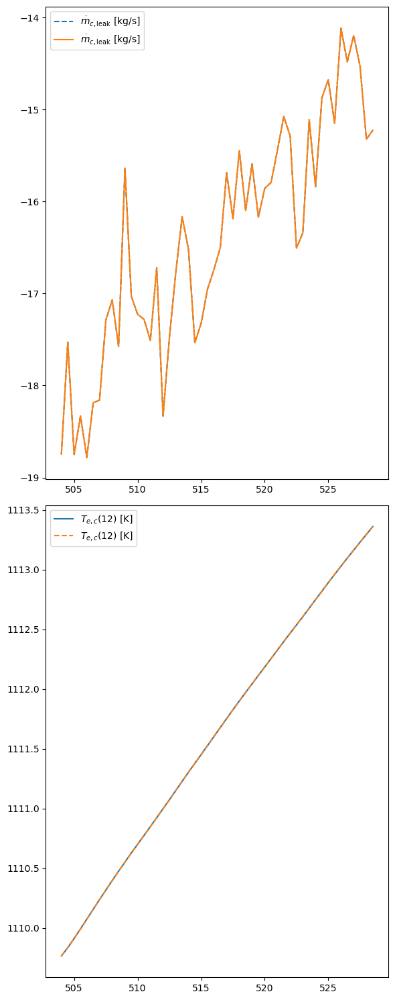

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

#%
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(model, to_test[0][0], 4)
real_test = to_test[1][0]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

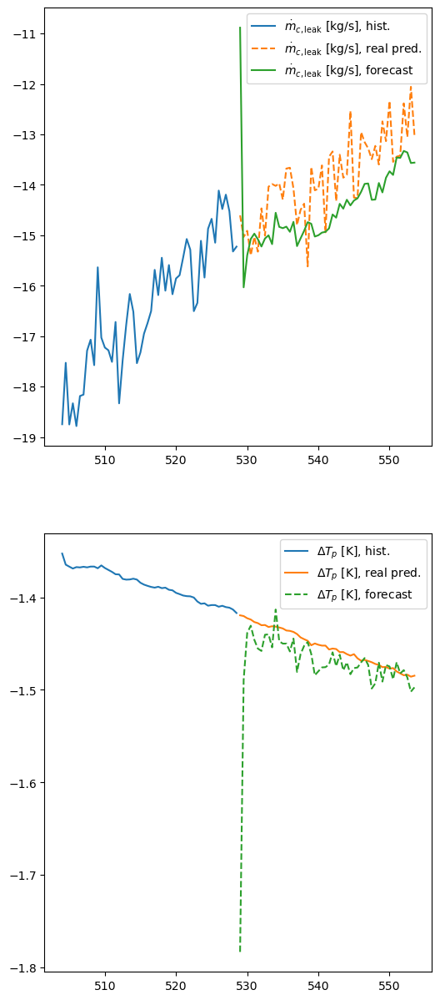

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='--', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
print('now checking possible inconsistencies... as the data passed includes timesteps previous the accident event')

now checking possible inconsistencies... as the data passed includes timesteps previous the accident event


In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

<ipython-input-38-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-38-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-38-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(100, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-47-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-47-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-47-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-47-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#model, backup = build_model(dataset, train, n_input, n_out)
model, backup = build_model_seq2seq(dataset, train, n_input, n_out)

<ipython-input-47-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


Epoch 1/50


c:\Users\leona\anaconda3\envs\mcdet_lstm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3951/3953 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0888
Epoch 1: val_loss improved from inf to 0.00247, saving model to weights-improvement-01-0.00.keras
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 72s 17ms/step - loss: 0.0888 - val_loss: 0.0025
Epoch 2/50
3951/3953 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0024
Epoch 2: val_loss improved from 0.00247 to 0.00178, saving model to weights-improvement-02-0.00.keras
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 65s 16ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 3/50
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0017
Epoch 3: val_loss improved from 0.00178 to 0.00142, saving model to weights-improvement-03-0.00.keras
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 65s 17ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 4/50
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0014
Epoch 4: val_loss did not improve from 0.00142
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 65s 16ms/step - loss: 0.0014 - val_loss: 0.0016
Epoch 5/50
3953/3953 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0

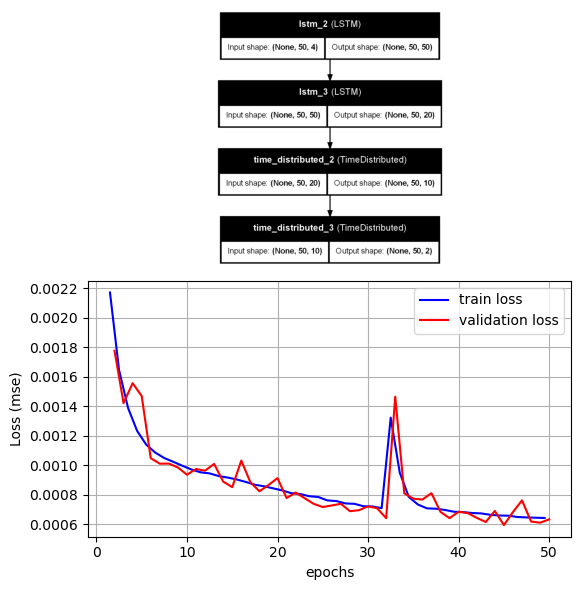

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,6))

# Save model architecture to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Read and display the model architecture image
img = plt.imread('model_plot.png')
ax1.imshow(img)
ax1.axis('off')

epochs = range(1, 51)
shifted_epochs = [epoch - 0.5 for epoch in epochs]

ax2.plot(shifted_epochs[1:51], backup.history['loss'][1:51], label='train loss', color='b')

ax2.plot(epochs[1:51], backup.history['val_loss'][1:51], label='validation loss', color='r')
ax2.legend()
ax2.set_xlabel('epochs')
ax2.set_ylabel('Loss (mse)')
ax2.grid(True)

plt.tight_layout()
#plt.savefig('combined_plot.png')
plt.show()

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

array([[[0.85240096, 0.97157866],
        [0.8804126 , 0.980276  ],
        [0.8808796 , 0.9735663 ],
        [0.87433153, 0.9685863 ],
        [0.88122594, 0.9750032 ],
        [0.8805365 , 0.97562987],
        [0.88281316, 0.9760706 ],
        [0.8754444 , 0.97029114],
        [0.8802556 , 0.9751715 ],
        [0.8808851 , 0.97546375],
        [0.87913275, 0.97348446],
        [0.87373304, 0.97000164],
        [0.87960196, 0.9753024 ],
        [0.87555915, 0.9717652 ],
        [0.87377924, 0.97086155],
        [0.87823564, 0.9744751 ],
        [0.8682208 , 0.96688956],
        [0.8822747 , 0.9776009 ],
        [0.869562  , 0.9667696 ],
        [0.8766937 , 0.97292054],
        [0.8724936 , 0.9693895 ],
        [0.8784743 , 0.97358036],
        [0.8761771 , 0.9705969 ],
        [0.87888396, 0.9719532 ],
        [0.873161  , 0.9672085 ],
        [0.8807213 , 0.9730596 ],
        [0.8792488 , 0.97058034],
        [0.8799982 , 0.970378  ],
        [0.87892324, 0.96914244],
        [0.882

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

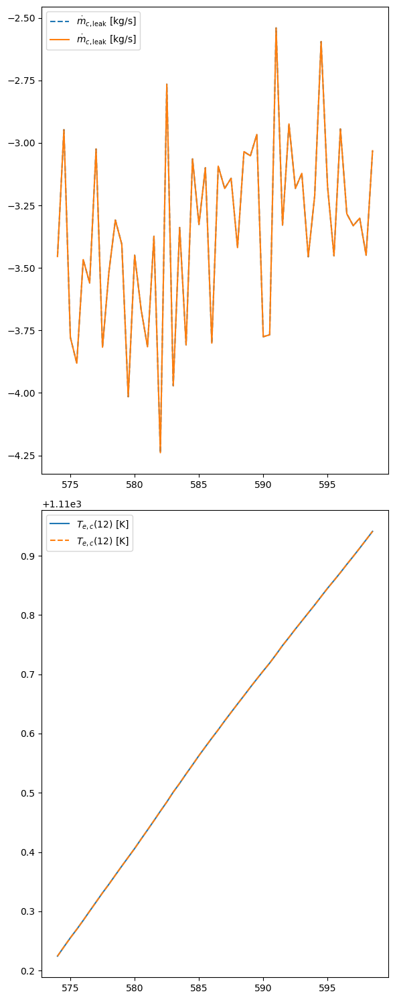

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

#%
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(model, to_test[0][0], 4)
real_test = to_test[1][0]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

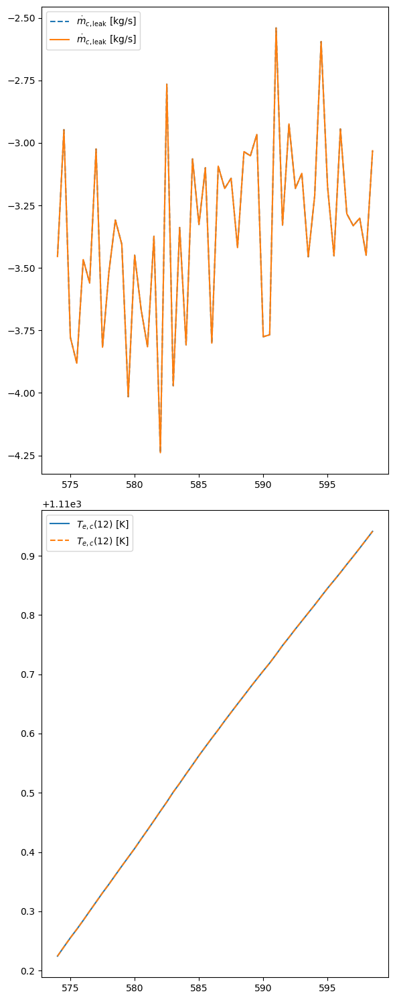

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

#%
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(model, to_test[0][0], 4)
real_test = to_test[1][0]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

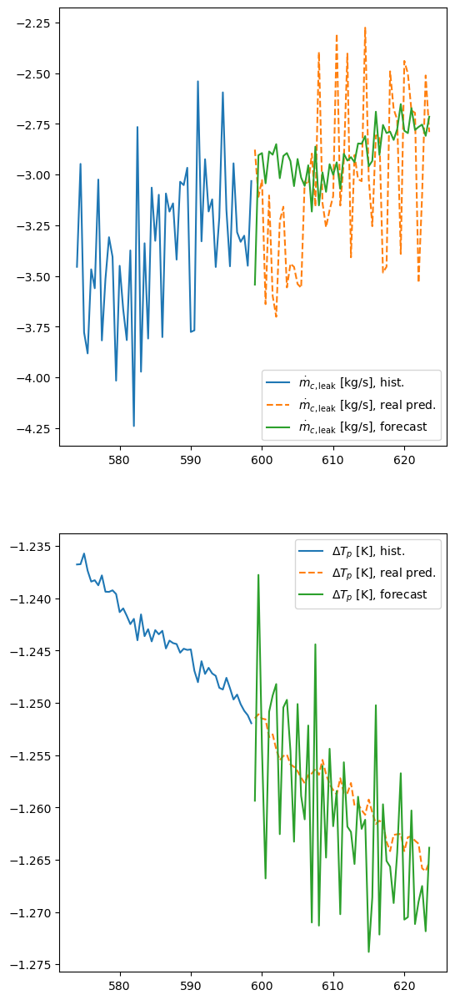

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='--',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='-', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

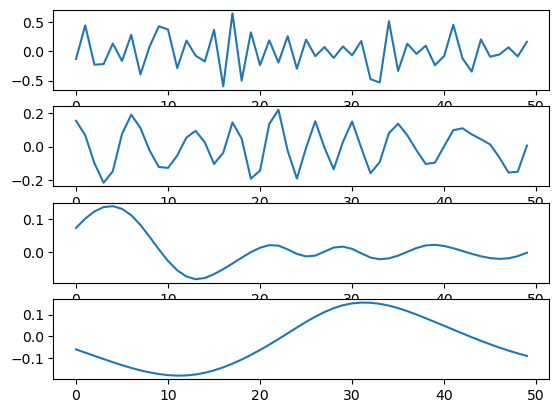

In [ ]:
emd_test = eng.emd(signal, nargout=1)

# matlab.double to numpy array
emd_test = np.array(emd_test)

#plot emd_test, one signal per subplot
plt.figure()
for i in range(emd_test.shape[1]):
    plt.subplot(emd_test.shape[1], 1, i+1)
    plt.plot(emd_test[:,i])

#hht_test = eng.hht(test_denorm_array.tolist(), nargout=1)

In [ ]:
keras.saving.save_model('weights-finalmodel-50-0.00065.keras')

TypeError: save_model() missing 1 required positional argument: 'filepath'

In [ ]:
#best_model = keras.saving.load_model('weights-improvement-13-0.00.keras')

#save the best model
save_model(model, 'weights-finalmodel-50-0.00065.keras')

NameError: name 'save_model' is not defined

In [ ]:
#best_model = keras.saving.load_model('weights-improvement-13-0.00.keras')

#save the best model
keras.saving.save_model(model, 'weights-finalmodel-50-0.00065.keras')

Connected to mcdet_lstm (Python 3.11.5)

In [ ]:
import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
python -i
from uqpylab import sessions
mySession = sessions.cloud(
    host="https://uqcloud.ethz.ch", 
    token="d5be0db31363cddc131eb77403efa247105a1132"
    )
mySession.save_config()
mySession = sessions.cloud()

NameError: name 'python' is not defined

In [ ]:
from uqpylab import sessions
mySession = sessions.cloud(
    host="https://uqcloud.ethz.ch", 
    token="d5be0db31363cddc131eb77403efa247105a1132"
    )
mySession.save_config()
mySession = sessions.cloud()

Processing . done!

 uqpylab.sessions :: INFO     :: This is UQ[py]Lab, version 0.991, running on https://uqcloud.ethz.ch. 
                                 UQ[py]Lab is free software, published under the open source BSD 3-clause license.
                                 To request special permissions, please contact:
                                  - Stefano Marelli (marelli@ibk.baug.ethz.ch).
                                 A new session (c0ca758c5a6b4564ae45dd05002c4c29) started.
 uqpylab.sessions :: INFO     :: Stored UQCloud configuration in C:\Users\leona\AppData\Local\UQCloud\UQCloud\uqcloud_config.json


In [ ]:
import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time]

In [ ]:
# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

In [ ]:
# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

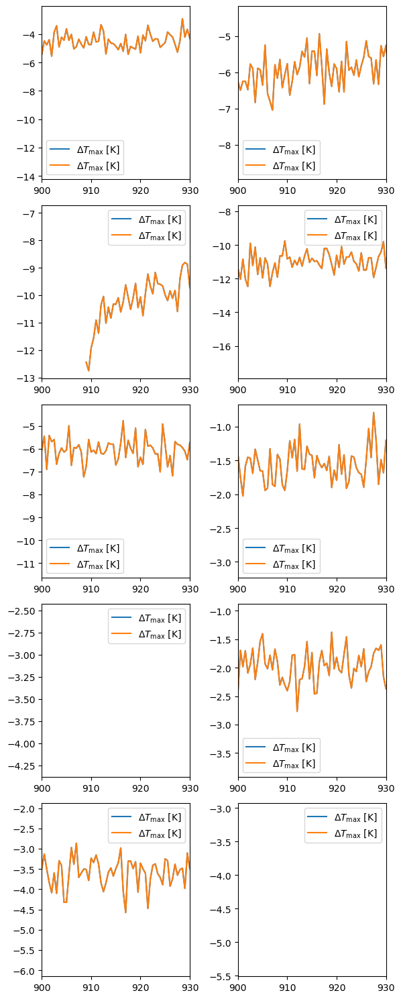

In [ ]:
fig, axs = plt.subplots(5,2, figsize=(6,15))
#fault_time = 500

for i in range(5):
    for j in range(2):
        #plot the new added columns with respect to time
        id_list = 5*j + i
        xl_hrm = df_list_hrm[-id_list]
        xl_rom = df_list_rom[-id_list]
        #plt.plot(xl_hrm['t[s]'], xl_hrm['tw_max'], label='High-resolution model (Physical Object)')
        axs[i, j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        axs[i, j].plot(xl_rom['t[s]'], xl_rom['mdot_c_leak'], label=r'$\Delta T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['delta_Tp'], label=r'$T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['Tp'], label=r'$ T_{\mathrm{max}}$ [K]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['mdot_c_1'], label=r'${\dot{m}}_{c}^{1}$ [kg/s]')
        #axs[i,j].plot(xl_hrm['t[s]'], xl_hrm['M_c_1'], label=r'${M}_{c}^{1}$ [kg]')
        axs[i, j].legend()
        axs[i, j].set_xlim([900,930])  # Set the timespan for the plot
        #axs[i,j].axvline(x=500, color='k', linestyle='--')

plt.tight_layout()
plt.show()

# # Obs: STRONG CORRELATION BETWEEN MDOT_C_1 AND DELTA_TW_MAX

In [ ]:
# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-16-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-16-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
len(test)

12509

In [ ]:
#best_model = keras.saving.load_model('weights-improvement-13-0.00.keras')

#save the best model
keras.saving.save_model(model, 'weights-finalmodel-50-0.00065.keras')

NameError: name 'model' is not defined

In [ ]:
load_model = keras.saving.load_model('weights-improvement-50-0.00065.keras')

#save the best model
#keras.saving.save_model(model, 'weights-finalmodel-50-0.00065.keras')

ValueError: File not found: filepath=weights-improvement-50-0.00065.keras. Please ensure the file is an accessible `.keras` zip file.

In [ ]:
load_model = keras.saving.load_model('weights-finalmodel-50-0.00065.keras')

#save the best model
#keras.saving.save_model(model, 'weights-improvement-50-0.00065.keras')

In [ ]:
to_test[0].shape

(12509, 50, 4)

In [ ]:
to_test[1].shape

(12509, 50, 2)

In [ ]:
train.shape

(70273, 50, 7)

In [ ]:
test.shape

(12509, 50, 7)

In [ ]:
train

array([[[3.20000000e+01, 6.19500000e+02, 3.34541139e-01, ...,
         9.74779288e-01, 9.69113175e-01, 9.11620788e-01],
        [3.20000000e+01, 6.20000000e+02, 3.84764305e-01, ...,
         9.74068247e-01, 9.68562844e-01, 9.09842052e-01],
        [3.20000000e+01, 6.20500000e+02, 3.30680854e-01, ...,
         9.73418178e-01, 9.67957042e-01, 9.09941167e-01],
        ...,
        [3.20000000e+01, 6.43000000e+02, 3.89051666e-01, ...,
         9.40627097e-01, 9.43062229e-01, 8.84122007e-01],
        [3.20000000e+01, 6.43500000e+02, 4.80749316e-01, ...,
         9.39942111e-01, 9.42476493e-01, 8.82974608e-01],
        [3.20000000e+01, 6.44000000e+02, 4.48849628e-01, ...,
         9.39271065e-01, 9.41872959e-01, 8.84187672e-01]],

       [[1.08000000e+02, 7.74500000e+02, 9.24893295e-01, ...,
         9.44885802e-01, 9.64315165e-01, 9.52479748e-01],
        [1.08000000e+02, 7.75000000e+02, 9.49713580e-01, ...,
         9.44755030e-01, 9.64267193e-01, 9.51861777e-01],
        [1.08000000e+02, 

In [ ]:
to_train.shape

AttributeError: 'tuple' object has no attribute 'shape'

In [ ]:
to_train[0].shape

(70273, 50, 4)

In [ ]:
to_train[1].shape

(70273, 50, 2)

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

NameError: name 'forecast' is not defined

In [ ]:
def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(model,to_test[0][0], 4)

NameError: name 'model' is not defined

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(load_model,to_test[0][0], 4)

array([[[0.85484725, 0.97350436],
        [0.8791775 , 0.9802898 ],
        [0.8943053 , 0.98083305],
        [0.8854169 , 0.96942794],
        [0.88766086, 0.97303957],
        [0.891577  , 0.9779703 ],
        [0.8906345 , 0.9767791 ],
        [0.8915551 , 0.9768563 ],
        [0.8886288 , 0.9755734 ],
        [0.8926506 , 0.978181  ],
        [0.8939291 , 0.9777943 ],
        [0.8957416 , 0.97754073],
        [0.89402795, 0.976016  ],
        [0.89148575, 0.9746794 ],
        [0.8937325 , 0.9766747 ],
        [0.8902265 , 0.97444916],
        [0.89632374, 0.97793853],
        [0.89583135, 0.97638327],
        [0.8919916 , 0.9735248 ],
        [0.8926818 , 0.974924  ],
        [0.8915496 , 0.9745902 ],
        [0.89397866, 0.9761963 ],
        [0.8966872 , 0.97673863],
        [0.890584  , 0.9720147 ],
        [0.89748466, 0.97675383],
        [0.8942046 , 0.97387075],
        [0.89390486, 0.97378045],
        [0.8956913 , 0.9752521 ],
        [0.896317  , 0.97518766],
        [0.892

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[0][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

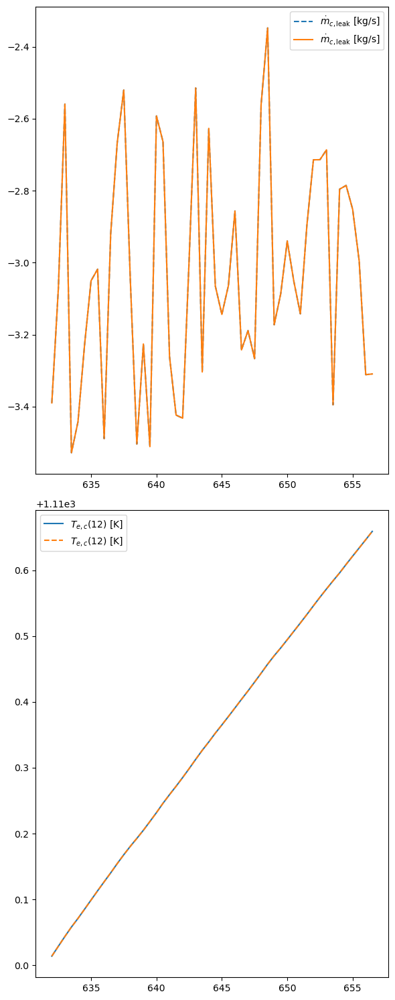

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(load_model, to_test[0][0], 4)
real_test = to_test[1][0]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

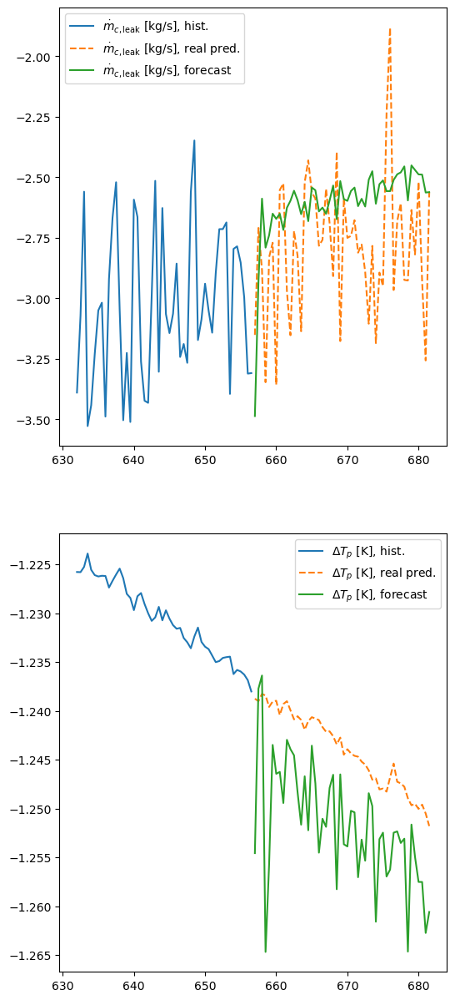

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='--',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='-', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
# forecast the test data
forecast_test = forecast(load_model, to_test[0][1], 4)
real_test = to_test[1][1]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

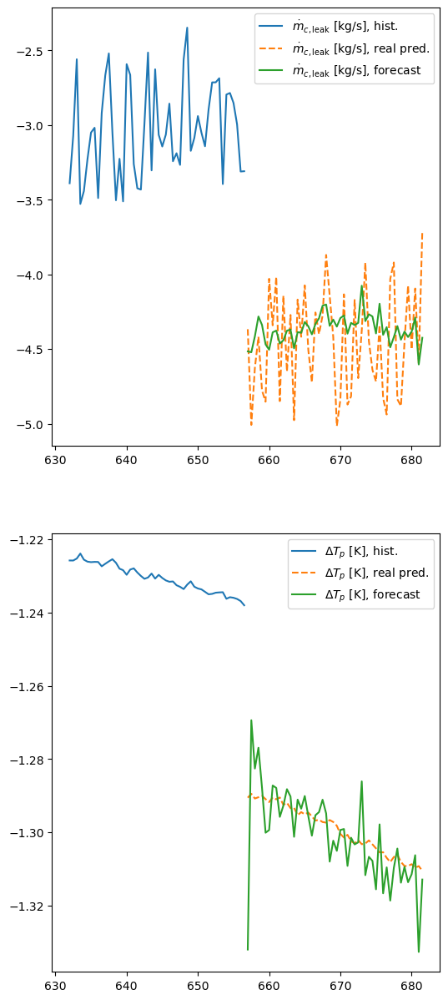

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='--',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='-', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(load_model,to_test[0][1], 4)

array([[[0.8096608 , 0.9423095 ],
        [0.8094008 , 0.9675327 ],
        [0.8140999 , 0.9622209 ],
        [0.81991714, 0.96450573],
        [0.8174444 , 0.96010214],
        [0.8117263 , 0.9551605 ],
        [0.810159  , 0.955455  ],
        [0.8152747 , 0.9603516 ],
        [0.81577384, 0.9600892 ],
        [0.81196713, 0.9569037 ],
        [0.812936  , 0.9581442 ],
        [0.8157588 , 0.95995057],
        [0.81608915, 0.9591437 ],
        [0.8105645 , 0.95471185],
        [0.8153198 , 0.9587999 ],
        [0.8151362 , 0.95780516],
        [0.81830233, 0.9591969 ],
        [0.8170302 , 0.95697707],
        [0.8146736 , 0.95483494],
        [0.81773084, 0.95708644],
        [0.8193967 , 0.9574279 ],
        [0.8230829 , 0.9587916 ],
        [0.823447  , 0.9572862 ],
        [0.8171679 , 0.9519843 ],
        [0.81900364, 0.95428365],
        [0.8169478 , 0.9531677 ],
        [0.8194652 , 0.955461  ],
        [0.8202071 , 0.9555678 ],
        [0.8148839 , 0.95151174],
        [0.818

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[1][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

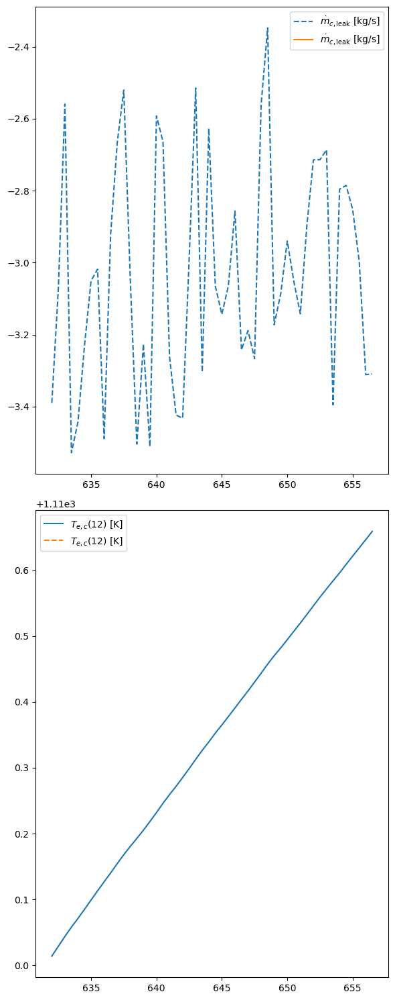

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
test

array([[[1.36000000e+02, 6.32000000e+02, 8.59114486e-01, ...,
         9.94733816e-01, 9.96910352e-01, 9.85105118e-01],
        [1.36000000e+02, 6.32500000e+02, 8.73085566e-01, ...,
         9.94624611e-01, 9.96776685e-01, 9.85099015e-01],
        [1.36000000e+02, 6.33000000e+02, 8.95566313e-01, ...,
         9.94504324e-01, 9.96649368e-01, 9.85317268e-01],
        ...,
        [1.36000000e+02, 6.55500000e+02, 8.76408334e-01, ...,
         9.88142817e-01, 9.91596988e-01, 9.80872559e-01],
        [1.36000000e+02, 6.56000000e+02, 8.62554067e-01, ...,
         9.87993625e-01, 9.91490942e-01, 9.80642736e-01],
        [1.36000000e+02, 6.56500000e+02, 8.62643193e-01, ...,
         9.87851929e-01, 9.91380288e-01, 9.80176248e-01]],

       [[1.87000000e+02, 7.31500000e+02, 7.77803701e-01, ...,
         9.89503201e-01, 9.90419163e-01, 9.68513852e-01],
        [1.87000000e+02, 7.32000000e+02, 7.81284638e-01, ...,
         9.89252946e-01, 9.90226891e-01, 9.68313387e-01],
        [1.87000000e+02, 

In [ ]:
test.shape

(12509, 50, 7)

In [ ]:
dataset.shape



AttributeError: 'list' object has no attribute 'shape'

In [ ]:
len(dataset)

200

In [ ]:
dataset[0].shape

(665, 7)

In [ ]:
dataset[1].shape

(325, 7)

In [ ]:
train[0].shape

(50, 7)

In [ ]:
train.shape

(70273, 50, 7)

In [ ]:
to_test[0]

array([[[8.59114486e-01, 3.91696562e-03, 9.94733816e-01, 9.96910352e-01],
        [8.73085566e-01, 4.09146273e-03, 9.94624611e-01, 9.96776685e-01],
        [8.95566313e-01, 4.26446148e-03, 9.94504324e-01, 9.96649368e-01],
        ...,
        [8.76408334e-01, 1.11275241e-02, 9.88142817e-01, 9.91596988e-01],
        [8.62554067e-01, 1.12725027e-02, 9.87993625e-01, 9.91490942e-01],
        [8.62643193e-01, 1.14197758e-02, 9.87851929e-01, 9.91380288e-01]],

       [[7.77803701e-01, 1.25707898e-02, 9.89503201e-01, 9.90419163e-01],
        [7.81284638e-01, 1.28405854e-02, 9.89252946e-01, 9.90226891e-01],
        [7.82099934e-01, 1.31097741e-02, 9.89006751e-01, 9.90030483e-01],
        ...,
        [8.17275016e-01, 2.43768530e-02, 9.77769314e-01, 9.81657327e-01],
        [7.51656585e-01, 2.46250210e-02, 9.77496527e-01, 9.81472588e-01],
        [7.84205823e-01, 2.48634850e-02, 9.77204706e-01, 9.81308183e-01]],

       [[4.74163896e-01, 1.10857146e-02, 9.95081047e-01, 9.91267703e-01],
        

In [ ]:
to_test[0][1]

array([[0.7778037 , 0.01257079, 0.9895032 , 0.99041916],
       [0.78128464, 0.01284059, 0.98925295, 0.99022689],
       [0.78209993, 0.01310977, 0.98900675, 0.99003048],
       [0.80057621, 0.01337605, 0.98875615, 0.98983626],
       [0.80504396, 0.01363978, 0.98850403, 0.98964162],
       [0.77407587, 0.01389394, 0.98823287, 0.98946191],
       [0.77070942, 0.01414037, 0.98795401, 0.98928969],
       [0.79043225, 0.01439468, 0.98771039, 0.98909258],
       [0.79728971, 0.01465515, 0.98748025, 0.98888781],
       [0.78311069, 0.01491225, 0.98723128, 0.98869812],
       [0.78403182, 0.01516535, 0.98697373, 0.98851709],
       [0.79769715, 0.01542163, 0.98673134, 0.9883253 ],
       [0.80131582, 0.0156787 , 0.98648943, 0.98813185],
       [0.77375993, 0.01593052, 0.98623332, 0.98794925],
       [0.79269369, 0.01617778, 0.98597049, 0.98777289],
       [0.79496698, 0.01643374, 0.98573655, 0.98757289],
       [0.81090223, 0.01668643, 0.98548906, 0.98738522],
       [0.80133062, 0.0169374 ,

In [ ]:
#test_1 = test[0:2]
#print(test_1)
forecast(load_model,to_test[0][1], 4)

array([[[0.8096608 , 0.9423095 ],
        [0.8094008 , 0.9675327 ],
        [0.8140999 , 0.9622209 ],
        [0.81991714, 0.96450573],
        [0.8174444 , 0.96010214],
        [0.8117263 , 0.9551605 ],
        [0.810159  , 0.955455  ],
        [0.8152747 , 0.9603516 ],
        [0.81577384, 0.9600892 ],
        [0.81196713, 0.9569037 ],
        [0.812936  , 0.9581442 ],
        [0.8157588 , 0.95995057],
        [0.81608915, 0.9591437 ],
        [0.8105645 , 0.95471185],
        [0.8153198 , 0.9587999 ],
        [0.8151362 , 0.95780516],
        [0.81830233, 0.9591969 ],
        [0.8170302 , 0.95697707],
        [0.8146736 , 0.95483494],
        [0.81773084, 0.95708644],
        [0.8193967 , 0.9574279 ],
        [0.8230829 , 0.9587916 ],
        [0.823447  , 0.9572862 ],
        [0.8171679 , 0.9519843 ],
        [0.81900364, 0.95428365],
        [0.8169478 , 0.9531677 ],
        [0.8194652 , 0.955461  ],
        [0.8202071 , 0.9555678 ],
        [0.8148839 , 0.95151174],
        [0.818

In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[0,:,:], columns=test_cols)

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[1][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

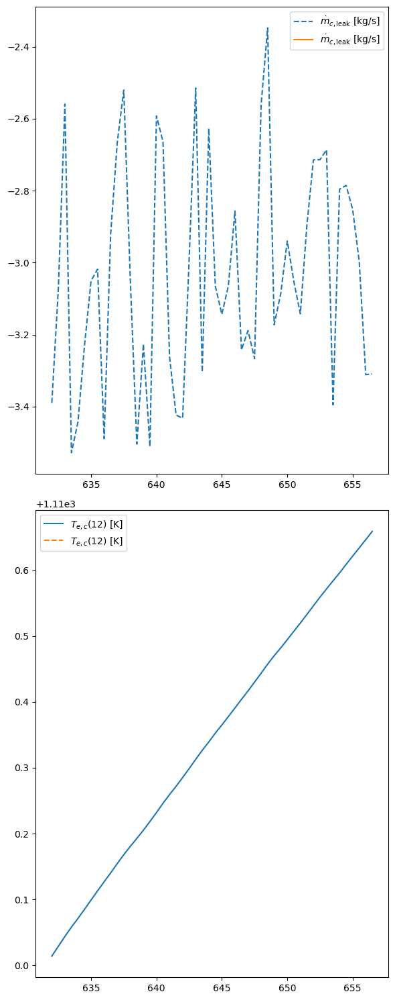

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
idsim

187

ValueError: 'r-' is not a valid value for ls; supported values are '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

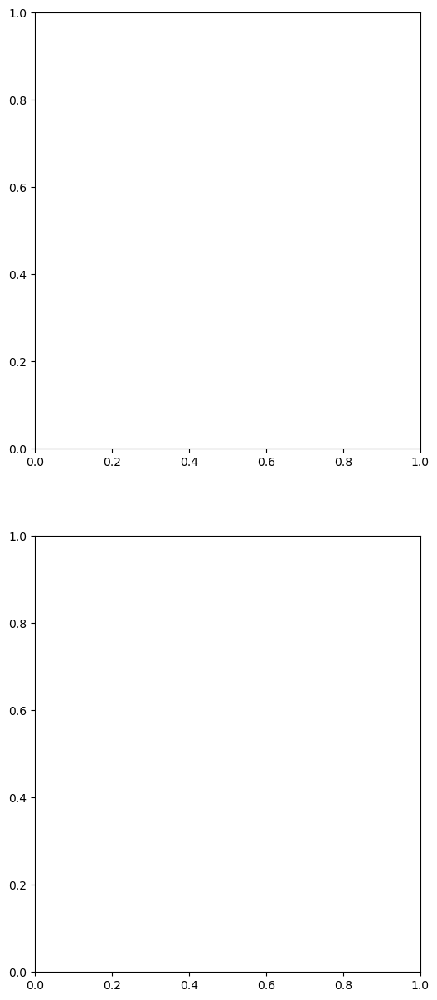

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='r-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

ValueError: 'x-' is not a valid value for ls; supported values are '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

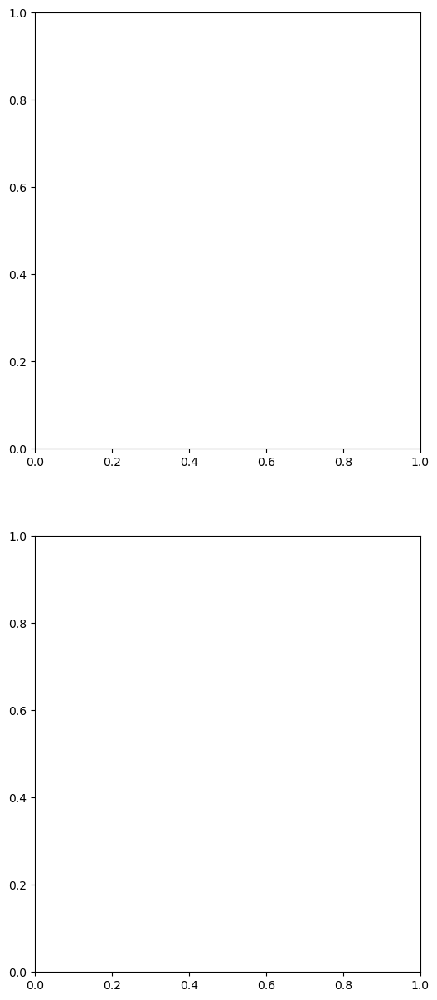

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='x-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

ValueError: 'x' is not a valid value for ls; supported values are '-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

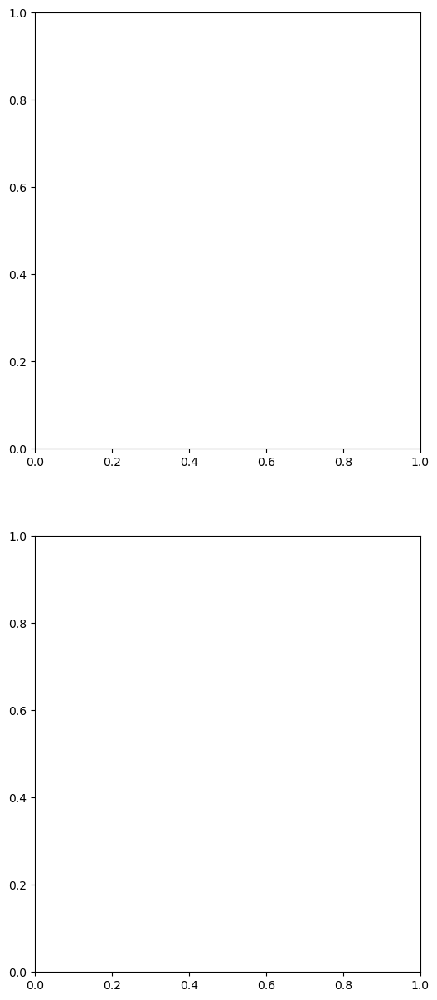

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='x', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle=''', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

SyntaxError: incomplete input (<ipython-input-68-c02a24a818ed>, line 6)

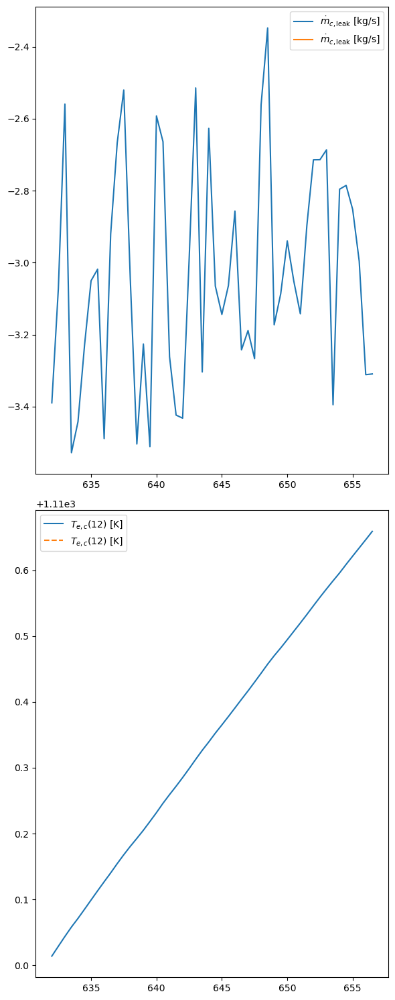

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

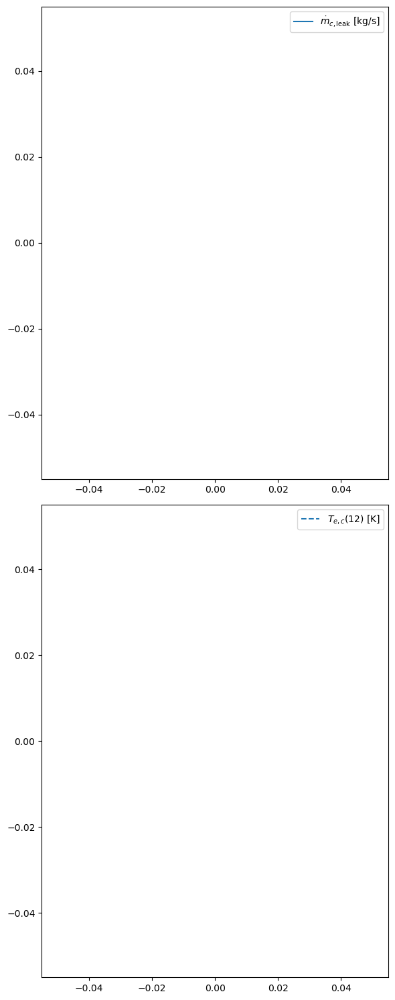

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

#axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

#axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
test_origin

,t[s],mdot_c_1,mdot_c_2,mdot_c_3,mdot_c_4,mdot_c_5,mdot_c_6,mdot_c_7,mdot_c_8,mdot_c_9,...,P_8,P_9,P_10,P_11,P_12,Tin_c,mdot_c_leak,P_tot,Tp,delta_Tp


In [ ]:
test_denormalized

,ID_sim,t[s],mdot_c_leak,Te_c_12,Te_f_12,Tin_c,delta_Tp
0,136.0,632.0,-3.389410,1110.013890,1287.562108,983.070457,0.985105
1,136.0,632.5,-3.071307,1110.028897,1287.561788,983.070436,0.985099
2,136.0,633.0,-2.559452,1110.043775,1287.561434,983.070416,0.985317
3,136.0,633.5,-3.527886,1110.058093,1287.561029,983.070398,0.985867
4,136.0,634.0,-3.441820,1110.071198,1287.560542,983.070383,0.985195
5,136.0,634.5,-3.229576,1110.085058,1287.560173,983.070363,0.984976
6,136.0,635.0,-3.050046,1110.099133,1287.559817,983.070343,0.984921
7,136.0,635.5,-3.018131,1110.113123,1287.559434,983.070324,0.984950
8,136.0,636.0,-3.488635,1110.126836,1287.559023,983.070306,0.984941
9,136.0,636.5,-2.919971,1110.140336,1287.558605,983.070288,0.984464


In [ ]:
def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[1,:,:], columns=test_cols)

In [ ]:
# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[1][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

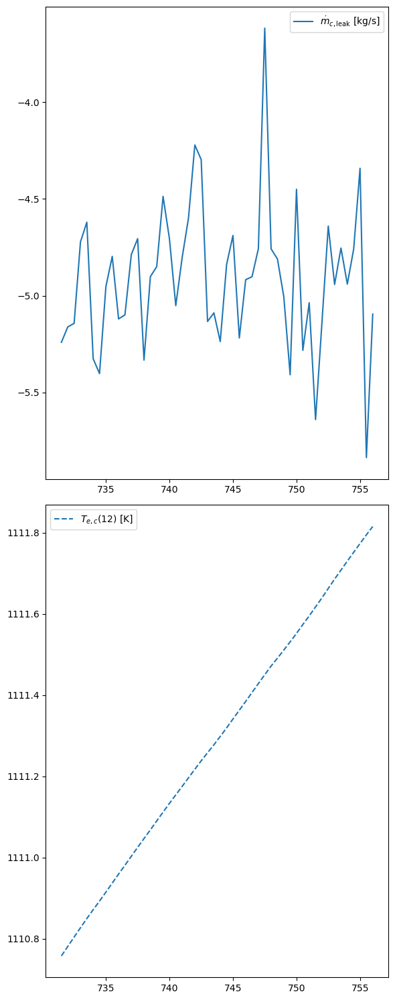

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

#axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

#axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

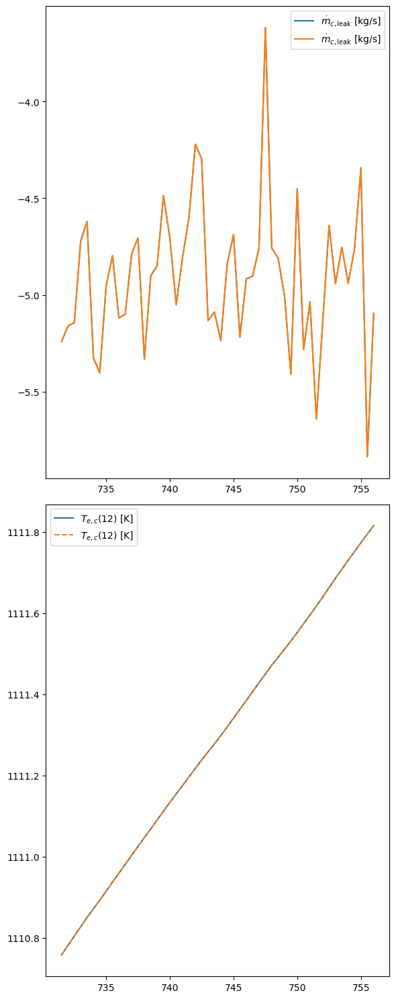

In [ ]:
#compare the original data with the denormalized data
fig, axs = plt.subplots(2,1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
# forecast the test data
forecast_test = forecast(load_model, to_test[0][1], 4)
real_test = to_test[1][1]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

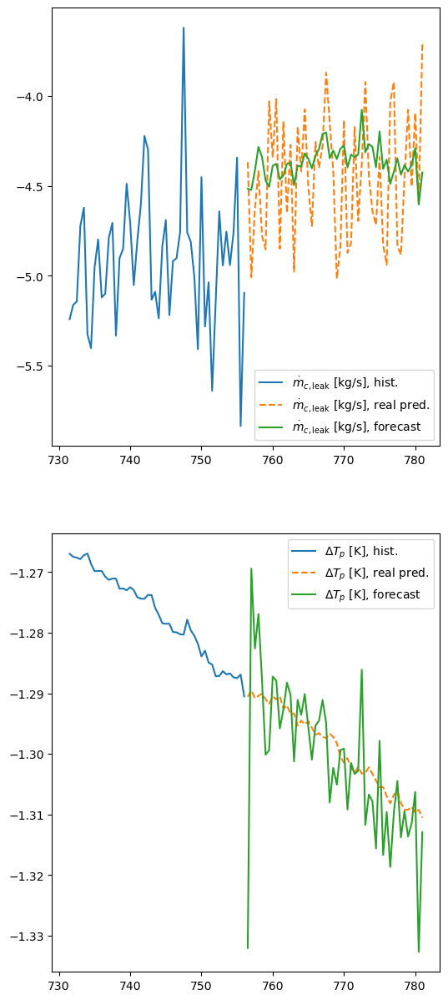

In [ ]:
for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='--',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='-', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
emd.sift.sift?

Signature:
emd.sift.sift(
    X,
    sift_thresh=1e-08,
    energy_thresh=50,
    rilling_thresh=None,
    max_imfs=None,
    verbose=None,
    return_residual=True,
    imf_opts=None,
    envelope_opts=None,
    extrema_opts=None,
)
Docstring:
Compute Intrinsic Mode Functions from an input data vector.

This function implements the original sift algorithm [1]_.

Parameters
----------
X : ndarray
    1D input array containing the time-series data to be decomposed
sift_thresh : float
     The threshold at which the overall sifting process will stop. (Default value = 1e-8)
max_imfs : int
     The maximum number of IMFs to compute. (Default value = None)

Returns
-------
imf: ndarray
    2D array [samples x nimfs] containing he Intrisic Mode Functions from the decomposition of X.

Other Parameters
----------------
imf_opts : dict
    Optional dictionary of keyword options to be passed to emd.get_next_imf
envelope_opts : dict
    Optional dictionary of keyword options to be passed to emd.i

In [ ]:
from uqpylab import sessions
mySession = sessions.cloud()

In [ ]:
mySession

In [ ]:
uq.createAnalysis?

Object `uq.createAnalysis` not found.


In [ ]:
mySession.createAnalysis?

Object `mySession.createAnalysis` not found.


In [ ]:
import uqpylab

In [ ]:
uqpylab.display_util

<module 'uqpylab.display_util' from 'c:\\Users\\leona\\anaconda3\\envs\\mcdet_lstm\\Lib\\site-packages\\uqpylab\\display_util.py'>

In [ ]:
uqpylab.display_util?

Type:        module
String form: <module 'uqpylab.display_util' from 'c:\\Users\\leona\\anaconda3\\envs\\mcdet_lstm\\Lib\\site-packages\\uqpylab\\display_util.py'>
File:        c:\users\leona\anaconda3\envs\mcdet_lstm\lib\site-packages\uqpylab\display_util.py
Docstring:   Plotting utility imitating the uq_display functionality of UQLab 

In [ ]:
#%% Packages

import numpy as np
from numpy import nan
from numpy import isnan
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import matplotlib.pyplot as plt
from math import floor, ceil

#% Importing 
import os
print(os.getcwd())

#seq2seq lstm for time series forecasting
import keras
import random as rd
from math import sqrt
from math import log
from numpy import split
from numpy import array
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.models import Model
from keras.layers import Input
from keras.layers import Concatenate
from keras.utils import plot_model

# Extra packages (regularization, dropout, metrics)

from tensorflow.keras.regularizers import L1L2
from keras.layers import Dropout
from tensorflow.keras.utils import plot_model
import keras.metrics

# Selecting the best model based on the validation set
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
import matplotlib.pyplot as plt

c:\Users\leona\OneDrive - Politecnico di Milano\PhD - Polimi\Grey-Box Modelling\Models for training (v01-07)\Version2\Training dataset 19-07


In [ ]:
#%% Concatenating available data from the simulations

available_sheets = [1, 2, 3, 4]
df_list_rom = []; df_list_hrm = []; df_list_fault_times = []

for i in available_sheets:
    rom_str = 'Training datasets with random noise injection\data_drift_rom_' + str(i) + '.xls'
    hrm_str = 'Training datasets with random noise injection\data_drift_hrm_' + str(i) + '.xls'
    fault_times_str = 'Training datasets with random noise injection\data_fault_times_' + str(i) + '.xls'
    xls_rom = pd.read_excel(rom_str, sheet_name=None)
    xls_hrm = pd.read_excel(hrm_str, sheet_name=None)
    xls_fault_times = pd.read_excel(fault_times_str, sheet_name=None)
    df_list_rom.extend([xls_rom[key] for key in xls_rom.keys()])
    df_list_hrm.extend([xls_hrm[key] for key in xls_hrm.keys()])
    df_list_fault_times.extend([xls_fault_times[key] for key in xls_fault_times.keys()])

In [ ]:
#%% Selecting the timeframe of interest (failure time as random event)

df_fault_times = pd.concat(df_list_fault_times, axis=0)
# reset indexes
df_fault_times = df_fault_times.reset_index(drop=True)
#reset simulation ids from 0 to n
df_fault_times['Simulation'] = [i for i in range(df_fault_times.shape[0])]

for j in range(df_fault_times.shape[0]):
    fault_time = df_fault_times.iloc[j,1]
    df_list_rom[j] = df_list_rom[j][df_list_rom[j]["t[s]"] > fault_time] 
    df_list_hrm[j] = df_list_hrm[j][df_list_hrm[j]["t[s]"] > fault_time]

In [ ]:
#%%

# computing delta_Tp
for i in range(len(df_list_rom)):
    xl_rom = df_list_rom[i]
    xl_hrm = df_list_hrm[i]

    xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']

<ipython-input-4-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-4-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xl_hrm['delta_Tp'] = xl_hrm['Tp'] - xl_rom['Tp']
<ipython-input-4-c5f3fa2af102>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [ ]:
#%%

# maximum and minimum for each feature
n_trials = len(df_list_hrm)

max_rom = pd.concat([df_list_rom[i].max() for i in range(n_trials)], axis=1).max(axis=1)
max_hrm = pd.concat([df_list_hrm[i].max() for i in range(n_trials)], axis=1).max(axis=1)
#max_vec = pd.concat([max_rom, max_hrm], axis=1).max(axis=1)

min_rom = pd.concat([df_list_rom[i].min() for i in range(n_trials)], axis=1).min(axis=1)
min_hrm = pd.concat([df_list_hrm[i].min() for i in range(n_trials)], axis=1).min(axis=1)
#min_vec = pd.concat([min_rom, min_hrm], axis=1).min(axis=1)

In [ ]:
#%% GLOBALLY normalize the inputs and outputs

def normalize_df(df, max_vec, min_vec):
    df_norm = df.copy()
    for i in df.columns:
        max_val = max_vec[i]    
        min_val = min_vec[i]
        df_norm[i] = (df[i] - min_val) / (max_val - min_val)
    return df_norm

df_list_rom_norm = [normalize_df(df_list_rom[i], max_rom, min_rom) for i in range(n_trials)]
df_list_hrm_norm = [normalize_df(df_list_hrm[i], max_hrm, min_hrm) for i in range(n_trials)]

In [ ]:
#%% denormalize the time columns

for i in range(n_trials):
    df_list_rom_norm[i]['t[s]'] = df_list_rom[i]['t[s]'] 
    df_list_hrm_norm[i]['t[s]'] = df_list_hrm[i]['t[s]']

In [ ]:
#%% CONSTRUCTING THE TRAINING DATASET (IMPORTANT!)

# time, input_X, output_Y
# input_X = mdot_c_leak, Te_c_12_hrm, T_e_f_12_hrm, Tin_c
# output_Y = mdot_c_leak, delta_Tp
dataset = []

for i in range(len(df_list_hrm_norm)):
    data_list = pd.DataFrame()
    data_list['ID_sim'] = [i for _ in range(len(df_list_hrm_norm[i]))]
    data_list['t[s]'] = df_list_hrm[i]['t[s]'].values
    #data_list['mdot_f_1'] = df_list_hrm_norm[i]['mdot_f_1'].values
    data_list['mdot_c_leak'] = df_list_hrm_norm[i]['mdot_c_leak'].values
    data_list['Te_c_12_hrm'] = df_list_hrm_norm[i]['Te_c_12'].values
    data_list['Te_f_12_hrm'] = df_list_hrm_norm[i]['Te_f_12'].values
    data_list['Tin_c'] = df_list_hrm_norm[i]['Tin_c'].values
    data_list['delta_Tp'] = df_list_hrm_norm[i]['delta_Tp'].values

    data_list = data_list.to_numpy()
    dataset.append(data_list)

In [ ]:
#%% OPTION 1. Splitting and formatting a single sequence from dataset (sequential-based splitting)

# split each univariate dataset into train/test sets, sequentially
def split_dataset(dataset_list, n_input = 50, n_out = 50, percent_train = 0.85):
    train_list = list()
    test_list = list()
    for data in dataset_list:
        # split into standard weeks
        total_aval_samples = len(data) - n_input - n_out #from index 0 to len(data)-n_input-n_out
        if total_aval_samples >= 0:
            train_part = int(total_aval_samples*percent_train); test_part = total_aval_samples - train_part
            #mod_timesteps = perc_part%n_input

            # randomly taking the upper or lower sequence
            if rd.randint(0,1) == 1:
                # test_part = len(data) - (perc_part + mod_timesteps)
                train_samples_index = data[:train_part]
                test_samples_index = data[train_part:train_part + test_part]
            else:
                test_samples_index = data[:test_part]
                train_samples_index = data[test_part:test_part + train_part]

            train_samples = [data[j:j+n_input] for j in range(train_samples_index.shape[0])]
            train_list.extend(train_samples)

            test_samples = [data[j:j+n_input] for j in range(test_samples_index.shape[0])]
            test_list.extend(test_samples)

    #creating the arrays
    train_array = array(train_list); test_array = array(test_list)

    #shuffle the instances?
    np.random.shuffle(train_array); np.random.shuffle(test_array)

    #train_array = train_array.shuffle()
    return array(train_array), array(test_array)

# convert history into inputs and outputs (sequentially)
# def to_supervised(train, n_input, n_out):
#     # flatten data
#     data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
#     x_1, x_2, x_3, x_4 = list(), list(), list(), list()
#     y_1, y_2 = list(), list()
#     in_start = 0
#     # step over the entire history one time step at a time
#     for _ in range(len(data)):
#         # define the end of the input sequence
#         in_end = in_start + n_input
#         out_end = in_end + n_out
#         # ensure we have enough data for this instance
#         if out_end <= len(data):
#             x_1_input = data[in_start:in_end, 2]
#             x_1_input = x_1_input.reshape((len(x_1_input), 1))
#             x_1.append(x_1_input)
#             x_2_input = data[in_start:in_end, 3]
#             x_2_input = x_2_input.reshape((len(x_2_input), 1))
#             x_2.append(x_2_input)
#             x_3_input = data[in_start:in_end, 4]
#             x_3_input = x_3_input.reshape((len(x_3_input), 1))
#             x_3.append(x_3_input)
#             x_4_input = data[in_start:in_end, 5]
#             x_4_input = x_4_input.reshape((len(x_4_input), 1))
#             x_4.append(x_4_input)
#             #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
#             #y.append(concat_y)
#             y_1.append(data[in_end:out_end, 2])
#             y_2.append(data[in_end:out_end, -1])
#         # move along one time step
#         in_start += 1
#     return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)

In [ ]:
#%% OPTION2 . Taking random samples for training and testing from the dataset (random-based splitting)

# split a univariate dataset into train/test sets
def select_random_dataset(dataset_list, n_input, n_out, total_samples=10, percent_train = 0.85):
    to_train_list = list()
    init_sample_ids = list()
    to_test_list = list()
    n_samples_train = int(total_samples*percent_train)
    for _ in range(n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key) 
                to_train_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    for _ in range(total_samples - n_samples_train):
        while True:    
            ID_sim = rd.randint(0,len(dataset_list)-1)
            init_sample_id = rd.randint(0,dataset_list[ID_sim].shape[0]-1)
            key = (ID_sim, init_sample_id)
            if key not in init_sample_ids and (init_sample_id + n_input + n_out < dataset_list[ID_sim].shape[0]):
                init_sample_ids.append(key)
                to_test_list.append(dataset_list[ID_sim][init_sample_id:init_sample_id + n_input])
                break
    return array(to_train_list), array(to_test_list)
    #return train_list, to_test_list

In [ ]:
#%% OPTION3. Splitting the simulations into training, validation and testing sets (simulation-based splitting)

# separate the simulation ids of dataset into training, validation and testing (preserving sequential data)
def select_random_sims(dataset_list, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1):
    to_train_list = list()
    to_validation_list = list()
    to_test_list = list()
    # list of ID_SIM
    ID_sim_list = [i for i in range(len(dataset_list))]
    # split randomly the list of ID_SIM into training, validation and testing disjoint lists
    rd.shuffle(ID_sim_list)
    n_train = int(len(ID_sim_list)*num_train)
    n_validation = int(len(ID_sim_list)*num_validation)
    n_test = int(len(ID_sim_list)*num_test)
    id_train = ID_sim_list[0:n_train]
    id_validation = ID_sim_list[n_train:n_train+n_validation]
    id_test = ID_sim_list[n_train+n_validation:n_train+n_validation+n_test]
    # select the samples from the dataset for to_train_list
    for i in id_train:
        dataset = dataset_list[i]
        train_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_train_list.extend(train_samples)
    # select the samples from the dataset for to_validation_list
    for i in id_validation:
        dataset = dataset_list[i]
        validation_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_validation_list.extend(validation_samples)
    # select the samples from the dataset for to_test_list
    for i in id_test:
        dataset = dataset_list[i]
        test_samples = [dataset[j:j+n_input] for j in range(dataset.shape[0]-n_input-n_out)]
        to_test_list.extend(test_samples)

    train_array = array(to_train_list); validation_array = array(to_validation_list); test_array = array(to_test_list)
    np.random.shuffle(train_array); np.random.shuffle(validation_array); np.random.shuffle(test_array)

    return train_array, validation_array, test_array

In [ ]:
#%%

# convert history into inputs and outputs
def to_training(dataset, to_train, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #y_1, y_2 = list(), list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_train)):
        # get the first time value of the sample
        ID_sim = int(to_train[i][0,0])
        tin_start = to_train[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            #x_1_input = dataset[ID_sim][in_start:in_end, 2]
            #x_1_input = x_1_input.reshape((len(x_1_input), 1))
            #x_1.append(x_1_input)
            #x_2_input = dataset[ID_sim][in_start:in_end, 3]
            #x_2_input = x_2_input.reshape((len(x_2_input), 1))
            #x_2.append(x_2_input)
            #x_3_input = dataset[ID_sim][in_start:in_end, 4]
            #x_3_input = x_3_input.reshape((len(x_3_input), 1))
            #x_3.append(x_3_input)
            #x_4_input = dataset[ID_sim][in_start:in_end, 4]
            #x_4_input = x_4_input.reshape((len(x_4_input), 1))
            #x_4.append(x_4_input)
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[ID_sim][in_end:out_end, 2])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    #return array(X), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_validation(dataset, to_validation, n_input, n_out):
    #x_1, x_2, x_3, x_4 = list(), list(), list(), list()
    X = list()
    Y = list()
    #in_start = 0
    # step over the entire history one time step at a time
    for i in range(len(to_validation)):
        # get the first time value of the sample
        ID_sim = int(to_validation[i][0,0])
        tin_start = to_validation[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            X.append(dataset[ID_sim][in_start:in_end, 2:6])
            #concat_y = np.concatenate((data[in_end:out_end, 1], data[in_end:out_end, 3]))
            #y.append(concat_y)
            Y.append(dataset[ID_sim][in_end:out_end, [2,-1]])
            #y_2.append(dataset[ID_sim][in_end:out_end, -1])
    #return array(x_1), array(x_2), array(x_3), array(x_4), array(y_1), array(y_2)
    return array(X), array(Y)

# convert history into inputs and outputs
def to_testing(dataset, to_test, n_input, n_out):
    #...
    history = list()
    test = list()
    for i in range(len(to_test)):
        # get the first time value of the sample
        ID_sim = int(to_test[i][0,0])
        tin_start = to_test[i][0,1]
        index = np.where(dataset[ID_sim][:,1] == tin_start)
        in_start = int(index[0])
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= dataset[ID_sim].shape[0]:
            x_input = dataset[ID_sim][in_start:in_end, 2:6]
            x_input = x_input.reshape((n_input, 4))
            history.append(x_input)
            #concat_y = np.concatenate((dataset[i][in_end:out_end, 1], dataset[i][in_end:out_end, 3]))
            #y.append(concat_y)
            #y_1.append(dataset[i][in_end:out_end, 2])
            #y_2.append(dataset[i][in_end:out_end, 3])
            y_mat = dataset[ID_sim][in_end:out_end, [2,-1]]
            test.append(y_mat)
    return array(history), array(test)

In [ ]:
#%% Checking functions...

# check_to_train, check_to_validation, check_to_test = select_random_sims(dataset, 5, 3)

# check_train = to_training(dataset, check_to_train, 5, 3)
# check_validation = to_validation(dataset, check_to_validation, 5, 3)
# check_test = to_testing(dataset, check_to_test, 5,3)

In [ ]:
#%% Concatenate the historical data from all the simulations

# def concatenate_data(dataset, timesteps, n_input, n_out):
#     train, test = split_dataset(dataset[0], timesteps)
#     X, y = to_supervised(train, n_input, n_out)
#     for i in range(1, len(dataset)):
#         train, test = split_dataset(dataset[i], timesteps)
#         X_aux, y_aux = to_supervised(train, n_input, n_out)
#         X = np.concatenate((X, X_aux), axis=0)
#         y = np.concatenate((y, y_aux), axis=0)
#     return X, y

# # Checking the function
# X, y = concatenate_data(dataset, 20, 20, 20)

In [ ]:
#%% Define the LSTM model

def build_model_L2(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # concatenate the outputs into [samples, timesteps, number of features]
    train_y = np.concatenate((train_y1, train_y2), axis=-1)
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(50, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01))(inputs)
    
    rv1 = RepeatVector(n_outputs)(lstm1)
    lstm2 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv1)
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(lstm1)
    lstm3 = LSTM(20, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01))(rv2)
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.01)))(lstm3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    # Concatenate the two outputs
    concatenated_outputs = Concatenate(axis=-1)([output1, output2])

    model = Model(inputs=inputs, outputs=concatenated_outputs)
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_dropout(dataset, train_set, validation_set, n_input, n_out):
    # prepare data
    train_x, train_y1, train_y2 = to_training(dataset, train_set, n_input, n_out)
    # define parameters
    verbose, epochs, batch_size = 1, 50, 32
    n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y1.shape[1]
    # reshape output into [samples, timesteps, features]
    train_y1 = train_y1.reshape((train_y1.shape[0], train_y1.shape[1], 1))
    train_y2 = train_y2.reshape((train_y2.shape[0], train_y2.shape[1], 1))
    # define model
    inputs = Input(shape=(n_timesteps, n_features))
    lstm1 = LSTM(10, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))(inputs)
    dropout1 = Dropout(0.2)(lstm1)  # Dropout layer after LSTM
    rv1 = RepeatVector(n_outputs)(dropout1)

    lstm2 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv1)
    dropout2 = Dropout(0.2)(lstm2)  # Dropout layer after LSTM
    td1 = TimeDistributed(Dense(20, activation='relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout2)
    output1 = TimeDistributed(Dense(1), name="o1")(td1)

    rv2 = RepeatVector(n_outputs)(dropout1)
    lstm3 = LSTM(10, activation='relu', return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.0))(rv2)
    dropout3 = Dropout(0.2)(lstm3)  # Dropout layer after LSTM
    td2 = TimeDistributed(Dense(20, activation='relu' , kernel_regularizer = L1L2(l1=0.0, l2=0.0)))(dropout3)
    output2 = TimeDistributed(Dense(1), name="o2")(td2)

    model = Model(inputs=inputs, outputs=[output1, output2])
    model.compile(loss='mean_squared_error', metrics = [keras.metrics.MeanSquaredError(), keras.metrics.MeanSquaredError()], optimizer='adam')
    # fit network
    #option 2. random-based splitting
    #backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split = 0.8)
    #option 3. simulation-based splitting
    backup = model.fit(train_x, [train_y1, train_y2], epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_data = to_validation(dataset, validation_set, n_input, n_out))
    
    return model, backup

def build_model_seq2seq(dataset, train_set, n_input, n_out):
    # prepare data
    train_X, train_Y = to_training(dataset, train_set, n_input, n_out)

    # define parameters
    verbose, epochs, batch_size = 1, 50, 16
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_Y.shape[2]

    # reshape output into [samples, timesteps, features]
    train_Y = train_Y.reshape((train_Y.shape[0], train_Y.shape[1], train_Y.shape[2]))
    
    # define model
    model = keras.models.Sequential([
        keras.layers.LSTM(50, return_sequences=True, input_shape=[n_timesteps, n_features], kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.LSTM(20, return_sequences=True, kernel_regularizer = L1L2(l1=0.0, l2=0.01)),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(10, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
        #Dropout(0.1),
        keras.layers.TimeDistributed(keras.layers.Dense(n_outputs, activation = 'relu', kernel_regularizer = L1L2(l1=0.0, l2=0.0))),
    ])

    #def custom_loss(y_true, y_pred):
        # Original loss (e.g., MSE)
        #base_loss = keras.losses.mean_squared_error(y_true, y_pred)
        
        # Add regularization terms from model
        #regularization_loss = sum(model.losses)
        
        # Total loss
        #return base_loss + regularization_loss

    model.compile(loss='mean_squared_error', optimizer='adam')

    checkpoint_filepath = "weights-improvement-{epoch:02d}-{val_loss:.2f}.keras"
    checkpoint = ModelCheckpoint(filepath = checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    
    # fit network
    #backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
    #                    validation_data = to_validation(dataset, validation_set, n_input, n_out),\
    #                        callbacks=[checkpoint])
    
    backup = model.fit(train_X, train_Y, epochs=epochs, batch_size=batch_size, verbose=verbose, \
                        validation_split = 0.1, callbacks=[checkpoint])

    return model, backup

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#%% Extra functions

# make a forecast
def forecast(model, history_sample, n_features):
    # history_sample is an array vector
    input_x = history_sample.reshape((1, len(history_sample), n_features))
    # forecast the two timeseries with the input
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    #yhat = yhat[0]
    return yhat
 
# evaluate a single model
def evaluate_model(model, history, test, n_input, n_out):
    # fit model
    # model, backup = build_model(train, n_input, n_out)
    # history is an array of (sample,timesteps_input1)
    # history = [x for x in train]
    # walk-forward validation over each sample
    predictions = list()
    for i in range(len(history)):
        # predict the timeseries with the input
        history_sample = history[i,:]
        yhat_sequence = forecast(model, history_sample, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
    # evaluate predictions days for each week
    predictions = array(predictions)
    score, scores = evaluate_forecasts(test, predictions)
    return score, scores

# evaluate one or more weekly forecasts against expected values
def evaluate_forecasts(test, predictions):
    scores = list()
    # calculate an RMSE score for each day
    for i in range(test.shape[2]):
        scores[i] = mean_squared_error(test[:,:,i], predictions[:,:,i])
    score = mean_squared_error(test, predictions)
    return score, scores

# summarize scores
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.1f' % s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

In [ ]:
#%% Evaluate the model

# load the new file
#dataset = read_csv('household_power_consumption_days.csv', header=0, infer_datetime_format=True, parse_dates=['datetime'], index_col=['datetime'])

n_input = 50
n_out = 50
train, test = split_dataset(dataset, n_input, n_out)
#train, test = select_random_dataset(dataset, n_input, n_out, total_samples=70000)

#train, validation, test = select_random_sims(dataset, n_input, n_out, num_train=0.7, num_validation=0.2, num_test=0.1)

to_train = to_training(dataset, train, n_input, n_out)

to_test = to_testing(dataset, test, n_input, n_out)

<ipython-input-12-ffba0c365d43>:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])
<ipython-input-12-ffba0c365d43>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  in_start = int(index[0])


In [ ]:
#%% Find the best model

load_model = keras.saving.load_model('weights-finalmodel-50-0.00065.keras')

#save the best model
#keras.saving.save_model(model, 'weights-improvement-X-X.keras')

In [ ]:
#%%  Testing the model

#test_1 = test[0:2]
#print(test_1)
forecast(load_model,to_test[0][1], 4)

array([[[0.7091948 , 0.8764206 ],
        [0.6300971 , 0.9485589 ],
        [0.6222304 , 0.92764914],
        [0.63214725, 0.9444767 ],
        [0.6173172 , 0.9382354 ],
        [0.6300396 , 0.94253004],
        [0.6282533 , 0.94179684],
        [0.62973434, 0.9402984 ],
        [0.63621086, 0.9431393 ],
        [0.6279195 , 0.9343443 ],
        [0.6339499 , 0.9390762 ],
        [0.63761485, 0.93981314],
        [0.6393774 , 0.93918526],
        [0.62910277, 0.93065655],
        [0.6350367 , 0.93651754],
        [0.63842237, 0.9381232 ],
        [0.6379203 , 0.9366879 ],
        [0.6379036 , 0.93577915],
        [0.63898766, 0.9358875 ],
        [0.64181864, 0.93693465],
        [0.63952774, 0.93421793],
        [0.6440442 , 0.9369175 ],
        [0.64641804, 0.93690026],
        [0.6397753 , 0.93095493],
        [0.63896877, 0.9312149 ],
        [0.6474371 , 0.9374027 ],
        [0.64866734, 0.9361837 ],
        [0.6375979 , 0.9272436 ],
        [0.63998   , 0.9306611 ],
        [0.637

In [ ]:
#%% Denormalize data coming from the forecast

def denormalize_data(data, max_val, min_val):
    return data*(max_val - min_val) + min_val

In [ ]:
#%% TESTING

test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

test_denormalized = pd.DataFrame(data=test[1,:,:], columns=test_cols)

In [ ]:
#%% TESTING NORMALIZATION

# apply denormalized_data to last four colmns of the training set
for i in range(4):
    label = X_labels[i]
    test_denormalized[label] = denormalize_data(test_denormalized[label].values, max_hrm[label], min_hrm[label])

#%

# look for the original data
idsim = int(test[1][0,0])

test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denormalized['t[s]'])]

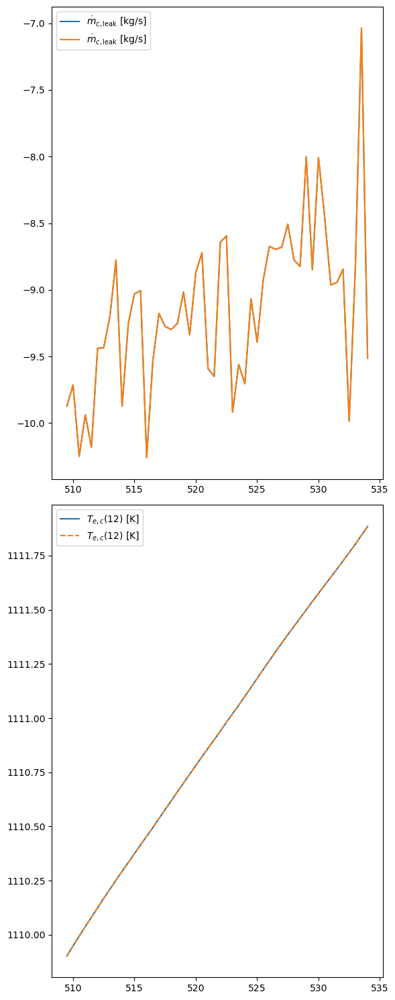

In [ ]:
#%%

#compare the original data with the denormalized data
fig, axs = plt.subplots(2, 1, figsize=(6,15))
#fault_time = 500

axs[0].plot(test_denormalized['t[s]'], test_denormalized['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_denormalized['t[s]'], test_denormalized['Te_c_12'], linestyle='-',  label=r'$ T_{e,c}(12)$ [K]')
axs[1].plot(test_origin['t[s]'], test_origin['Te_c_12'], linestyle='--', label=r'$ T_{e,c}(12)$ [K]')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

plt.tight_layout()
plt.show()

In [ ]:
#%% TESTING THE FORECAST

# forecast the test data
forecast_test = forecast(load_model, to_test[0][1], 4)
real_test = to_test[1][1]

# denormalize the forecasted data
forecast_denorm = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

real_denorm = pd.DataFrame(data=real_test, columns=Y_labels)

In [ ]:
#%%

step_size = 0.5
step_start = test_origin['t[s]'].values[-1] + step_size
step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

forecast_denorm['t[s]'] = np.arange(step_start, step_end, step_size)
real_denorm['t[s]'] = np.arange(step_start, step_end, step_size)

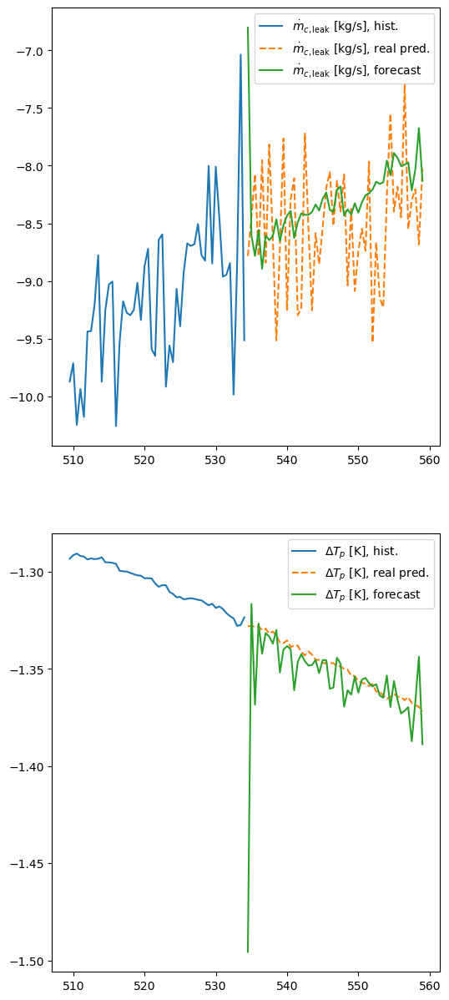

In [ ]:
#%%

for i in range(2):
    label = Y_labels[i]
    forecast_denorm[label] = denormalize_data(forecast_denorm[label].values, max_hrm[label], min_hrm[label])
    real_denorm[label] = denormalize_data(real_denorm[label].values, max_hrm[label], min_hrm[label])

# compare the forecasted data with the real data
fig, axs = plt.subplots(2,1, figsize=(6,15))

axs[0].plot(test_origin['t[s]'], test_origin['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], hist.')
axs[0].plot(real_denorm['t[s]'], real_denorm['mdot_c_leak'], linestyle='--', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], real pred.')
axs[0].plot(forecast_denorm['t[s]'], forecast_denorm['mdot_c_leak'], linestyle='-', label=r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s], forecast')
axs[0].legend()
#axs[1, 1].set_xlim([900,930])  

axs[1].plot(test_origin['t[s]'], test_origin['delta_Tp'], linestyle='-',  label=r'$ \Delta T_{p}$ [K], hist.')
axs[1].plot(real_denorm['t[s]'], real_denorm['delta_Tp'], linestyle='--',  label=r'$ \Delta T_{p}$ [K], real pred.')
axs[1].plot(forecast_denorm['t[s]'], forecast_denorm['delta_Tp'], linestyle='-', label=r'$ \Delta T_{p}$ [K], forecast')
axs[1].legend()
#axs[2, 1].set_xlim([900,930])  

In [ ]:
n_out

50

In [ ]:
test.shape

(12509, 50, 7)

In [ ]:
to_test[0].shape

(12509, 50, 4)

In [ ]:
len(test)

12509

In [ ]:
# %% preparing test set and forecasted data (denormalized)

test_denorm_list = []
forecast_denorm_list = []

test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

for j in range(len(test)):

    # apply denormalized_data to last four colmns of the training set
    test_denorm = pd.DataFrame(data=test[j,:,:], columns=test_cols)

    for label in X_labels:
        test_denorm[label] = denormalize_data(test_denorm[label].values, max_hrm[label], min_hrm[label])

    # dataframe to numpy
    test_denorm_list.append(test_denorm[X_labels].to_numpy())

    # forecast the test data
    forecast_test = forecast(load_model, to_test[0][j], 4)

    # from arrays to dataframes for forecast and real data
    forecast_test = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

    # getting original time index, from test set, to forecast set
    idsim = int(test[j][0,0])
    test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denorm['t[s]'])]
    step_size = 0.5
    step_start = test_origin['t[s]'].values[-1] + step_size
    step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

    forecast_test['t[s]'] = np.arange(step_start, step_end, step_size)

    # denormalizing both dataframes
    for label in Y_labels:
        forecast_test[label] = denormalize_data(forecast_test[label].values, max_hrm[label], min_hrm[label])

    #dataframe to numpy
    forecast_denorm_list.append(forecast_test[Y_labels].to_numpy())


test_denorm_array = np.array(test_denorm_list)
forecast_denorm_array = np.array(forecast_denorm_list)

KeyboardInterrupt: 

In [ ]:
j

9289

In [ ]:
# %% preparing test set and forecasted data (denormalized)

test_denorm_list = []
forecast_denorm_list = []

test_cols = ['ID_sim','t[s]','mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c', 'delta_Tp']
X_labels = ['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']
Y_labels = ['mdot_c_leak', 'delta_Tp']

for j in range(len(test)):

    # apply denormalized_data to last four colmns of the training set
    test_denorm = pd.DataFrame(data=test[j,:,:], columns=test_cols)

    for label in X_labels:
        test_denorm[label] = denormalize_data(test_denorm[label].values, max_hrm[label], min_hrm[label])

    # dataframe to numpy
    test_denorm_list.append(test_denorm[X_labels].to_numpy())

    # forecast the test data
    forecast_test = forecast(load_model, to_test[0][j], 4)

    # from arrays to dataframes for forecast and real data
    forecast_test = pd.DataFrame(data=forecast_test[0,:,:], columns=Y_labels)

    # getting original time index, from test set, to forecast set
    idsim = int(test[j][0,0])
    test_origin = df_list_hrm[idsim][df_list_hrm[idsim]['t[s]'].isin(test_denorm['t[s]'])]
    step_size = 0.5
    step_start = test_origin['t[s]'].values[-1] + step_size
    step_end = test_origin['t[s]'].values[-1] + step_size*(n_out+1)

    forecast_test['t[s]'] = np.arange(step_start, step_end, step_size)

    # denormalizing both dataframes
    for label in Y_labels:
        forecast_test[label] = denormalize_data(forecast_test[label].values, max_hrm[label], min_hrm[label])

    #dataframe to numpy
    forecast_denorm_list.append(forecast_test[Y_labels].to_numpy())


test_denorm_array = np.array(test_denorm_list)
forecast_denorm_array = np.array(forecast_denorm_list)

In [ ]:
test_denorm_array.shape

(12509, 50, 4)

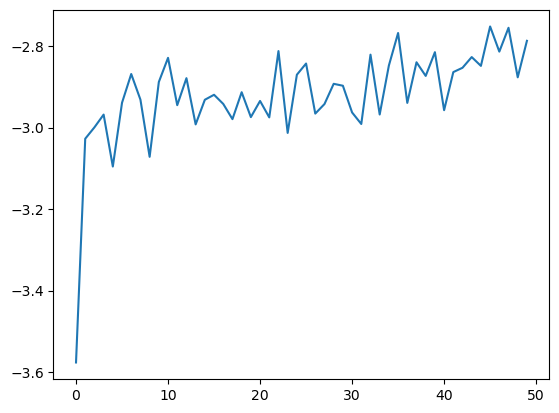

In [ ]:
#%% Using emd python package, instead of matlab

import emd 
#https://emd.readthedocs.io/en/stable/install.html

#taking a single signal from forecast_denorm_array

signal = forecast_denorm_array[0,:,0].reshape(n_out)
plt.plot(signal)

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 3)
#print(imf.shape)

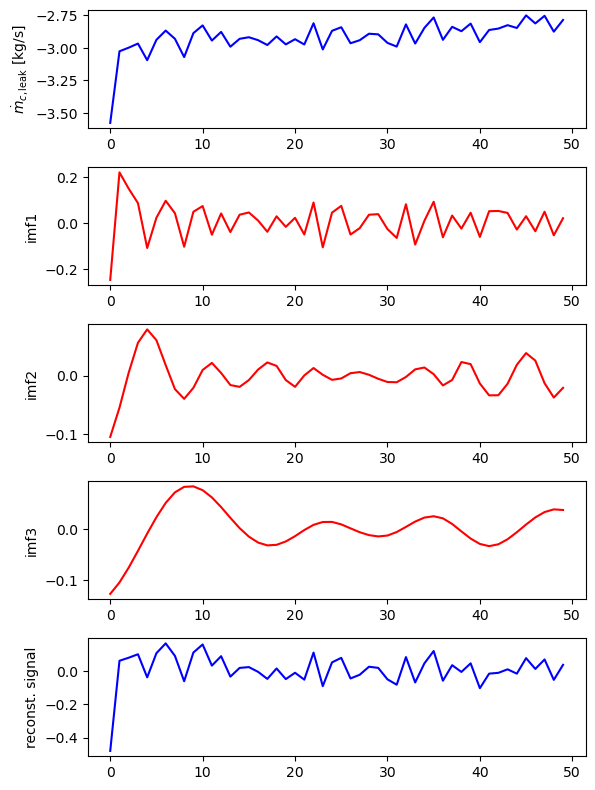

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(5, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 0] + imf[:, 1] + imf[:, 2], linestyle='-', color='b')
axs[4].set_ylabel('reconst. signal')

plt.tight_layout()
plt.show()

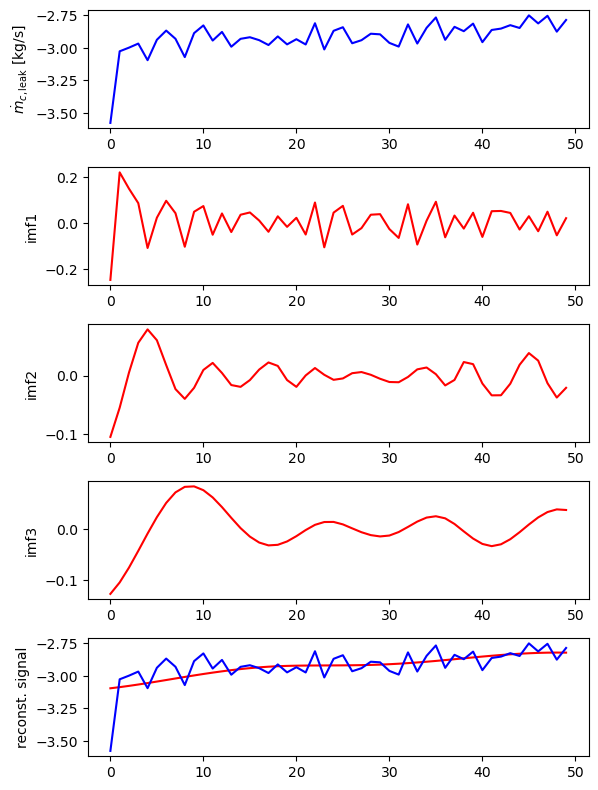

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(5, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf3')

axs[4].plot(imf[:, 0] + imf[:, 1] + imf[:, 2] + imf[:, 3], linestyle='-', color='b')
axs[4].set_ylabel('reconst. signal')

plt.tight_layout()
plt.show()

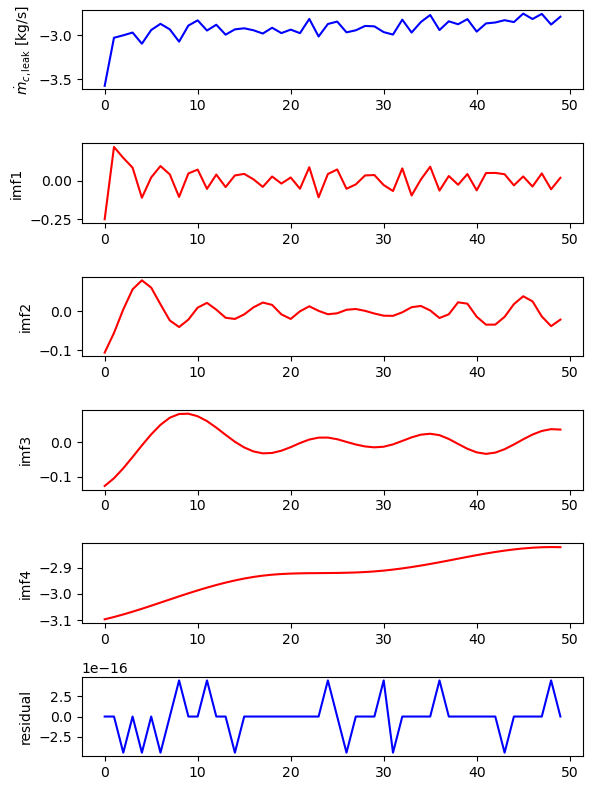

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

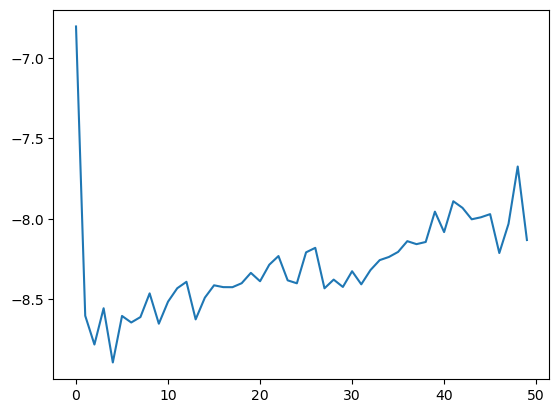

In [ ]:
#%% Using emd python package, instead of matlab

import emd 
#https://emd.readthedocs.io/en/stable/install.html

#taking a single signal from forecast_denorm_array

signal = forecast_denorm_array[1,:,0].reshape(n_out)
plt.plot(signal)

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 4)
#print(imf.shape)

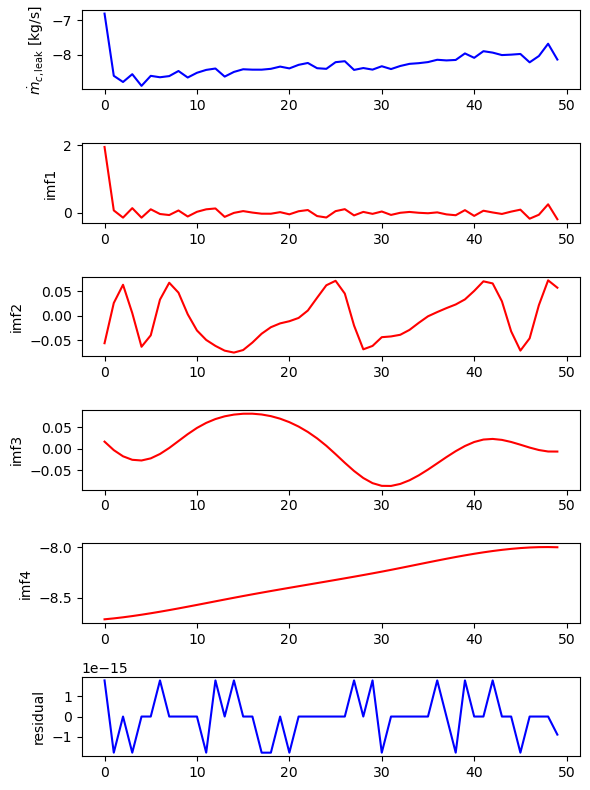

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

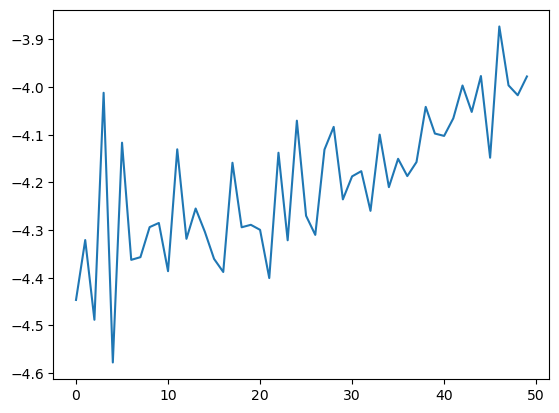

In [ ]:
#%% Using emd python package, instead of matlab

import emd 
#https://emd.readthedocs.io/en/stable/install.html

#taking a single signal from forecast_denorm_array

signal = forecast_denorm_array[2,:,0].reshape(n_out)
plt.plot(signal)

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 4)
#print(imf.shape)

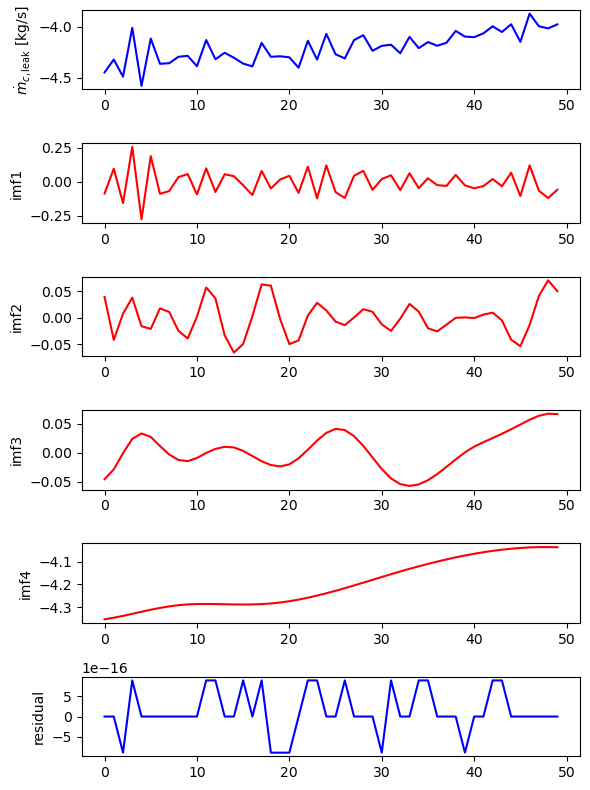

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

In [ ]:
#%% HHT espectra

step_size = 0.5; sample_rate = 1 / step_size
IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')

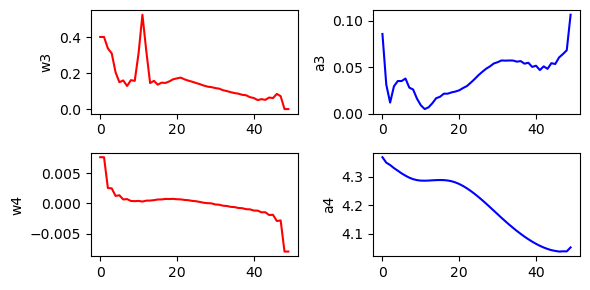

In [ ]:
#%% Plotting the hht

fig, axs = plt.subplots(2, 2, figsize=(6,3))
#fault_time = 500

axs[0,0].plot(IF[:, 2], linestyle='-', color='r')
axs[0,0].set_ylabel('w3')

axs[0,1].plot(IA[:, 2], linestyle='-', color='b')
axs[0,1].set_ylabel('a3')

axs[1,0].plot(IF[:, 3], linestyle='-', color='r')
axs[1,0].set_ylabel('w4')

axs[1,1].plot(IA[:, 3], linestyle='-', color='b')
axs[1,1].set_ylabel('a4')

plt.tight_layout()
plt.show()

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 3)
#print(imf.shape)

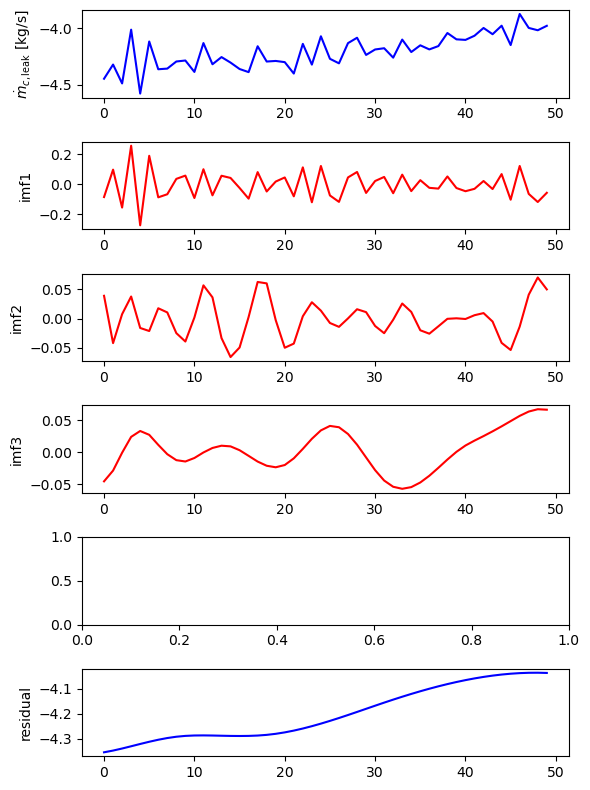

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

#axs[4].plot(imf[:, 3], linestyle='-', color='r')
#axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 4)
#print(imf.shape)

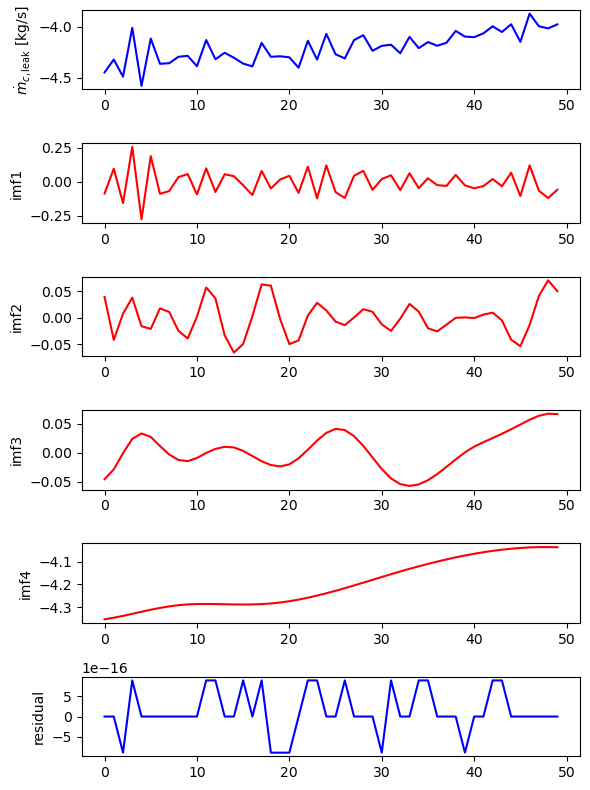

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

(0.0, 0.005)

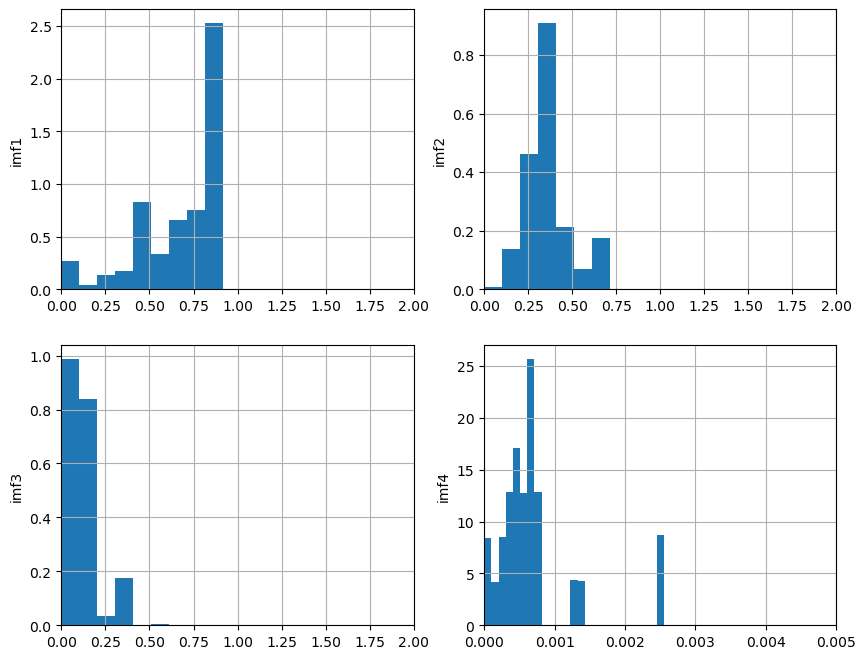

In [ ]:
#%% plotting WEIGHTED frequency of hht for each imf

fig, axs = plt.subplots(2, 2, figsize=(10,8))

axs[0,0].hist(IF[:, 0], np.linspace(0, 5), weights=IA[:, 0])
axs[0,0].grid(True)
axs[0,0].set_ylabel('imf1')
#setting x limits   
axs[0,0].set_xlim([0, 2])

axs[0,1].hist(IF[:, 1], np.linspace(0, 5), weights=IA[:, 1])
axs[0,1].grid(True)
axs[0,1].set_ylabel('imf2')
axs[0,1].set_xlim([0, 2])

axs[1,0].hist(IF[:, 2], np.linspace(0, 5), weights=IA[:, 2])
axs[1,0].grid(True)
axs[1,0].set_ylabel('imf3')
axs[1,0].set_xlim([0, 2])

axs[1,1].hist(IF[:, 3], np.linspace(0, 0.005), weights=IA[:, 3])
axs[1,1].grid(True)
axs[1,1].set_ylabel('imf4')
axs[1,1].set_xlim([0, 0.005])

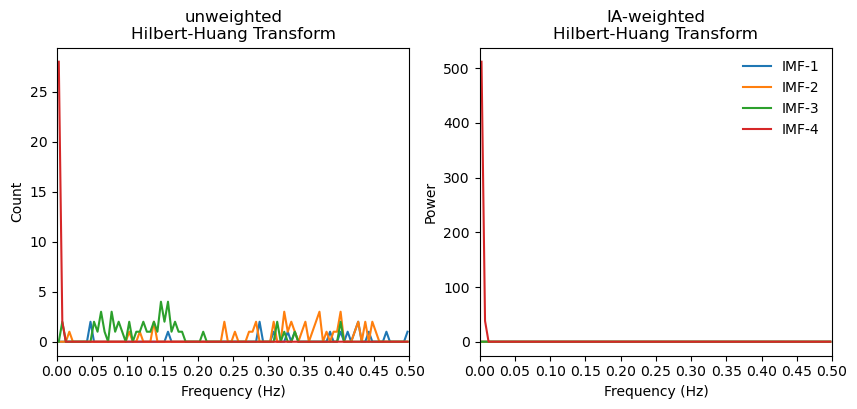

In [ ]:
#%%

freq_edges, freq_centres = emd.spectra.define_hist_bins(0, 0.5, 100, 'linear')

# Amplitude weighted HHT per IMF
f, spec_weighted = emd.spectra.hilberthuang(IF, IA, freq_edges, sum_imfs=False)

# Unweighted HHT per IMF - we replace the instantaneous amplitude values with ones
f, spec_unweighted = emd.spectra.hilberthuang(IF, np.ones_like(IA), freq_edges, sum_imfs=False)

plt.figure(figsize=(10, 4))
plt.subplots_adjust(hspace=0.4)
plt.subplot(121)
plt.plot(freq_centres, spec_unweighted)
plt.xticks(np.linspace(0, .5, num=11))
plt.xlim(0, .5)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Count')
plt.title('unweighted\nHilbert-Huang Transform')

plt.subplot(122)
plt.plot(freq_centres, spec_weighted)
plt.xticks(np.linspace(0, .5, num=11))
plt.xlim(0, .5)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('IA-weighted\nHilbert-Huang Transform')
plt.legend(['IMF-1', 'IMF-2', 'IMF-3', 'IMF-4'], frameon=False)

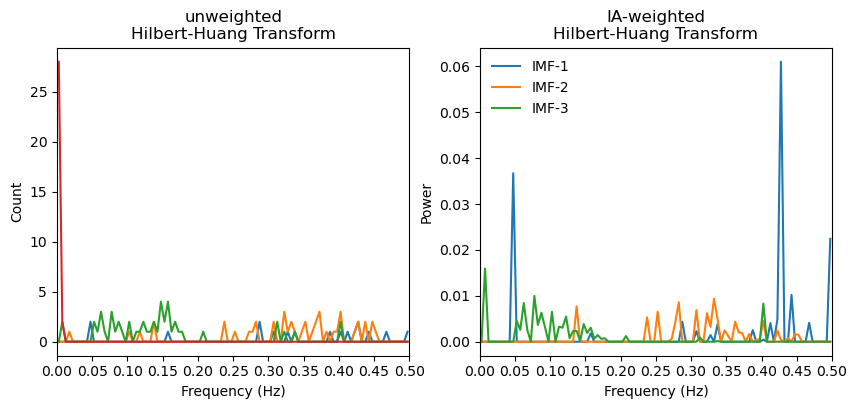

In [ ]:
#%%

freq_edges, freq_centres = emd.spectra.define_hist_bins(0, 0.5, 100, 'linear')

# Amplitude weighted HHT per IMF
f, spec_weighted = emd.spectra.hilberthuang(IF[:,0:3], IA[:,0:3], freq_edges, sum_imfs=False)

# Unweighted HHT per IMF - we replace the instantaneous amplitude values with ones
f, spec_unweighted = emd.spectra.hilberthuang(IF, np.ones_like(IA), freq_edges, sum_imfs=False)

plt.figure(figsize=(10, 4))
plt.subplots_adjust(hspace=0.4)
plt.subplot(121)
plt.plot(freq_centres, spec_unweighted)
plt.xticks(np.linspace(0, .5, num=11))
plt.xlim(0, .5)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Count')
plt.title('unweighted\nHilbert-Huang Transform')

plt.subplot(122)
plt.plot(freq_centres, spec_weighted)
plt.xticks(np.linspace(0, .5, num=11))
plt.xlim(0, .5)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('IA-weighted\nHilbert-Huang Transform')
plt.legend(['IMF-1', 'IMF-2', 'IMF-3', 'IMF-4'], frameon=False)

In [ ]:
IA[:, 0].shape

(50,)

In [ ]:
IA[:, 0] * IA[:, 0]

array([0.05174394, 0.02231662, 0.05596396, 0.07234632, 0.07656743,
       0.05898144, 0.0423736 , 0.02264122, 0.002541  , 0.00384248,
       0.00854636, 0.01287519, 0.01002028, 0.01551608, 0.01048016,
       0.00144812, 0.00934772, 0.01376193, 0.0123479 , 0.01782311,
       0.01883852, 0.01584538, 0.01673869, 0.0145819 , 0.01574865,
       0.02817424, 0.0224384 , 0.0101993 , 0.00725269, 0.00595085,
       0.00739773, 0.00859498, 0.00422186, 0.004131  , 0.00334738,
       0.00100364, 0.00381748, 0.00263735, 0.00294341, 0.00406292,
       0.00231469, 0.00185115, 0.00045194, 0.00119267, 0.00494381,
       0.01222709, 0.02005207, 0.05983199, 0.02519781, 0.01152302])

In [ ]:
#%% calculating features of interest

#mean frequency
mean_freq_imf1 = np.mean(IF[:, 0])
mean_freq_imf4 = np.mean(IF[:, 3])

#mean amplitude
mean_amp_imf1 = np.mean(IA[:, 0])
mean_amp_imf4 = np.mean(IA[:, 3])

#mean power
mean_power_imf1 = np.mean(IA[:, 0] * IA[:, 0])
mean_power_imf4 = np.mean(IA[:, 3] * IA[:, 3])

In [ ]:
mean_power_imf1

0.017179949704434424

In [ ]:
mean_power_imf4

17.660549014487202

In [ ]:
IF.shape

(50, 4)

In [ ]:
[np.mean(IF[:, i]) for i in range(len(IF))]

IndexError: index 4 is out of bounds for axis 1 with size 4

In [ ]:
len(IF)

50

In [ ]:
mean_freq_imfs = [np.mean(IF[:, i]) for i in range(IF.shape[1])]

In [ ]:
mean_freq_imfs

[0.6245051768933366,
 0.3634387798264671,
 0.15109556725928505,
 -4.9325236411633006e-05]

In [ ]:
np.array(mean_freq_imfs)

array([ 6.24505177e-01,  3.63438780e-01,  1.51095567e-01, -4.93252364e-05])

In [ ]:
#%% calculating features of interest

#mean frequency
mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])

#mean amplitude
mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])

#mean power
mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])

In [ ]:
mean_power_imfs

array([1.71799497e-02, 2.02816794e-03, 2.08203187e-03, 1.76605490e+01])

In [ ]:
mean_amp_imfs

array([0.1145753 , 0.03950232, 0.04083605, 4.20112324])

In [ ]:
#%% calculating kucherenko indices for the features

from uqpylab import sessions
mySession = sessions.cloud()

myAnalysis = uq.createAnalysis(SOpts)

Processing . done!

 uqpylab.sessions :: INFO     :: This is UQ[py]Lab, version 0.991, running on https://uqcloud.ethz.ch. 
                                 UQ[py]Lab is free software, published under the open source BSD 3-clause license.
                                 To request special permissions, please contact:
                                  - Stefano Marelli (marelli@ibk.baug.ethz.ch).
                                 A new session (49f6461af594442da19d56f55d8ef7e4) started.


NameError: name 'uq' is not defined

In [ ]:
#%%

myAnalysis = mySession.createAnalysis(SOpts)

AttributeError: 'cloud' object has no attribute 'createAnalysis'

In [ ]:
#%%

# (Optional) Get a convenient handle to the command line interface
uq = mySession.cli
# Reset the session
mySession.reset()

 uqpylab.sessions :: INFO     :: Reset successful.


In [ ]:
test_denorm_array.shape

(12509, 50, 4)

In [ ]:
forecast_denorm_array.shape

(12509, 50, 2)

In [ ]:
#%% Creating features input and output arrays:

# input features from test_denorm_array
# output features from forecast_denorm_array

features_input = []
for s in range(test_denorm_array.shape[0]):
    sample_features = []
    for i in range(test_denorm_array.shape[2]):
        signal = test_denorm_array[s,:,i].reshape(n_out)
        imf = emd.sift.sift(signal, max_imfs = 4)
        IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')
        weights_IA = IA / np.sum(IA, axis=0)
        mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])
        mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])
        mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])
        sample_features.extend([mean_freq_imfs, mean_amp_imfs, mean_power_imfs])
    features_input.append(sample_features)

UnboundLocalError: cannot access local variable 'imf' where it is not associated with a value

In [ ]:
imf

array([[ 8.68012067e-02,  4.92524204e-02,  9.18114504e-03,
        -3.64468938e+00],
       [ 2.51124405e-01,  9.67199815e-02, -1.52306752e-02,
        -3.62393227e+00],
       [-2.17763474e-01,  7.75355017e-03, -3.60309236e-02,
        -3.60030784e+00],
       [ 1.94036847e-01, -7.08305510e-02, -4.55945405e-02,
        -3.57517253e+00],
       [-2.64355806e-01, -3.46765406e-02, -3.64868215e-02,
        -3.54974100e+00],
       [ 1.33773697e-02,  1.88676342e-02, -8.83796321e-03,
        -3.52490512e+00],
       [ 5.73332486e-01,  2.45681227e-02,  3.53306129e-02,
        -3.50147611e+00],
       [ 1.70760683e-01, -3.31292799e-02,  9.00228078e-02,
        -3.48026514e+00],
       [-6.15527618e-01, -5.82764288e-02,  1.35385043e-01,
        -3.46208343e+00],
       [-6.03252549e-02,  2.48170338e-02,  1.56734319e-01,
        -3.44774218e+00],
       [ 2.88965065e-01,  1.27885200e-01,  1.45033568e-01,
        -3.43773595e+00],
       [-1.52586185e-01,  1.24459812e-01,  9.55544068e-02,
      

In [ ]:
s

0

In [ ]:
i

1

In [ ]:
signal

array([1110.32165247, 1110.33688461, 1110.35210512, 1110.36699987,
       1110.38257506, 1110.39796172, 1110.41392216, 1110.42959968,
       1110.44411422, 1110.45848999, 1110.47386608, 1110.48877442,
       1110.50281642, 1110.51709779, 1110.53136212, 1110.54647192,
       1110.56167401, 1110.57683305, 1110.59197528, 1110.60738962,
       1110.62244648, 1110.63762756, 1110.65259187, 1110.66772675,
       1110.68171689, 1110.69646571, 1110.71079206, 1110.7247189 ,
       1110.73920953, 1110.75418235, 1110.76903564, 1110.78369585,
       1110.79875961, 1110.81432792, 1110.82885035, 1110.84364418,
       1110.85780591, 1110.87105972, 1110.88496591, 1110.89893546,
       1110.9132461 , 1110.92727043, 1110.94227653, 1110.9572246 ,
       1110.97195267, 1110.98617814, 1111.00033386, 1111.01376124,
       1111.02723433, 1111.04046919])

In [ ]:
imf = emd.sift.sift(signal, max_imfs = 4)

UnboundLocalError: cannot access local variable 'imf' where it is not associated with a value

In [ ]:
signal

array([1110.32165247, 1110.33688461, 1110.35210512, 1110.36699987,
       1110.38257506, 1110.39796172, 1110.41392216, 1110.42959968,
       1110.44411422, 1110.45848999, 1110.47386608, 1110.48877442,
       1110.50281642, 1110.51709779, 1110.53136212, 1110.54647192,
       1110.56167401, 1110.57683305, 1110.59197528, 1110.60738962,
       1110.62244648, 1110.63762756, 1110.65259187, 1110.66772675,
       1110.68171689, 1110.69646571, 1110.71079206, 1110.7247189 ,
       1110.73920953, 1110.75418235, 1110.76903564, 1110.78369585,
       1110.79875961, 1110.81432792, 1110.82885035, 1110.84364418,
       1110.85780591, 1110.87105972, 1110.88496591, 1110.89893546,
       1110.9132461 , 1110.92727043, 1110.94227653, 1110.9572246 ,
       1110.97195267, 1110.98617814, 1111.00033386, 1111.01376124,
       1111.02723433, 1111.04046919])

In [ ]:
plot(signal)

NameError: name 'plot' is not defined

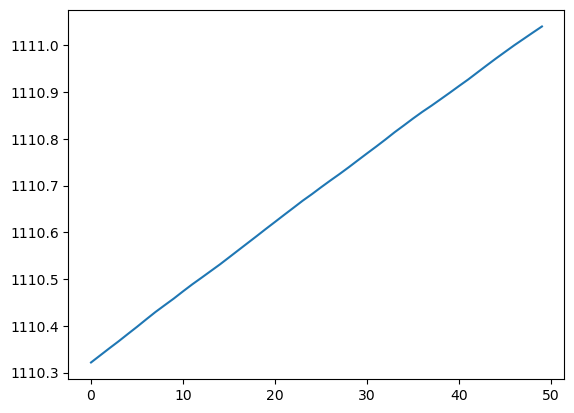

In [ ]:
plt.plot(signal)

In [ ]:
i

1

In [ ]:
signal = test_denorm_array[s,:,2].reshape(n_out)
imf = emd.sift.sift(signal, max_imfs = 4)

UnboundLocalError: cannot access local variable 'imf' where it is not associated with a value

In [ ]:
plot(signal)

NameError: name 'plot' is not defined

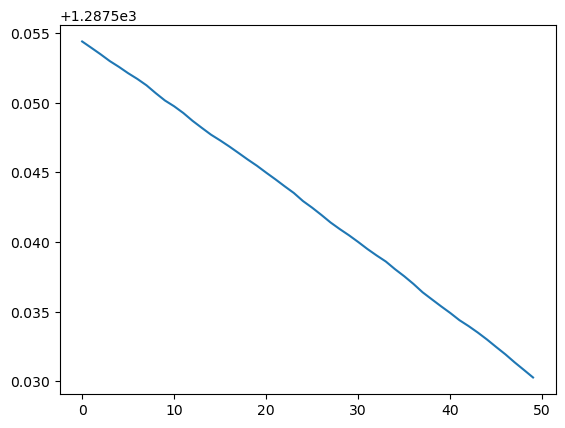

In [ ]:
plt.plot(signal)

In [ ]:
signal = test_denorm_array[s,:,3].reshape(n_out)
imf = emd.sift.sift(signal, max_imfs = 4)

UnboundLocalError: cannot access local variable 'imf' where it is not associated with a value

In [ ]:
plot(signal)

NameError: name 'plot' is not defined

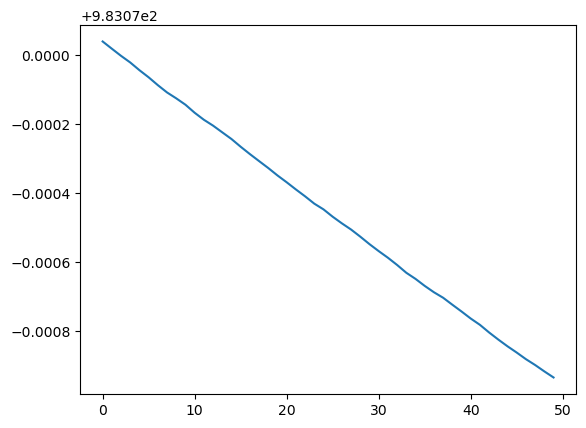

In [ ]:
plt.plot(signal)

In [ ]:
signal = test_denorm_array[s,:,0].reshape(n_out)
imf = emd.sift.sift(signal, max_imfs = 4)

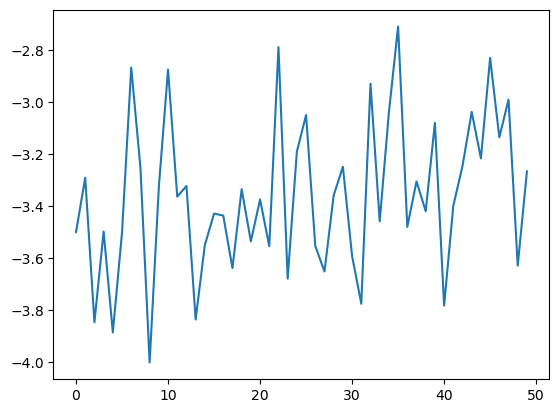

In [ ]:
plt.plot(signal)

In [ ]:
#%% Creating features input and output arrays:

# input features from test_denorm_array
# output features from forecast_denorm_array

features_input = []
for s in range(test_denorm_array.shape[0]):
    sample_features = []
    for i in range(test_denorm_array.shape[2]):
        signal = test_denorm_array[s,:,i].reshape(n_out)
        imf = emd.sift.sift(signal, max_imfs = 1)
        IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')
        weights_IA = IA / np.sum(IA, axis=0)
        mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])
        mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])
        mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])
        sample_features.extend([mean_freq_imfs, mean_amp_imfs, mean_power_imfs])
    features_input.append(sample_features)

UnboundLocalError: cannot access local variable 'imf' where it is not associated with a value

In [ ]:
i

1

In [ ]:
signal

array([1110.32165247, 1110.33688461, 1110.35210512, 1110.36699987,
       1110.38257506, 1110.39796172, 1110.41392216, 1110.42959968,
       1110.44411422, 1110.45848999, 1110.47386608, 1110.48877442,
       1110.50281642, 1110.51709779, 1110.53136212, 1110.54647192,
       1110.56167401, 1110.57683305, 1110.59197528, 1110.60738962,
       1110.62244648, 1110.63762756, 1110.65259187, 1110.66772675,
       1110.68171689, 1110.69646571, 1110.71079206, 1110.7247189 ,
       1110.73920953, 1110.75418235, 1110.76903564, 1110.78369585,
       1110.79875961, 1110.81432792, 1110.82885035, 1110.84364418,
       1110.85780591, 1110.87105972, 1110.88496591, 1110.89893546,
       1110.9132461 , 1110.92727043, 1110.94227653, 1110.9572246 ,
       1110.97195267, 1110.98617814, 1111.00033386, 1111.01376124,
       1111.02723433, 1111.04046919])

In [ ]:
IP, IF, IA = emd.spectra.frequency_transform(signal, sample_rate, 'hilbert')

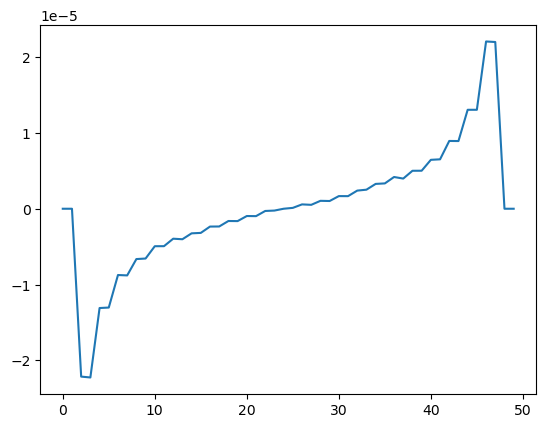

In [ ]:
plt.plot(IF)

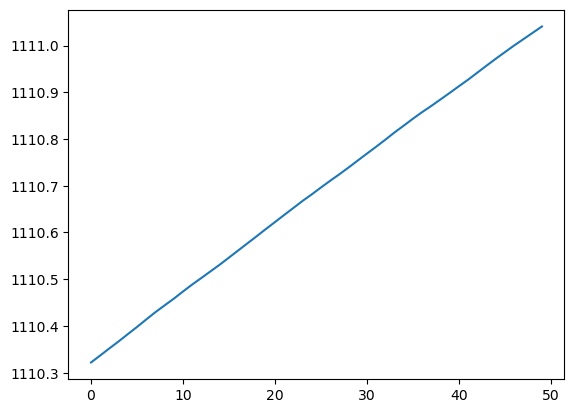

In [ ]:
plt.plot(IA)

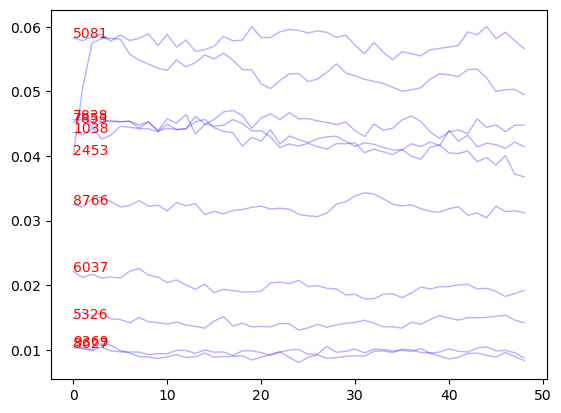

In [ ]:
#%% Exploratory analysis

# plotting first signal of test_denorm_array multiple times
plt.figure()
#colors = plt.cm.winter(np.linspace(0, 1, 100))  # Use a colormap for different colors

for i in range(10):
    #select random signals from test_denorm_array.shape[0]
    r = random.randint(0, test_denorm_array.shape[0])
    plt.plot(np.diff(test_denorm_array[r,:,1]), alpha=0.3, color='b', linewidth=1)
    # plot id of signal based on r
    plt.text(0, np.diff(test_denorm_array[r,:,1])[0], str(r), color='r')

plt.show()

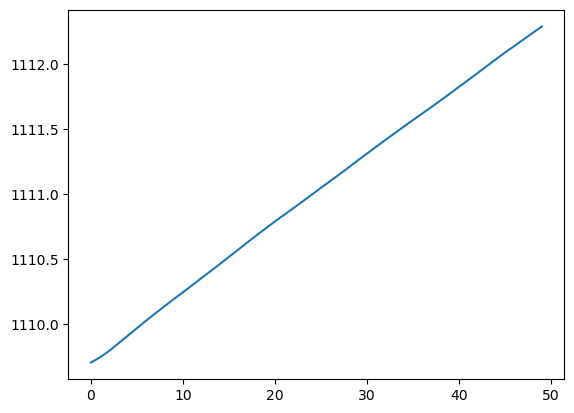

In [ ]:
plt.plot(test_denorm_array[2453,:,1])

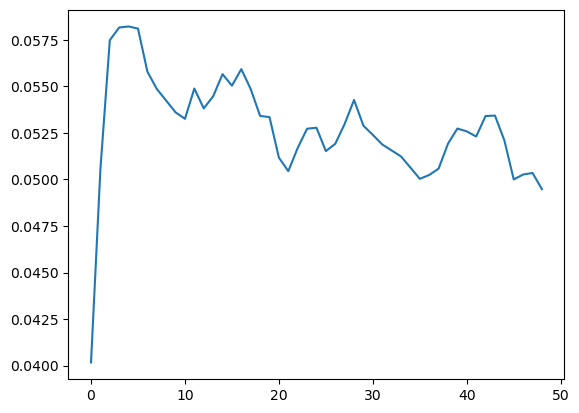

In [ ]:
plt.plot(np.diff(test_denorm_array[2453,:,1]))

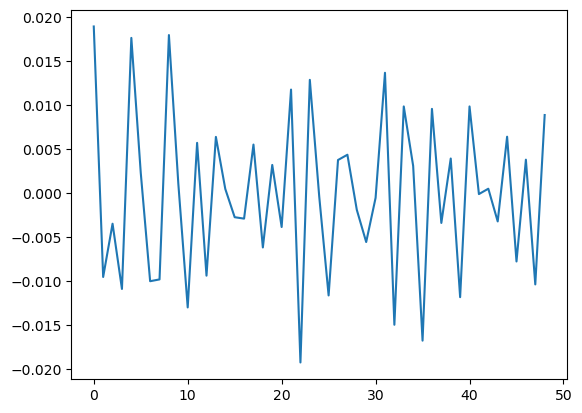

In [ ]:
#%% Using emd python package, instead of matlab

import emd 
#https://emd.readthedocs.io/en/stable/install.html

#taking a single signal from forecast_denorm_array

signal = np.diff(forecast_denorm_array[0,:,1].reshape(n_out))
plt.plot(signal)

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 4)
#print(imf.shape)

In [ ]:
imf

array([[ 2.57107523e-02,  1.24831395e-03, -5.74818621e-03,
        -2.26399401e-03],
       [-1.47844517e-03, -1.65049285e-03, -4.48661531e-03,
        -1.91332202e-03],
       [ 3.62108867e-03, -2.74331229e-03, -2.80099237e-03,
        -1.55245005e-03],
       [-8.65226181e-03, -9.93083589e-05, -9.47459370e-04,
        -1.18978539e-03],
       [ 1.36396120e-02,  4.00665187e-03,  8.36168356e-04,
        -8.33735292e-04],
       [-5.05860565e-03,  5.57134683e-03,  2.31742160e-03,
        -4.92707030e-04],
       [-1.76931562e-02,  4.56842237e-03,  3.29031452e-03,
        -1.75107870e-04],
       [-1.55933397e-02,  1.98833069e-03,  3.68867481e-03,
         1.10654921e-04],
       [ 1.51561189e-02, -1.14887264e-03,  3.60833376e-03,
         3.56174075e-04],
       [ 1.24705891e-03, -3.88380902e-03,  3.17732329e-03,
         5.54721774e-04],
       [-1.06575875e-02, -5.55589427e-03,  2.51695751e-03,
         7.06288001e-04],
       [ 8.77457088e-03, -5.61622979e-03,  1.74687109e-03,
      

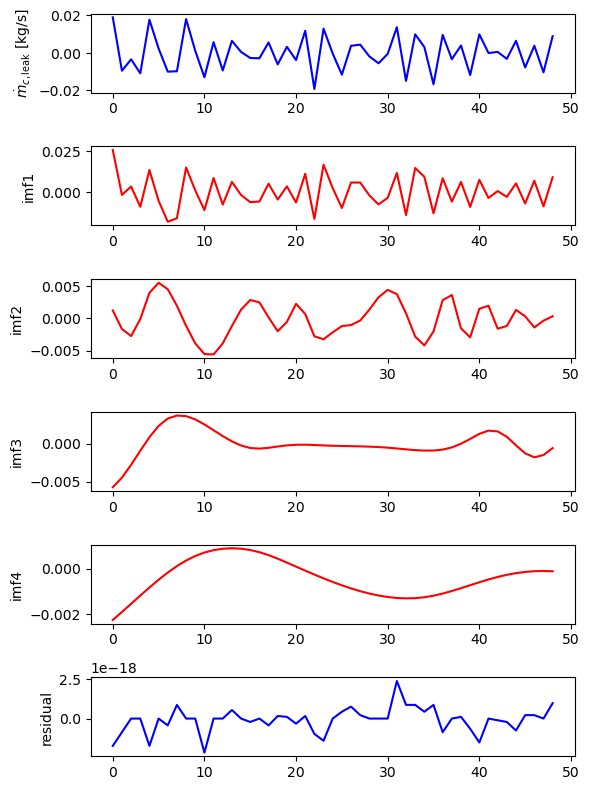

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

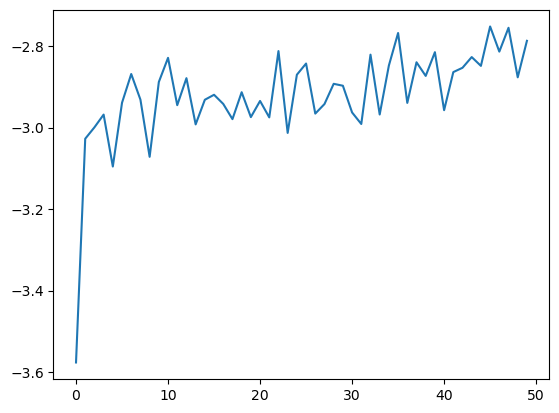

In [ ]:
#%% Using emd python package, instead of matlab

import emd 
#https://emd.readthedocs.io/en/stable/install.html

#taking a single signal from forecast_denorm_array

signal = forecast_denorm_array[0,:,0].reshape(n_out)
plt.plot(signal)

In [ ]:
#%% sifting and plotting the imfs

# performing the emd
imf = emd.sift.sift(signal, max_imfs = 4)
#print(imf.shape)

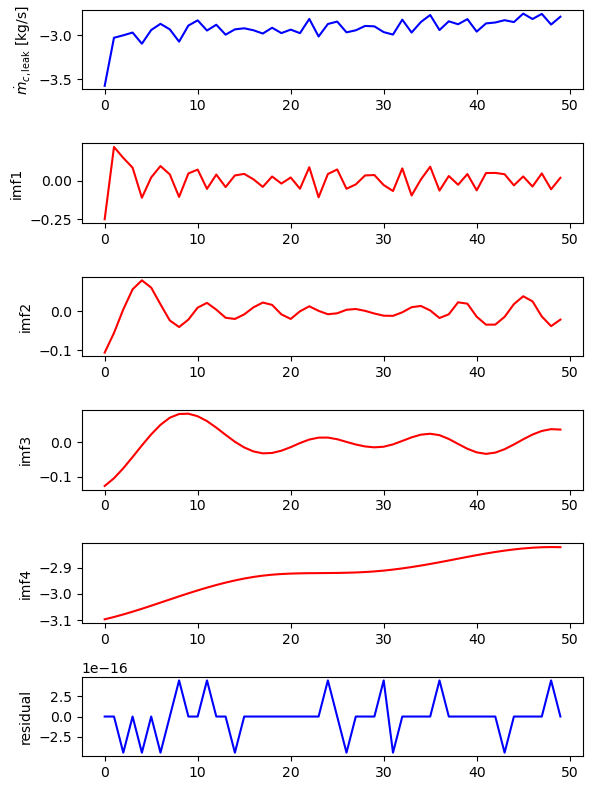

In [ ]:
#%% plotting the imfs

#emd.plotting.plot_imfs(imf, sharey=False, sample_rate=1/0.5)

fig, axs = plt.subplots(6, 1, figsize=(6,8))
#fault_time = 500

axs[0].plot(signal, linestyle='-', color='b')
axs[0].set_ylabel(r'$\dot{m}_{c,\mathrm{leak}}$ [kg/s]')

axs[1].plot(imf[:, 0], linestyle='-', color='r')
axs[1].set_ylabel('imf1')

axs[2].plot(imf[:, 1], linestyle='-', color='r')
axs[2].set_ylabel('imf2')

axs[3].plot(imf[:, 2], linestyle='-', color='r')
axs[3].set_ylabel('imf3')

axs[4].plot(imf[:, 3], linestyle='-', color='r')
axs[4].set_ylabel('imf4')

axs[5].plot(signal - imf[:, 0] - imf[:, 1] - imf[:, 2] - imf[:, 3], linestyle='-', color='b')
axs[5].set_ylabel('residual')

plt.tight_layout()
plt.show()

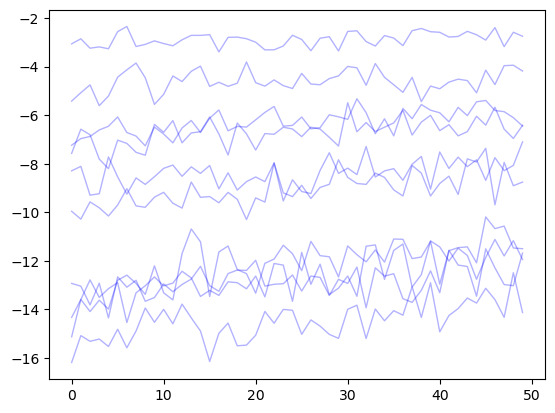

In [ ]:
#%% Exploratory analysis

# plotting first signal of test_denorm_array multiple times
plt.figure()
#colors = plt.cm.winter(np.linspace(0, 1, 100))  # Use a colormap for different colors

for i in range(10):
    #select random signals from test_denorm_array.shape[0]
    r = random.randint(0, test_denorm_array.shape[0])
    plt.plot(test_denorm_array[r,:,0], alpha=0.3, color='b', linewidth=1)
    # plot id of signal based on r
    # plt.text(0, test_denorm_array[r,:,0][0], str(r), color='r')

plt.show()

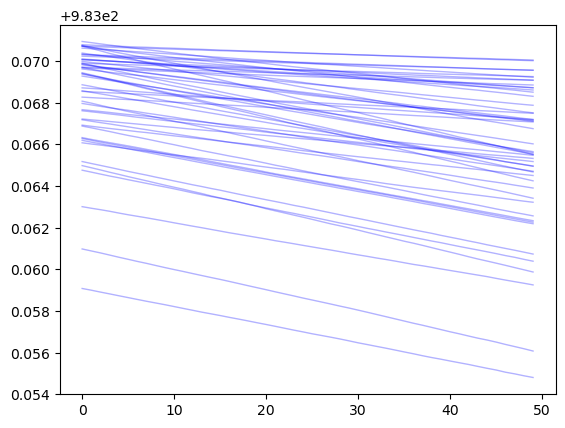

In [ ]:
#%% Exploratory analysis

# plotting first signal of test_denorm_array multiple times
plt.figure()
#colors = plt.cm.winter(np.linspace(0, 1, 100))  # Use a colormap for different colors

for i in range(50):
    #select random signals from test_denorm_array.shape[0]
    r = random.randint(0, test_denorm_array.shape[0])
    plt.plot(test_denorm_array[r,:,3], alpha=0.3, color='b', linewidth=1)
    # plot id of signal based on r
    # plt.text(0, test_denorm_array[r,:,0][0], str(r), color='r')

plt.show()

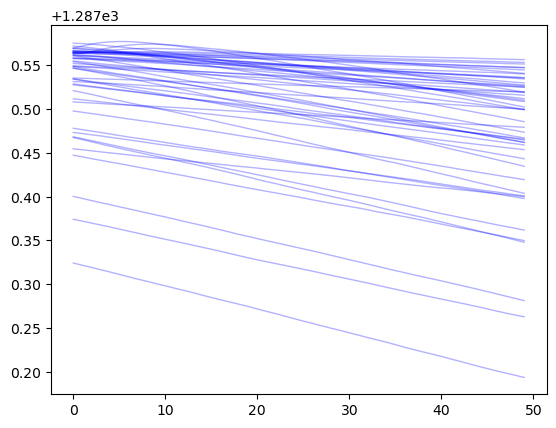

In [ ]:
#%% Exploratory analysis

# plotting first signal of test_denorm_array multiple times
plt.figure()
#colors = plt.cm.winter(np.linspace(0, 1, 100))  # Use a colormap for different colors

for i in range(50):
    #select random signals from test_denorm_array.shape[0]
    r = random.randint(0, test_denorm_array.shape[0])
    plt.plot(test_denorm_array[r,:,2], alpha=0.3, color='b', linewidth=1)
    # plot id of signal based on r
    # plt.text(0, test_denorm_array[r,:,0][0], str(r), color='r')

plt.show()

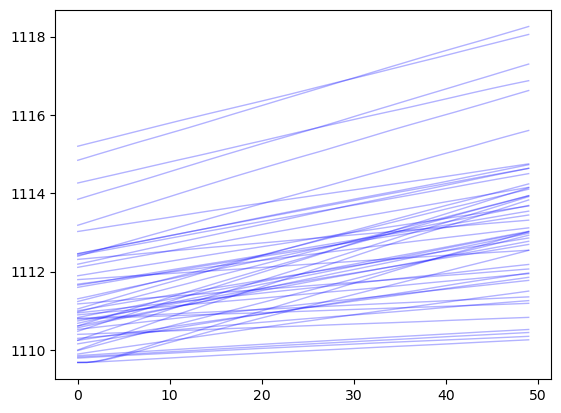

In [ ]:
#%% Exploratory analysis

# plotting first signal of test_denorm_array multiple times
plt.figure()
#colors = plt.cm.winter(np.linspace(0, 1, 100))  # Use a colormap for different colors

for i in range(50):
    #select random signals from test_denorm_array.shape[0]
    r = random.randint(0, test_denorm_array.shape[0])
    plt.plot(test_denorm_array[r,:,1], alpha=0.3, color='b', linewidth=1)
    # plot id of signal based on r
    # plt.text(0, test_denorm_array[r,:,0][0], str(r), color='r')

plt.show()

In [ ]:
#%% Creating features input and output arrays:

# input features from test_denorm_array
# output features from forecast_denorm_array

features_input = []
for s in range(test_denorm_array.shape[0]):
    sample_features = []
    for i in range(test_denorm_array.shape[2]):
        signal = test_denorm_array[s,:,i].reshape(n_out)
        if i == 0:
            imf = emd.sift.sift(signal, max_imfs = 4)
            IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')
            weights_IA = IA / np.sum(IA, axis=0)
            mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])
            mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])
            mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])
            sample_features.extend([mean_freq_imfs[0], mean_freq_imfs[-1], 
                                    mean_amp_imfs[0], mean_amp_imfs[-1], 
                                    mean_power_imfs[0], mean_power_imfs[-1]])
        else:
            #monotonic signalS, no need to sift (and hilbert transform?)
            #fitting a linear regression to the signal, getting the slope
            t = np.arange(0, 0.5*n_out, 0.5)
            slope, _, _, _, _ = stats.linregress(t, signal)
            sample_features.append(slope)

            #mean and std of the signal
            sample_features.extend([np.mean(signal), np.std(signal)])
    features_input.append(sample_features)

KeyboardInterrupt: 

In [ ]:
s

4876

In [ ]:
#%% Creating features input and output arrays:

# input features from test_denorm_array
# output features from forecast_denorm_array

features_input = []
for s in range(test_denorm_array.shape[0]):
    sample_features = []
    for i in range(test_denorm_array.shape[2]):
        signal = test_denorm_array[s,:,i].reshape(n_out)
        if i == 0:
            imf = emd.sift.sift(signal, max_imfs = 4)
            IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')
            weights_IA = IA / np.sum(IA, axis=0)
            mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])
            mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])
            mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])
            sample_features.extend([mean_freq_imfs[0], mean_freq_imfs[-1], 
                                    mean_amp_imfs[0], mean_amp_imfs[-1], 
                                    mean_power_imfs[0], mean_power_imfs[-1]])
        else:
            #monotonic signalS, no need to sift (and hilbert transform?)
            #fitting a linear regression to the signal, getting the slope
            t = np.arange(0, 0.5*n_out, 0.5)
            slope, _, _, _, _ = stats.linregress(t, signal)
            sample_features.append(slope)

            #mean and std of the signal
            sample_features.extend([np.mean(signal), np.std(signal)])
    features_input.append(sample_features)

In [ ]:
np.array(features_input).shape

(12509, 15)

In [ ]:
#%%

# output features from forecast_denorm_array

features_output = []
for s in range(forecast_denorm_array.shape[0]):
    sample_features = []
    for i in range(forecast_denorm_array.shape[2]):
        signal = forecast_denorm_array[s,:,i].reshape(n_out)
        imf = emd.sift.sift(signal, max_imfs = 4)
        IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'hilbert')
        weights_IA = IA / np.sum(IA, axis=0)
        mean_freq_imfs = np.array([np.mean(IF[:, i]) for i in range(IF.shape[1])])
        mean_amp_imfs = np.array([np.mean(IA[:, i]) for i in range(IF.shape[1])])
        mean_power_imfs = np.array([np.mean(IA[:, i] * IA[:, i]) for i in range(IF.shape[1])])
        sample_features.extend([mean_freq_imfs[0], mean_freq_imfs[-1], 
                                mean_amp_imfs[0], mean_amp_imfs[-1], 
                                mean_power_imfs[0], mean_power_imfs[-1]])
    features_output.append(sample_features)

In [ ]:
np.array(features_output).shape

(12509, 12)

In [ ]:
uq

In [ ]:
#%% 

KucherenkoSensOpts = {
'Type': 'Sensitivity',
'Method': 'Kucherenko',
}

KucherenkoSensOpts['Kucherenko']['Estimator'] = {
'SampleBased
}

# manually providing the samples
KucherenkoSensOpts['Kucherenko']['Samples'] = {
'X': features_input,
'Y': features_output
}

KucherenkoAnalysis = uq.createAnalysis(KucherenkoSensOpts)

SyntaxError: unterminated string literal (detected at line 8) (<ipython-input-283-837d8137383b>, line 8)

In [ ]:
#%% 

KucherenkoSensOpts = {
'Type': 'Sensitivity',
'Method': 'Kucherenko',
}

KucherenkoSensOpts['Kucherenko']['Estimator'] = {
'SampleBased'
}

# manually providing the samples
KucherenkoSensOpts['Kucherenko']['Samples'] = {
'X': features_input,
'Y': features_output
}

KucherenkoAnalysis = uq.createAnalysis(KucherenkoSensOpts)

KeyError: 'Kucherenko'

In [ ]:
#%% 

SOpts = {
'Type': 'Sensitivity',
'Method': 'Kucherenko'
}

In [ ]:
#%%

SOpts['Kucherenko']['Estimator'] = {
'SampleBased'
}

KeyError: 'Kucherenko'

In [ ]:
#%%

SOpts['Kucherenko']['Estimator'] = 'SampleBased'

KeyError: 'Kucherenko'

In [ ]:
#%%

SOpts['Kucherenko'] = {'Estimator':'SampleBased'} 

In [ ]:
#%%

# manually providing the samples
SOpts['Kucherenko']['Samples'] = {
'X': features_input,
'Y': features_output
}

KucherenkoAnalysis = uq.createAnalysis(KucherenkoSensOpts)

Processing . done!



RuntimeError: Error: Unrecognized field name "Kucherenko".

In [ ]:
#%% 

SOpts = {
'Type': 'Sensitivity',
'Method': 'Kucherenko',
}

In [ ]:
#%%

SOpts['Kucherenko'] = {'Estimator':'SampleBased'} 

In [ ]:
#%%

# manually providing the samples
SOpts['Kucherenko']['Samples'] = {
'X': features_input,
'Y': features_output
}

In [ ]:
#%%

KucherenkoAnalysis = uq.createAnalysis(SOpts)

In [ ]:
#%%

uq.print(KucherenkoAnalysis)

--------------------------------------------------
  Total Kucherenko indices for output component 1
--------------------------------------------------
X1          X2          X3          X4          X5          X6          X7          X8          X9          X10         X11         X12         X13         X14         X15         
0.999705    0.999705    0.999705    0.999705    0.999705    0.999705    0.999705    0.999705    0.999705    0.999709    0.999705    0.999705    0.999996    0.999705    0.999705    
--------------------------------------------------
--------------------------------------------------
  First Order Kucherenko indices for output component 1
--------------------------------------------------
X1          X2          X3          X4          X5          X6          X7          X8          X9          X10         X11         X12         X13         X14         X15         
0.053583    0.024598    0.447706    0.673578    0.468381    0.673249    0.676197    0.299683    

In [ ]:
KucherenkoAnalysis['Results']

{'FirstOrder': [[0.05358308327247482,
   0.010891170328394309,
   0.01503180852293359,
   0.013828885193036038,
   0.01645482489970854,
   0.01587574585303712,
   0.12974310502018233,
   0.01397352622439635,
   0.013129353280861449,
   0.017243047036779684,
   0.014489336850982106,
   0.017686430995357102],
  [0.024597543573897044,
   0.21913234304267648,
   0.031577791614667915,
   0.03709996957753692,
   0.02513784901104458,
   0.03282744779030045,
   0.019026738357147598,
   0.027081413823740876,
   0.029603770052515372,
   0.09016422346681223,
   0.027093859132119976,
   0.09178518862983882],
  [0.44770562109307416,
   0.4504386779975865,
   0.7897318801508859,
   0.7954383312881768,
   0.6033148635047991,
   0.7134190338823663,
   0.1176402414200091,
   0.21145255527131823,
   0.7820960238405917,
   0.7129971396773442,
   0.515791384774507,
   0.6891200145800874],
  [0.6735783496813644,
   0.5881872970873476,
   0.9593625241199522,
   0.9991225583821115,
   0.9443883191385104,
   

In [ ]:
#%% Plots for analysis - kucherenko first-order sensisitvity indices

kucherenko_output = np.array(KucherenkoAnalysis['Results']['FirstOrder'])

input_labels = ['mean_freq_imf1', 'mean_freq_imf4', 'mean_amp_imf1', 'mean_amp_imf4', 'mean_power_imf1', 'mean_power_imf4',
                'slope_Te_c_12', 'mean_Te_c_12', 'std_Te_c_12',
                'slope__Te_f_12', 'mean__Te_f_12', 'std__Te_f_12',
                'slope_Tin_c', 'mean_Tin_c', 'std_Tin_c']

output_labels = ['leak_mean_freq_imf1', 'leak_mean_freq_imf4', 'leak_mean_amp_imf1', 'leak_mean_amp_imf4', 'leak_mean_power_imf1', 'leak_mean_power_imf4',
                'mean_freq_imf1', 'mean_freq_imf4', 'mean_amp_imf1', 'mean_amp_imf4', 'mean_power_imf1', 'mean_power_imf4']

kucherenko_df_data = [[input_labels[i],output_labels[j],kucherenko_output[i,j]] 
                    for i in range(kucherenko_output.shape[0]) 
                    for j in range(kucherenko_output.shape[1])]

kucherenko_df = pd.DataFrame(kucherenko_df_data, columns=['input', 'output', 'first_order'])

In [ ]:
#%% Plots for analysis - kucherenko first-order sensisitvity indices

kucherenko_output = np.array(KucherenkoAnalysis['Results']['FirstOrder'])

input_labels = ['mean_freq_imf1', 'mean_freq_imf4', 'mean_amp_imf1', 'mean_amp_imf4', 'mean_power_imf1', 'mean_power_imf4',
                'slope_Te_c_12', 'mean_Te_c_12', 'std_Te_c_12',
                'slope_Te_f_12', 'mean_Te_f_12', 'std_Te_f_12',
                'slope_Tin_c', 'mean_Tin_c', 'std_Tin_c']

output_labels = ['leak_mean_freq_imf1', 'leak_mean_freq_imf4', 'leak_mean_amp_imf1', 'leak_mean_amp_imf4', 'leak_mean_power_imf1', 'leak_mean_power_imf4',
                'mean_freq_imf1', 'mean_freq_imf4', 'mean_amp_imf1', 'mean_amp_imf4', 'mean_power_imf1', 'mean_power_imf4']

kucherenko_df_data = [[input_labels[i],output_labels[j],kucherenko_output[i,j]] 
                    for i in range(kucherenko_output.shape[0]) 
                    for j in range(kucherenko_output.shape[1])]

kucherenko_df = pd.DataFrame(kucherenko_df_data, columns=['input', 'output', 'first_order'])

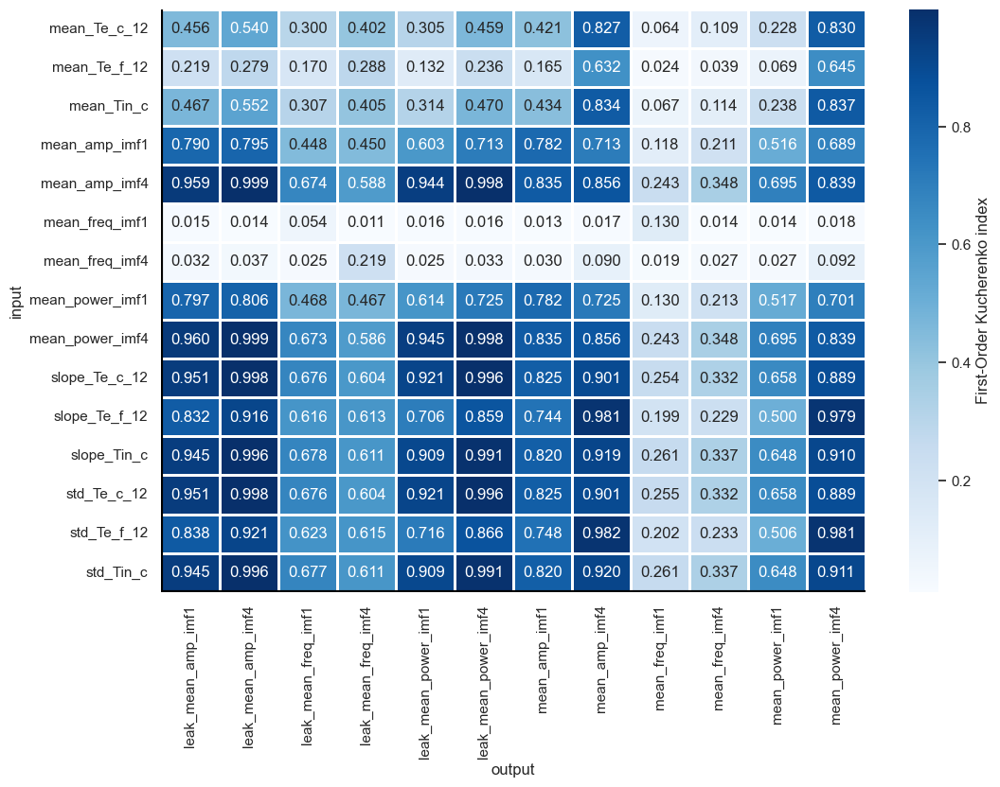

In [ ]:
#%% heatmap for first-order sensitivity indices

import seaborn as sns
sns.set_theme()

# Load the example flights dataset and convert to long-form
indices = (
    kucherenko_df.pivot(index="input", columns="output", values="first_order")
)

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(indices, annot=True, fmt=".3f", linewidths=.9, ax=ax, cmap='Blues', cbar_kws={'label': 'First-Order Kucherenko index'})
# set the heat legend to the right
#f.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
# Add a horizontal line above the output labels
ax.hlines(y=15, xmin=0, xmax=len(indices.columns), color='black', linewidth=3)
# Add a vertical line in front of the input labels
ax.vlines(x=0, ymin=0, ymax=len(indices.index), color='black', linewidth=3)

In [ ]:
np.save('test_denorm_array.npy', test_denorm_array)

In [ ]:
np.save('forecast_denorm_array.npy', forecast_denorm_array)

In [ ]:
X_labels

['mdot_c_leak', 'Te_c_12', 'Te_f_12', 'Tin_c']

In [ ]:
session

NameError: name 'session' is not defined

In [ ]:
mySession